# **Redes Neuronales para PLN - Práctica Final**
## Notebook 2 - ML baselines: Naive Bayes, SVM, Random Forests, etc.
### Alumno: Alvarez Lacasa, Lucas Alfredo

En esta notebook, nos enfocaremos en definir algunas baselines para nuestras tareas a través de modelos ligeros basados en Machine Learning.
Más concretamente, abordaremos tareas como:
- **Representación de texto en espacios vectoriales**: Bag of Words (tf, tf-idf) combinado con selección de características como `n-grams` o `chi-squared`. 
- **Entrenamiento, validación y test de diversos algoritmos**.
- **Comprobación de performance**, tanto si consideramos la tarea como multi-class classification o binary classification. 
  Utilizaremos `macro F1` como principal métrica de comparación, pero reportaremos también `accuracy`, `precision` y `recall`.

⚠️ Pretender abarcar todas las combinaciones de datasets, algoritmos, representaciones de texto y selección de características no es realista de cara a llegar a concluir con esta práctica final. Por este motivo, intentaré acotar mucho más a las pruebas que vaya haciendo, utilizando intuición y resultados para ver cómo continuar. No realizaré una exploración tan profunda para cada algoritmo de sus hiperparámetros como lo he hecho en prácticas anteriores. Esto no sólo aplica para esta notebook, si no para todas las consecutivas también.
<br> Por motivos obvios, tampoco volveré a incluir las explicaciones que ya he hecho en prácticas anteriores sobre cada algoritmo y técnica de representación de texto en espacios vectoriales. Intentaré ser mucho más expeditivo y tomar todo el código que me sirva de forma de acelerar la experimentación.
  

# Imports globales

Los imports son declarados en esta primera sección de la notebook

In [1]:
import abc
import itertools
import os
import random
from dataclasses import dataclass

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xgboost as xgb
from sklearn.base import BaseEstimator
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.model_selection import GridSearchCV, PredefinedSplit, BaseCrossValidator, learning_curve
from sklearn.naive_bayes import MultinomialNB
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC

# Funciones y clases auxiliares

Definiré un conjunto de funciones y clases utilitarias para evitar duplicación de código, haciendo que la notebook sea más mantenible y sencilla de volver a ejecutar. Creo que en general se trata de una buena práctica sobre todo en notebooks largas para poder aislar ejecución de código de forma de que sea menos probable cometer errores.

La gran mayoría de funciones y clases utilitarias (sin importar para qué sección del índice correspondan) serán listadas aquí por una cuestión de simplicidad y de poder re-cargar la notebook más fácilmente mientras desarrollo.

In [2]:
"""
=========================
Route resolution class

EDIT THIS CLASS depending on where you will be running this notebook!
=========================
"""

COLAB_BASE_MOUNT_POINT: str = "/content/drive"


@dataclass
class RouteConfig:
    notebook_name: str
    run_in_colab: bool = False
    # TODO: Change this to your base Colab path!!! =========>
    colab_base_mount_point: str = COLAB_BASE_MOUNT_POINT
    colab_practice_base_dir: str = f"{COLAB_BASE_MOUNT_POINT}/My Drive/UNED/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge"
    local_practice_base_dir: str = "/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge"
    # ======================================================>
    dataset_rel_folder_path: str = os.path.join("data", "dataset", "OffendES")
    dataset_train_file_name: str = "train.csv"
    dataset_test_file_name: str = "test.csv"
    exp_output_rel_folder_path: str = "experiment_output"


class RouteResolver:
    """ This object abstracts the retrieval of the files used in this notebook by only editing the RouteConfig class received """

    def __init__(self, route_config: RouteConfig) -> None:
        if route_config.run_in_colab:
            # Import and mount into the base mount path for Google Colab
            from google.colab import drive
            drive.mount(route_config.colab_base_mount_point)

        self._config: RouteConfig = route_config

        # Create experiment output folder for this notebook
        exp_output_notebook_folder: str = self.current_exp_output_folder()
        if not os.path.isdir(exp_output_notebook_folder):
            print(f"Experiment output folder for this notebook does not exist. Creating...")
            os.mkdir(exp_output_notebook_folder)

    def base_folder_path(self) -> str:
        """Returns the base path depending if you're running in Colab or not"""
        return self._config.colab_practice_base_dir if self._config.run_in_colab else self._config.local_practice_base_dir

    def get_datasets_folder(self) -> str:
        """Returns the dataset folder"""
        return os.path.join(self.base_folder_path(), self._config.dataset_rel_folder_path)

    def get_training_dataset_path(self) -> str:
        """Returns path to the original training dataset file."""
        return os.path.join(self.get_datasets_folder(), self._config.dataset_train_file_name)

    def get_testing_dataset_path(self) -> str:
        """Returns path to the original test dataset file."""
        return os.path.join(self.get_datasets_folder(), self._config.dataset_test_file_name)

    def get_exp_output_folder(self) -> str:
        """Returns the path to the experiment outputs folder"""
        return os.path.join(self.base_folder_path(), self._config.exp_output_rel_folder_path)

    def get_exp_output_notebook_folder(self, flow_number: int) -> str:
        """Given flow number if returns the experiment output folder for it"""
        notebook_name: str = f"PracticaFinal_AlvarezLacasaLucas_{str(flow_number)}"
        exp_output_notebook_folder: str = os.path.join(self.get_exp_output_folder(), notebook_name)
        validate_condition(condition=os.path.isdir(exp_output_notebook_folder),
                           msg=f"Can't find experiment output for flow: {notebook_name}")
        return exp_output_notebook_folder

    def current_exp_output_folder(self) -> str:
        """Returns experiment output folder for current notebook being ran"""
        return os.path.join(self.get_exp_output_folder(), self._config.notebook_name)

    def dump_registered_paths(self) -> None:
        running_env: str = "COLAB" if self._config.run_in_colab else "LOCAL"
        print("Registered application paths ========")
        print(f"Running environment: {running_env}")
        print(f"Experiment output for this notebook is located in: {self.current_exp_output_folder()}")
        print(f"Original Training dataset file is located in: {self.get_training_dataset_path()}")
        print(f"Original Test dataset file is located in: {self.get_testing_dataset_path()}")

In [3]:
"""
=========================================
General utility functions
=========================================
"""


class HateSpeechConfig:
    """ Helper class to manage labels info for our datasets """

    def __init__(self):
        self.labels: list[str] = ["NO", "NOM", "OFP", "OFG"]
        self.binary_labels: list[str] = ["no_hate", "hate"]
        self._label2binlabel: dict[str, str] = {
            "NO": "no_hate",
            "NOM": "no_hate",
            "OFP": "hate",
            "OFG": "hate"
        }

    def map_to_binary_label(self, label: str) -> str:
        """Maps fine-grained label to binary label"""
        return self._label2binlabel[label]

    def map_to_label_index(self, label: str) -> int:
        if label in self.labels:
            return self.labels.index(label)
        return self.binary_labels.index(label)

    def labels2index(self, binary: bool = False) -> dict[str, int]:
        proper_list: list[str] = self.labels if not binary else self.binary_labels
        return {l: idx for idx, l in enumerate(proper_list)}

    def random_hate_speech_label(self, labels: list[str] | None = None) -> str:
        """
        Randomly takes an element from a list
        Typically used for models that have more options than "hate" or "no_hate"
        '"""
        # List of possible outcomes
        options: list[str] = list(self.labels) if not labels else labels
        # Randomly select one of the outcomes
        return random.choice(options)


def validate_condition(condition: bool, msg: str, exc_type: type[Exception] = ValueError) -> None:
    """
    If condition is not met, it will raise a ValueError with the arguments provided
    :param condition: condition to validate
    :param msg: string to display in the error
    :param exc_type: type of exception we want to raise. ValueError by default
    :return: ValueError in case condition is not met, None otherwise
    """
    if not condition:
        raise exc_type(msg)


def create_dir_if_not_exists(folder: str) -> None:
    # Create a directory if it does not exist already
    if not os.path.isdir(folder):
        os.mkdir(folder)

In [4]:
"""
===========================
Training and validation
===========================
"""


def prepare_data_for_training(dataset_folder: str, label_field: str = "label", comment_field: str = "comment") -> dict[
    str, list[str]]:
    """ 
    Receives the dataset folder, loads the files for training, validation and test and returns a dictionary that
    goes from the name of set and the value (x or y) to each of the values.
    
    No deduplication is executed, as datasets are properly crafted in the previous notebook
    """
    set_names: list[str] = ["train", "val", "test"]
    set_paths: list[str] = [os.path.join(dataset_folder, "train.csv"),
                            os.path.join(dataset_folder, "val.csv"),
                            os.path.join(dataset_folder, "test.csv")]
    result: dict[str, list[str]] = {}

    for set_name, set_path in zip(set_names, set_paths):
        set_df: pd.DataFrame = pd.read_csv(set_path, quotechar='"', header=0, sep=",")
        result[f"x_{set_name}"] = list(set_df[comment_field])
        result[f"y_{set_name}"] = list(set_df[label_field])
        print(f"Total elements for {set_name}: {len(set_df)}")

    return result

In [5]:
"""
===========================
Visualization functions
===========================
"""


def plot_learning_curve(estimator: BaseEstimator,
                        title: str,
                        X,
                        y,
                        ylim: tuple[int, int] | None = None,
                        cv: int | BaseCrossValidator = 5,
                        train_sizes=np.linspace(.1, 1.0, 5)) -> None:
    """
    Generate a simple plot of the test and traning learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : integer, cross-validation generator, optional
        If an integer is passed, it is the number of folds (defaults to 3).
        Specific cross-validation objects can be passed, see
        sklearn.cross_validation module for the list of possible objects
    """

    plt.figure()
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, n_jobs=1, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.legend(loc="best")
    plt.grid(True)
    if ylim:
        plt.ylim(ylim)
    plt.title(title)


def plot_confusion_matrix(cm, classes: list[str],
                          normalize: bool = False,
                          title: str = 'Confusion matrix',
                          cmap=plt.cm.Blues) -> None:
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.

    cm: confusion_matrix from scikit_learn.metrics
    classes: array with the classes
    title: the title to put on the chart
    cmap: the color palette to use
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure()
    plt.title(title)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

# Resolución de rutas

Utilizaremos una clase `RouteResolver` para resolver las rutas, de forma de aislar esa información allí y poder modificarla en un único punto del notebook.

Verificar el output de la siguiente celda en caso de querer re-ejecutar la notebook para asegurarse de que las rutas apuntan al lugar correcto. Esta vez utilicé `run_in_colab=False` ya que pude entrenar los modelos de Machine Learning en mi laptop personal sin necesidad de GPU.

In [6]:
# Routes
route_resolver: RouteResolver = RouteResolver(
    RouteConfig(run_in_colab=False, notebook_name="2_ml_baselines"))
route_resolver.dump_registered_paths()

Registered application paths ========
Running environment: LOCAL
Experiment output for this notebook is located in: /home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_2
Original Training dataset file is located in: /home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/data/dataset/OffendES/train.csv
Original Test dataset file is located in: /home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/data/dataset/OffendES/test.csv


# Datasets generados en `1_data_exploration`

Definiremos los paths a los datasets generados anteriormente, de forma de poder usarlos en esta notebook.

In [7]:
notebook1_output_folder: str = route_resolver.get_exp_output_notebook_folder(1)
dataset_v1_folder: str = os.path.join(notebook1_output_folder, "v1")
dataset_v2_folder: str = os.path.join(notebook1_output_folder, "v2")
dataset_v3_folder: str = os.path.join(notebook1_output_folder, "v3")
dataset_v6_folder: str = os.path.join(notebook1_output_folder, "v6")

# Algoritmos de Machine Learning para hate-speech recognition

De acuerdo con el research que realicé, los algoritmos de ML que históricamente han performado mejor para esta tarea son Support Vector Machine (SVM) y XGBoost. Por completitud, y debido a que este notebook tiene como objetivo brindar baselines, también exploraré algún otro que sea un poco más básico para ver qué performance nos da.

Al igual que antes, dispondremos de una clase que nos ayude a entrenar las diversas combinaciones que queremos probar, de forma de no cometer errores y poder repetir más fácilmente.

In [8]:
class ClassifierBase(abc.ABC):
    """ 
    Abstract class that defines an interface all classifiers must meet (both non-dl and deep learning ones).
    If properly implemented, we could use any of the classifier interchangeably in future tests.
    """

    @abc.abstractmethod
    def train(self, x_train: list[str], y_train: list[str], x_val: list[str], y_val: list[str]) -> None:
        pass

    @abc.abstractmethod
    def predict(self, x_test: list[str]) -> list:
        pass

    def _set_random_seeds(self, random_seed: int) -> None:
        """ Sets random seeds to a given value, so results can be reproduced """
        # tf.random.set_seed(random_seed)
        np.random.seed(random_seed)
        random.seed(random_seed)


class MLClassifier(ClassifierBase):
    def __init__(self,
                 estimator: BaseEstimator,
                 vectorizer: CountVectorizer,
                 optimization_grid: dict | None = None,
                 feat_selector: SelectKBest | None = None,
                 verbosity: int = 5) -> None:
        self._estimator: BaseEstimator = estimator
        self._vectorizer: CountVectorizer = vectorizer
        self._feat_selector: SelectKBest = feat_selector
        self._optimization_grid: dict = {} if optimization_grid is None else optimization_grid
        self._label_encoder: LabelEncoder = LabelEncoder()
        self._verbosity = verbosity
        self._hs_config: HateSpeechConfig = HateSpeechConfig()

    def train(self, x_train: list[str], y_train: list[str], x_val: list[str], y_val: list[str]) -> None:
        """
        Trains classifier using validation from the given set
        :param x_train: training documents. They will be vectorized here.
        :param y_train: training labels. They will be to numeric labels here.
        :return:
        """
        x_all: list[str] = x_train + x_val
        y_all: list[str] = y_train + y_val

        print("Training feature extractor on x_train...")
        x_vec = self._vectorizer.fit_transform(x_all)
        print("Feature extractor trained!")

        if self._feat_selector:
            print("Training feature selector on vectorized x_train...")
            x_vec = self._feat_selector.fit_transform(x_vec, y_all)
            print("Feature selector trained!")

        print("Training label encoder on y_train")
        self._label_encoder.fit(y_all)
        encoded_y_train: list = self._label_encoder.transform(y_all)
        print("Label encoder trained!")

        # Use the predefined split for validation! Don't do cross-validation
        # Create an array that indicates the split: -1 for training, 0 for validation
        test_fold = np.concatenate((np.full(len(x_train), -1, dtype=int), np.zeros(len(x_val), dtype=int)))
        ps: PredefinedSplit = PredefinedSplit(test_fold)

        # Perform GridSearchCV with the predefined split
        self._classifier: GridSearchCV = GridSearchCV(estimator=self._estimator,
                                                      param_grid=self._optimization_grid,
                                                      cv=ps,
                                                      error_score=0.0,
                                                      n_jobs=-1,
                                                      verbose=self._verbosity)
        print(f"Training classifier with predefined split given by the validation set")
        self._classifier.fit(X=x_vec, y=encoded_y_train)
        print(f"Best estimator is: {self._classifier.best_estimator_}")
        print("Model trained correctly")

        # Scores on validation set
        self._plot_validation_scores()
        # Learning curve
        self._plot_learning_curve(x_vec=x_vec, encoded_y_train=encoded_y_train, cv=ps)

    def _plot_validation_scores(self) -> None:
        print("Plotting val-scores for each grid configuration")
        means: list[float] = self._classifier.cv_results_['mean_test_score']
        stds: list[float] = self._classifier.cv_results_['std_test_score']
        print(self._classifier.cv_results_)
        for mean, std, params in sorted(zip(means, stds, self._classifier.cv_results_['params']), key=lambda x: -x[0]):
            print("Accuracy: %0.3f (+/-%0.03f) for params: %r" % (mean, std * 2, params))
        print()

    def _plot_learning_curve(self, x_vec: list, encoded_y_train: list, cv: BaseCrossValidator) -> None:
        print("Plotting Learning curve for the best estimator...")
        title: str = 'Learning Curves (' + str(self._estimator.__class__).replace("'>", "").split(".")[-1] + ' )'
        plot_learning_curve(estimator=self._classifier.best_estimator_,
                            title=title,
                            X=x_vec,
                            y=encoded_y_train,
                            cv=cv)
        plt.show()

    def predict(self, x_test: list[str], binary: bool = False) -> list[str]:
        # Apply prediction on several samples. Model must have been trained first.
        x_test_vec = self._vectorizer.transform(x_test)
        if self._feat_selector:
            x_test_vec = self._feat_selector.transform(x_test_vec)
        y_pred_int: list[int] = self._classifier.best_estimator_.predict(x_test_vec)
        y_pred: list[str] = self._label_encoder.inverse_transform(y_pred_int)
        y_pred_binary: list[str] = [self._hs_config.map_to_binary_label(l) for l in y_pred]

        return y_pred if not binary else y_pred_binary

    def label_encoder_classes(self) -> list[str]:
        return self._label_encoder.classes_

    def predict_with_report(self, x_test: list[str], y_true: list[str], is_binary_train: bool = False) -> None:
        y_pred: list[str] = self.predict(x_test=x_test)
        if not is_binary_train:
            print("\n TEST SET REPORT (MULTI-CLASS) =================================")
            label_classes: list[str] = self._label_encoder.classes_
            print(classification_report(y_true=y_true, y_pred=y_pred, target_names=label_classes, digits=4))
            cm = confusion_matrix(y_true=y_true, y_pred=y_pred, labels=label_classes)
            plot_confusion_matrix(cm, classes=label_classes, title="Confusion matrix for multi-class labels")
            print(f"Test Accuracy: {round(accuracy_score(y_true, y_pred), 4)}")
            print(f"Test macro-F1: {round(f1_score(y_true=y_true, y_pred=y_pred, average='macro'), 4)}")

        print("\n\n TEST SET REPORT (BINARY-CLASS) =================================")
        y_true_binary: list[str] = [self._hs_config.map_to_binary_label(l) for l in y_true]
        y_pred_binary: list[str] = [self._hs_config.map_to_binary_label(l) for l in y_pred]
        label_classes_binary: list[str] = ["hate", "no_hate"]
        print(classification_report(y_true=y_true_binary, y_pred=y_pred_binary, target_names=label_classes_binary,
                                    digits=4))
        cm = confusion_matrix(y_true=y_true_binary, y_pred=y_pred_binary, labels=label_classes_binary)
        plot_confusion_matrix(cm, classes=label_classes_binary, title="Confusion matrix for binary labels")
        print(f"Test Accuracy: {round(accuracy_score(y_true_binary, y_pred_binary), 4)}")
        print(f"Test macro-F1: {round(f1_score(y_true=y_true_binary, y_pred=y_pred_binary, average='macro'), 4)}")

        print(f"\n\n\n")

    @property
    def classifier(self) -> GridSearchCV:
        return self._classifier

    @property
    def best_estimator(self) -> BaseEstimator | None:
        """ Requires model to have been trained first """
        return self._classifier.best_estimator_

## Naive Bayes

Usaremos [MultinomialNB](https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html) para esto.

De acuerdo a la documentación de scikit learn, este es el listado de parámetros que podríamos explorar:

```
- alpha: float or array-like of shape (n_features,), default=1.0
Additive (Laplace/Lidstone) smoothing parameter (set alpha=0 and force_alpha=True, for no smoothing).
- force_alpha: bool, default=False
If False and alpha is less than 1e-10, it will set alpha to 1e-10. If True, alpha will remain unchanged. This may cause numerical errors if alpha is too close to 0.
New in version 1.2.
Deprecated since version 1.2: The default value of force_alpha will change to True in v1.4.
- fit_prior: bool, default=True
Whether to learn class prior probabilities or not. If false, a uniform prior will be used.
- class_prior: array-like of shape (n_classes,), default=None
Prior probabilities of the classes. If specified, the priors are not adjusted according to the data.
```

No veo demasiado sentido en explorar ninguno de los parámetros, ya que en general `alpha` suele ser seteado como 1.0 y los prior (`fit_prior` y `class_prior`) pueden ser ajustados en función de los datos que le damos.


Realizaremos una primera prueba rápida para ver que el código usado antes funciona correctamente.

In [89]:
# We can see the parameters and their defaults fairly easily with the following command
MultinomialNB().get_params()

{'alpha': 1.0, 'class_prior': None, 'fit_prior': True, 'force_alpha': True}

TRAINING with dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' =======================
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 1), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation set
Fitting 1 folds for each of 1 candidates, totalling 1 fits


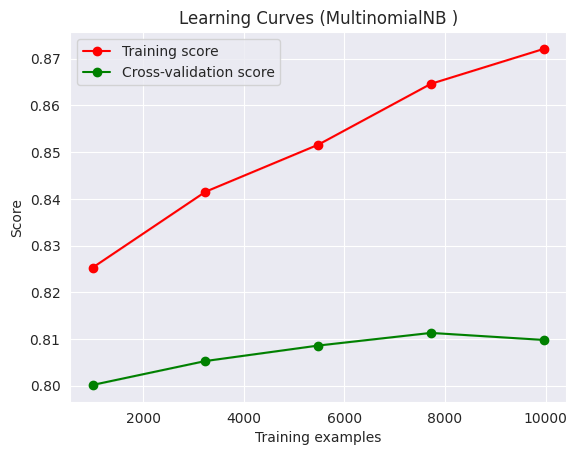


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.83      0.99      0.91      2642
         NOM       0.73      0.14      0.24       247
         OFG       0.00      0.00      0.00        43
         OFP       0.76      0.28      0.41       404

    accuracy                           0.83      3336
   macro avg       0.58      0.35      0.39      3336
weighted avg       0.81      0.83      0.78      3336



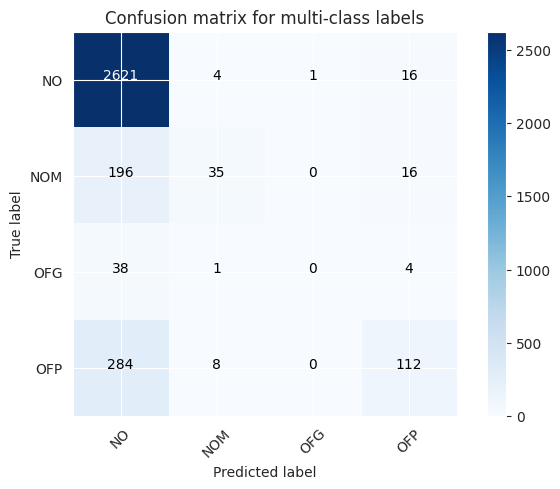

Test Accuracy: 0.8297
Test macro-F1: 0.3875


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.78      0.26      0.39       447
     no_hate       0.90      0.99      0.94      2889

    accuracy                           0.89      3336
   macro avg       0.84      0.62      0.66      3336
weighted avg       0.88      0.89      0.87      3336



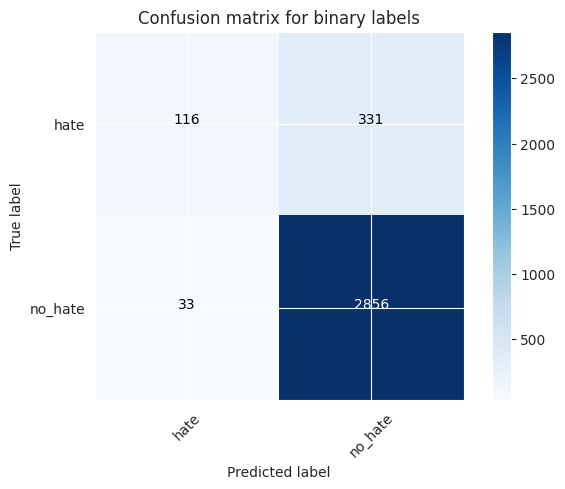

Test Accuracy: 0.8909
Test macro-F1: 0.6647






In [90]:
for dataset_folder in [dataset_v1_folder]:
    # TRAINING & VALIDATION ===============>
    print(f"TRAINING with dataset: '{dataset_folder}' =======================")
    x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_v1_folder)

    count_vectorizer: CountVectorizer = CountVectorizer(analyzer="word")
    print(f"Vectorizer class used: '{type(count_vectorizer)}' with config: {count_vectorizer.get_params()}")

    model: MLClassifier = MLClassifier(estimator=MultinomialNB(),
                                       vectorizer=count_vectorizer,
                                       optimization_grid=None,
                                       feat_selector=None)

    x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                      x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

    model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
    # TESTING =================>
    model.predict_with_report(x_test=x_test, y_true=y_test)

Con esta prueba rápida podemos comprobar que nuestro código funciona. Varios detalles:
- Se aprecia como reportar `accuracy` para este caso de tanto desbalance no tiene mucho sentido. F1-macro tiene mucho más sentido si queremos algo que considere el desabalance de clases.
- Tal y como anticipábamos en la notebook anterior, al tener un dataset tan balanceado, terminamos teniendo un modelo que tiende a predecir la mayoría de las cosas como `no_hate`. Más específicamente, como `NO` si pensamos en término de las cuatro labels.
- La clase `OFG` no es predecida nunca por el modelo. En parte también esperable, porque está muy poco representada en el training set.
- La performance obtenida es del **82.97% de accuracy (multi-class) y 89.09% (binary-class)**, lo cual en principio no pareceria tan mala. Sin embargo, si miramos los F1-macro, las performances son del **38.75% (multi-class) y 66.47% (binary-class)**, una performance realmente muy mala.
- Suena a que el gran responsable de todo esto es el propio training set. Realizaremos rápidamente alguna prueba extra con otros modelos para ver cómo funcionan y volveremos al notebook anterior a crear alguna variante adicional que podamos usar.

Comenzaré dejando el mismo modelo, y utilizando n-grams y TF/TF-IDF para ver qué sucede.

In [92]:
train_conditions: list[dict] = [
    {
        "name": "tf-1",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 2))
    },
    {
        "name": "tf-2",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 3))
    },
    {
        "name": "tf-idf-1",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 2))
    },
    {
        "name": "tf-idf-2",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

TRAINING condition: 'tf-1' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation set
Fitting 1 folds for each of 1 candidates, 

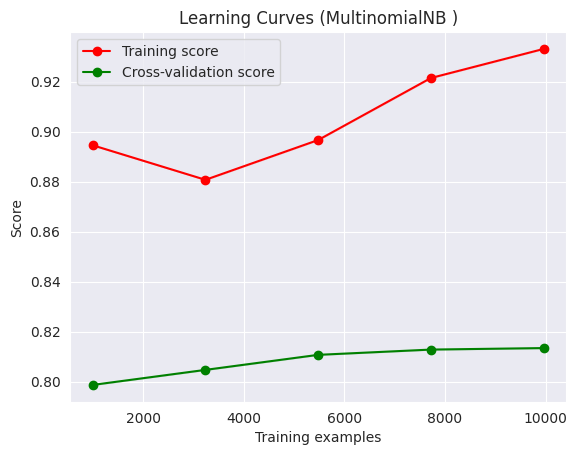


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.81      1.00      0.90      2642
         NOM       0.73      0.08      0.14       247
         OFG       0.00      0.00      0.00        43
         OFP       0.89      0.14      0.24       404

    accuracy                           0.81      3336
   macro avg       0.61      0.30      0.32      3336
weighted avg       0.81      0.81      0.75      3336



/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.

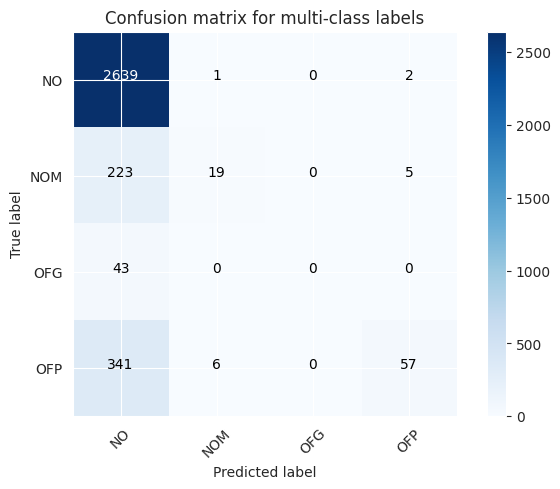

Test Accuracy: 0.8138
Test macro-F1: 0.3198


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.89      0.13      0.22       447
     no_hate       0.88      1.00      0.94      2889

    accuracy                           0.88      3336
   macro avg       0.89      0.56      0.58      3336
weighted avg       0.88      0.88      0.84      3336



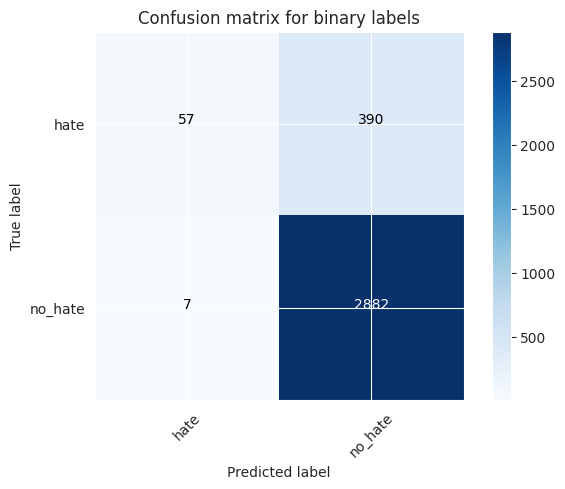

Test Accuracy: 0.881
Test macro-F1: 0.5793




TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation

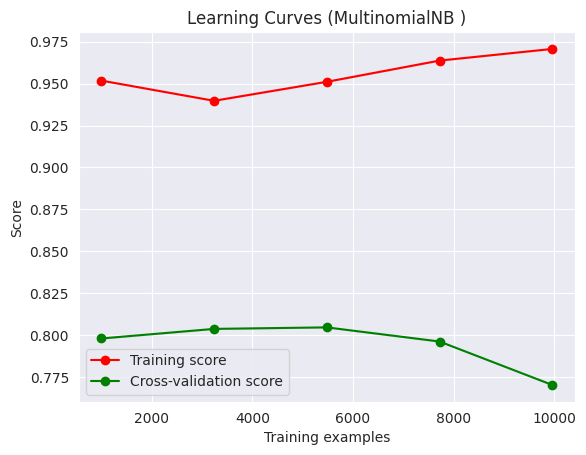


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.81      1.00      0.89      2642
         NOM       0.71      0.07      0.13       247
         OFG       0.00      0.00      0.00        43
         OFP       0.88      0.11      0.20       404

    accuracy                           0.81      3336
   macro avg       0.60      0.29      0.30      3336
weighted avg       0.80      0.81      0.74      3336



/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.

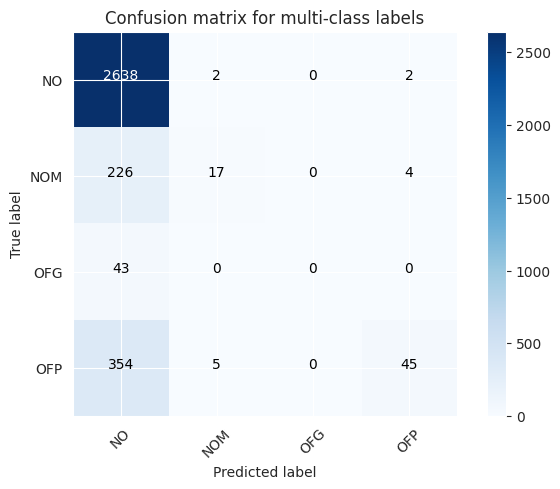

Test Accuracy: 0.8094
Test macro-F1: 0.3043


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.88      0.10      0.18       447
     no_hate       0.88      1.00      0.93      2889

    accuracy                           0.88      3336
   macro avg       0.88      0.55      0.56      3336
weighted avg       0.88      0.88      0.83      3336



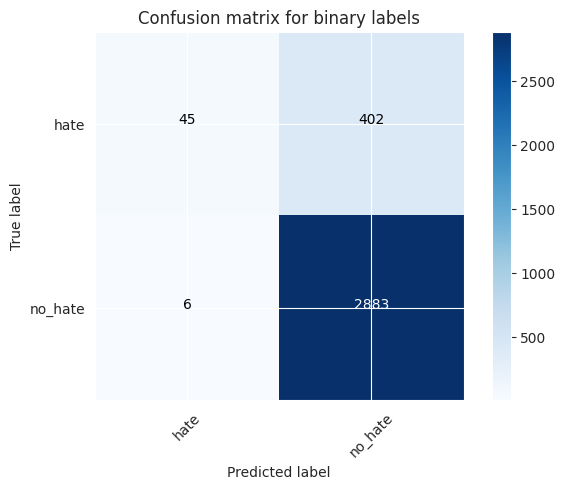

Test Accuracy: 0.8777
Test macro-F1: 0.5573




TRAINING condition: 'tf-idf-1' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label e

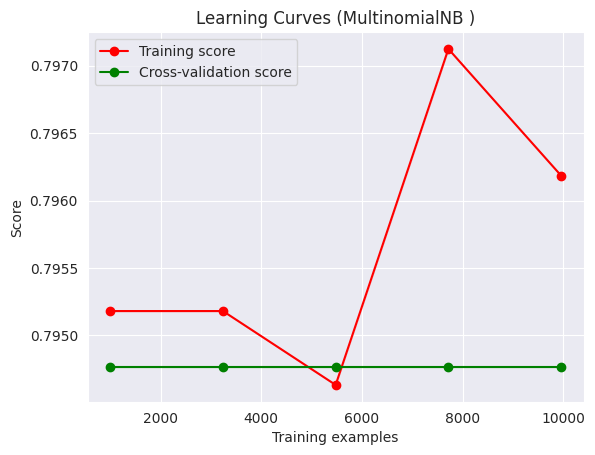


 TEST SET REPORT (MULTI-CLASS) =================================


/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.

              precision    recall  f1-score   support

          NO       0.79      1.00      0.88      2642
         NOM       0.00      0.00      0.00       247
         OFG       0.00      0.00      0.00        43
         OFP       1.00      0.01      0.02       404

    accuracy                           0.79      3336
   macro avg       0.45      0.25      0.23      3336
weighted avg       0.75      0.79      0.70      3336



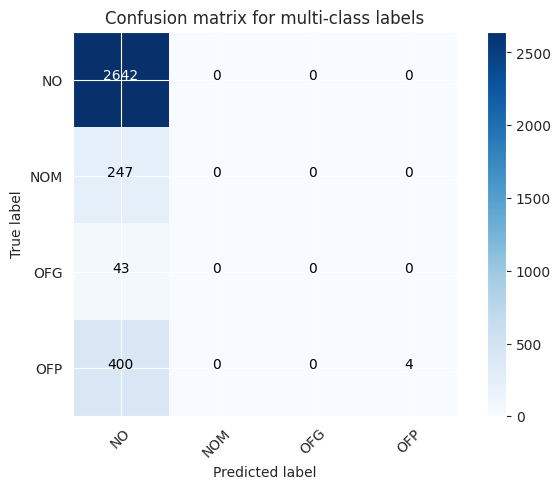

Test Accuracy: 0.7932
Test macro-F1: 0.226


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       1.00      0.01      0.02       447
     no_hate       0.87      1.00      0.93      2889

    accuracy                           0.87      3336
   macro avg       0.93      0.50      0.47      3336
weighted avg       0.88      0.87      0.81      3336



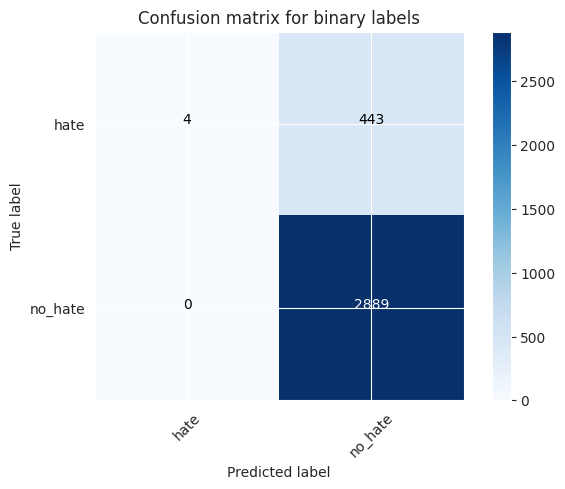

Test Accuracy: 0.8672
Test macro-F1: 0.4733




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label e

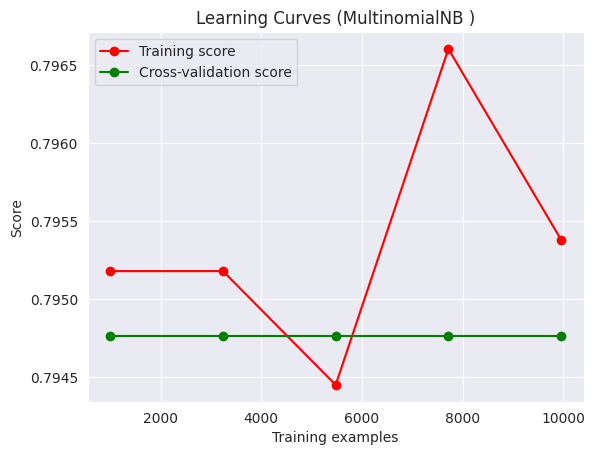


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.79      1.00      0.88      2642
         NOM       0.00      0.00      0.00       247
         OFG       0.00      0.00      0.00        43
         OFP       1.00      0.00      0.00       404

    accuracy                           0.79      3336
   macro avg       0.45      0.25      0.22      3336
weighted avg       0.75      0.79      0.70      3336



/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.

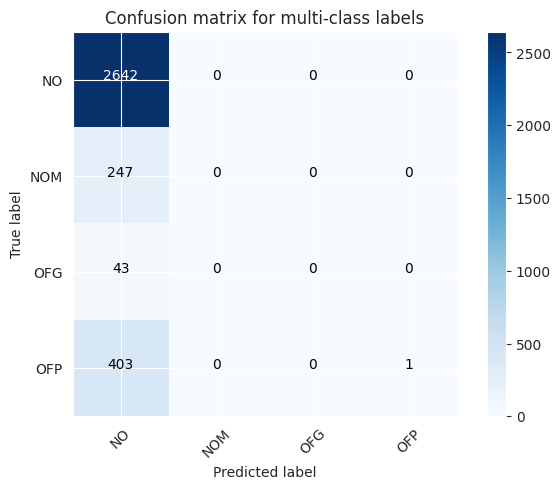

Test Accuracy: 0.7923
Test macro-F1: 0.2222


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       1.00      0.00      0.00       447
     no_hate       0.87      1.00      0.93      2889

    accuracy                           0.87      3336
   macro avg       0.93      0.50      0.47      3336
weighted avg       0.88      0.87      0.80      3336



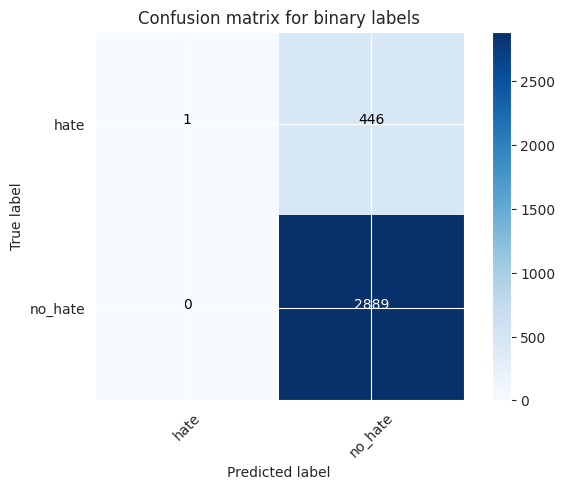

Test Accuracy: 0.8663
Test macro-F1: 0.4664






In [93]:
for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")
    for dataset_folder in [dataset_v1_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_v1_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        model: MLClassifier = MLClassifier(estimator=MultinomialNB(),
                                           vectorizer=vectorizer,
                                           optimization_grid=None,
                                           feat_selector=None)

        x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                          x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

        model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
        # TESTING =================>
        model.predict_with_report(x_test=x_test, y_true=y_test)

La performance en estos casos es mucho peor a la obtenida antes. Para el primero de los casos, donde usamos TFs y bigrams, vemos que el modelo tiende a overfittear. Es decir, logra una performance muy buena en training a nivel de accuracy (porque aprende que tiene que predecir todo como NO) y luego no generaliza bien.

Suena a que la solución más razonable antes de continuar, es volver al notebook 1 y trabajar más con los datos.

### Dataset v2 - Random Over Sampling

In [10]:
train_conditions: list[dict] = [
    {
        "name": "tf-1",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 1))
    },
    {
        "name": "tf-2",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 2))
    },
    {
        "name": "tf-3",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 3))
    },
    {
        "name": "tf-idf-1",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 1))
    },
    {
        "name": "tf-idf-2",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 2))
    },
    {
        "name": "tf-idf-3",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

TRAINING condition: 'tf-1' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 1), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation set
Fitting 1 folds for each of 1 candidates,

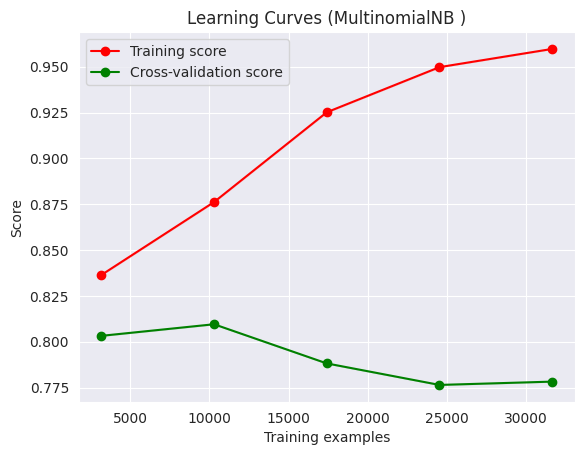


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.93      0.90      0.91      2642
         NOM       0.53      0.59      0.56       247
         OFG       0.11      0.14      0.12        43
         OFP       0.57      0.62      0.59       404

    accuracy                           0.83      3336
   macro avg       0.53      0.56      0.55      3336
weighted avg       0.84      0.83      0.84      3336



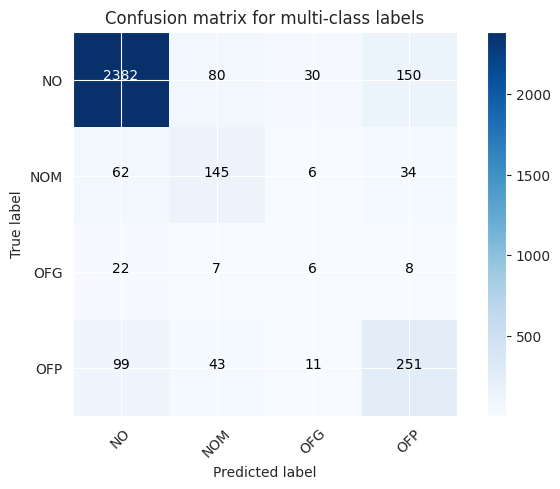

Test Accuracy: 0.8345
Test macro-F1: 0.547


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.56      0.62      0.59       447
     no_hate       0.94      0.92      0.93      2889

    accuracy                           0.88      3336
   macro avg       0.75      0.77      0.76      3336
weighted avg       0.89      0.88      0.89      3336



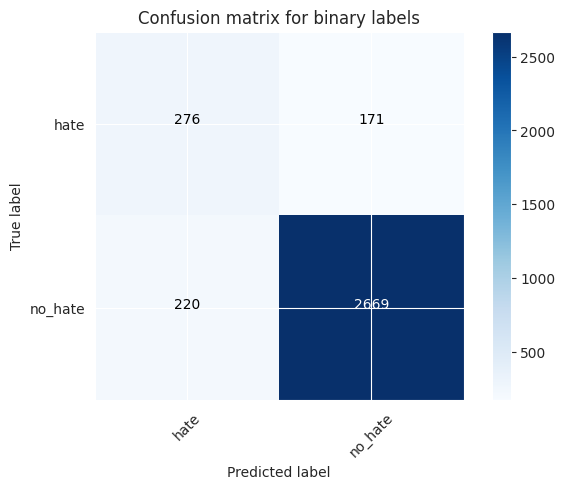

Test Accuracy: 0.8828
Test macro-F1: 0.7586




TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validati

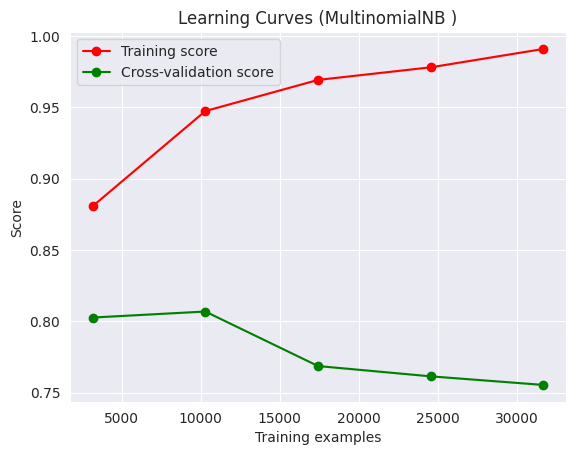


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.91      0.94      0.93      2642
         NOM       0.58      0.53      0.55       247
         OFG       0.15      0.19      0.17        43
         OFP       0.66      0.53      0.58       404

    accuracy                           0.85      3336
   macro avg       0.57      0.55      0.56      3336
weighted avg       0.85      0.85      0.85      3336



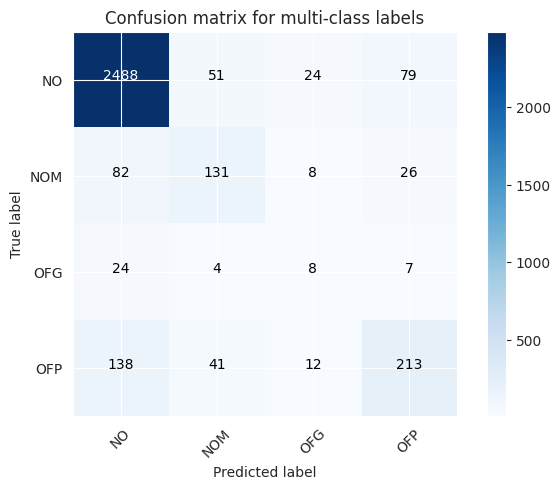

Test Accuracy: 0.8513
Test macro-F1: 0.5579


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.64      0.54      0.58       447
     no_hate       0.93      0.95      0.94      2889

    accuracy                           0.90      3336
   macro avg       0.78      0.74      0.76      3336
weighted avg       0.89      0.90      0.89      3336



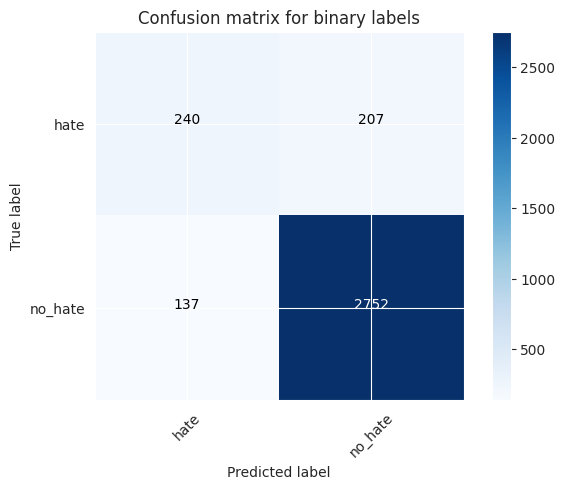

Test Accuracy: 0.8969
Test macro-F1: 0.7619




TRAINING condition: 'tf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validati

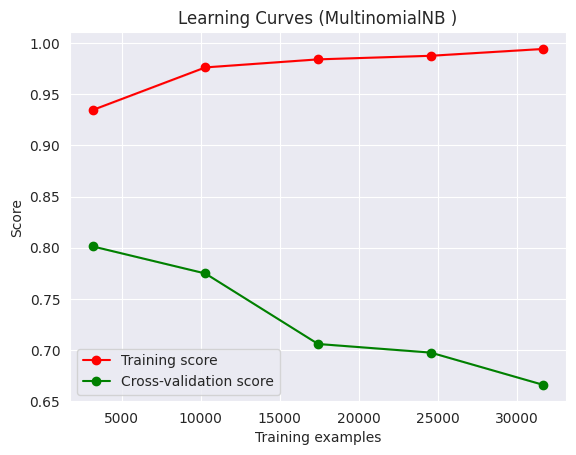


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.91      0.95      0.93      2642
         NOM       0.60      0.51      0.55       247
         OFG       0.13      0.16      0.15        43
         OFP       0.68      0.52      0.59       404

    accuracy                           0.85      3336
   macro avg       0.58      0.54      0.55      3336
weighted avg       0.85      0.85      0.85      3336



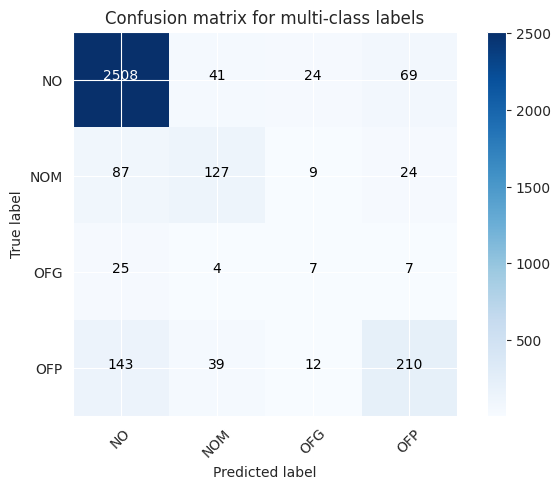

Test Accuracy: 0.8549
Test macro-F1: 0.5546


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.65      0.53      0.58       447
     no_hate       0.93      0.96      0.94      2889

    accuracy                           0.90      3336
   macro avg       0.79      0.74      0.76      3336
weighted avg       0.89      0.90      0.89      3336



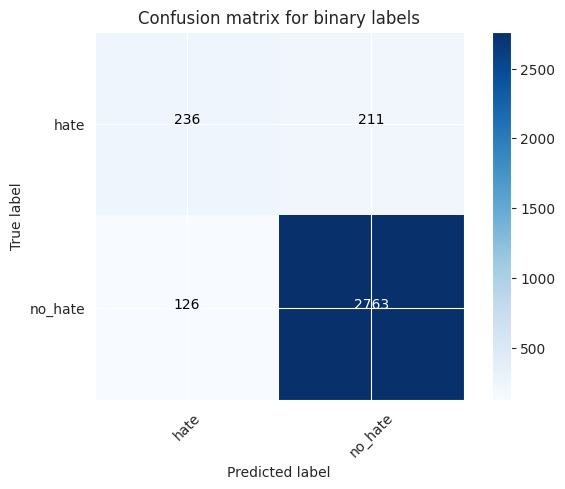

Test Accuracy: 0.899
Test macro-F1: 0.763




TRAINING condition: 'tf-idf-1' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 1), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label en

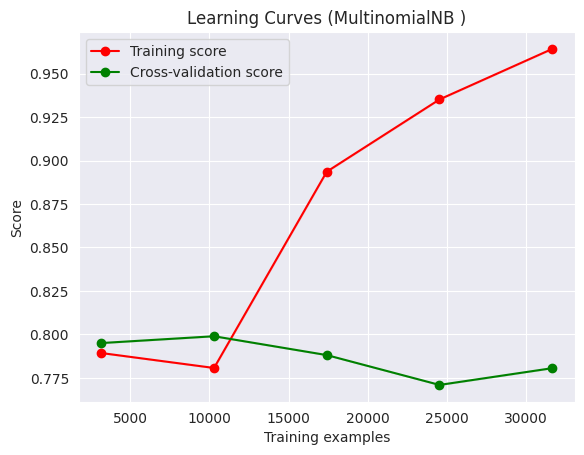


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.91      0.94      0.92      2642
         NOM       0.58      0.49      0.53       247
         OFG       0.14      0.21      0.17        43
         OFP       0.65      0.58      0.61       404

    accuracy                           0.85      3336
   macro avg       0.57      0.55      0.56      3336
weighted avg       0.85      0.85      0.85      3336



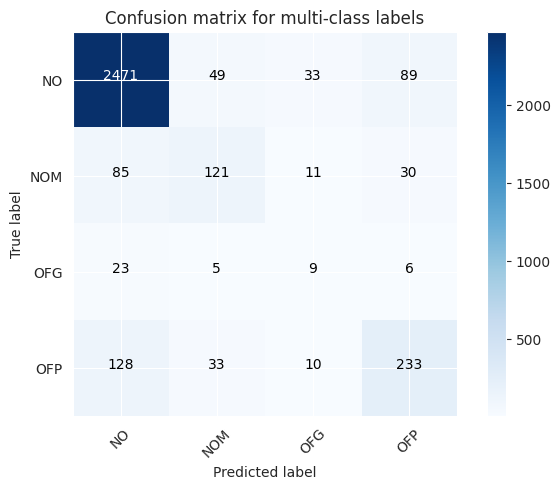

Test Accuracy: 0.8495
Test macro-F1: 0.5593


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.61      0.58      0.59       447
     no_hate       0.94      0.94      0.94      2889

    accuracy                           0.89      3336
   macro avg       0.77      0.76      0.77      3336
weighted avg       0.89      0.89      0.89      3336



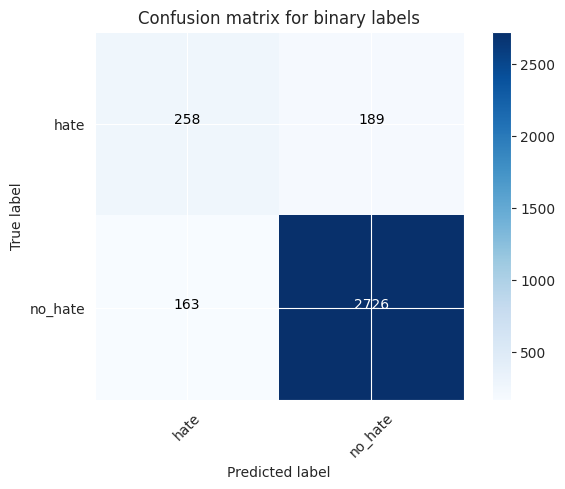

Test Accuracy: 0.8945
Test macro-F1: 0.7669




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label 

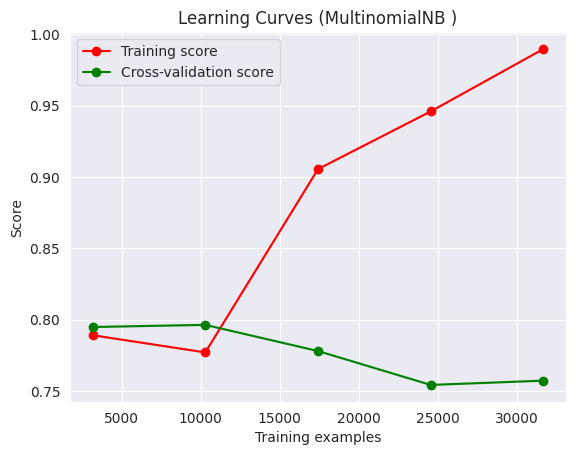


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.91      0.95      0.93      2642
         NOM       0.62      0.51      0.56       247
         OFG       0.13      0.21      0.16        43
         OFP       0.72      0.53      0.61       404

    accuracy                           0.86      3336
   macro avg       0.59      0.55      0.56      3336
weighted avg       0.85      0.86      0.85      3336



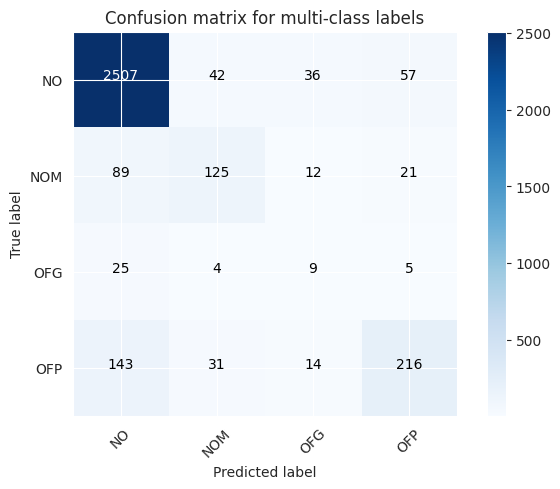

Test Accuracy: 0.8564
Test macro-F1: 0.5642


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.66      0.55      0.60       447
     no_hate       0.93      0.96      0.94      2889

    accuracy                           0.90      3336
   macro avg       0.80      0.75      0.77      3336
weighted avg       0.90      0.90      0.90      3336



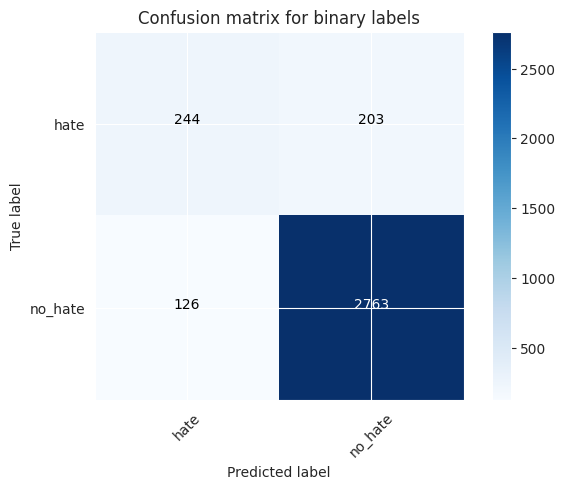

Test Accuracy: 0.9014
Test macro-F1: 0.7706




TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label 

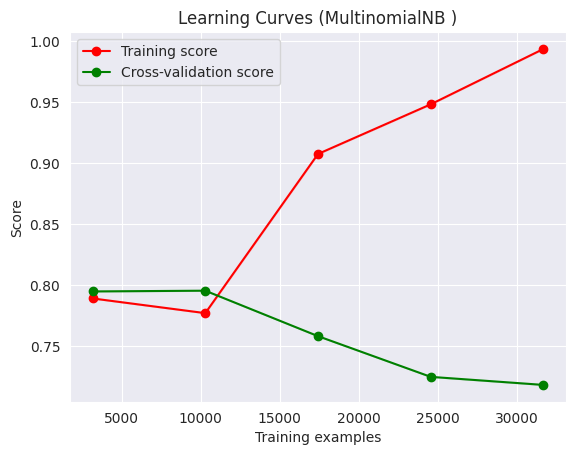


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.91      0.95      0.93      2642
         NOM       0.63      0.51      0.57       247
         OFG       0.14      0.28      0.19        43
         OFP       0.71      0.52      0.60       404

    accuracy                           0.85      3336
   macro avg       0.60      0.57      0.57      3336
weighted avg       0.85      0.85      0.85      3336



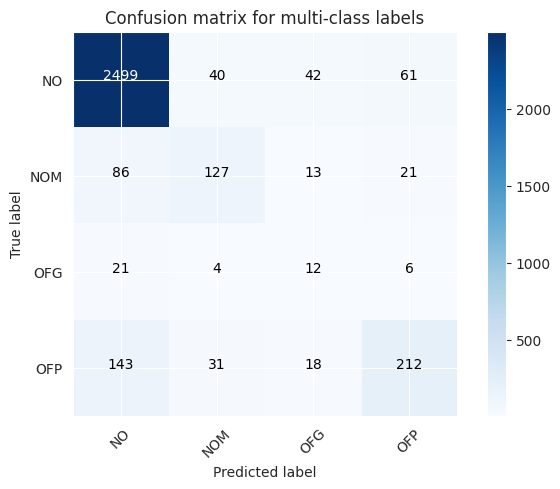

Test Accuracy: 0.8543
Test macro-F1: 0.5706


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.64      0.55      0.60       447
     no_hate       0.93      0.95      0.94      2889

    accuracy                           0.90      3336
   macro avg       0.79      0.75      0.77      3336
weighted avg       0.89      0.90      0.90      3336



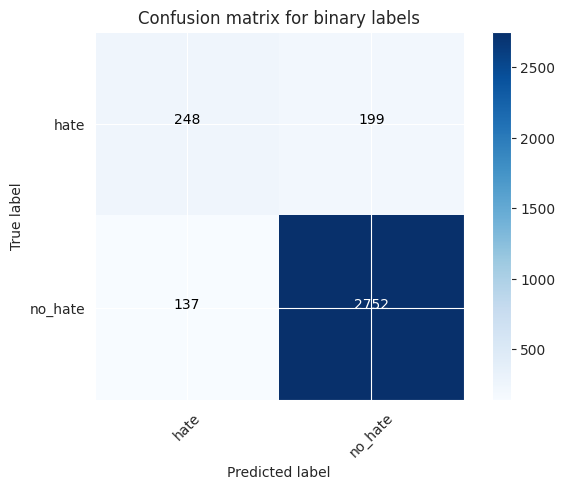

Test Accuracy: 0.8993
Test macro-F1: 0.7693






In [11]:
for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")
    for dataset_folder in [dataset_v2_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        model: MLClassifier = MLClassifier(estimator=MultinomialNB(),
                                           vectorizer=vectorizer,
                                           optimization_grid=None,
                                           feat_selector=None)

        x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                          x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

        model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
        # TESTING =================>
        model.predict_with_report(x_test=x_test, y_true=y_test)

Podemos comprobar rápidamente que los resultados mejoran bastante al balancear el training set.
En este caso, el mejor resultado obtenido es para la condicion tf-idf-3, que usa tf-idf como representación, y utilizando trigrams.

Con esta configuración obtenemos un **57.06% de macro F1 (multi-class)** y **76.93% de macro F1 (binary class)**, bastante mejor que lo obtenido anteriormente. Notar que el único cambio realizado es la aumentación de lo datos de training, el modelo sigue siendo el mismo.

Si miramos con detenimiento la matriz de confusión y el reporte de clasificación para el mejor modelo, podemos ver que:
- `NO`: precision y recall son muy altos para esta clase. Realmente el modelo aprende a identificarla muy bien.
- `NOM`: precision y recall más bajos, pero no tan malos. Precision es un poco más alto, lo que indica que el modelo en general cuando predice algo como `NOM`, suele acertar. El modelo suele confundir `NOM` con `ǸO` y con `OFP`. Creo que en ambos casos es razonable la confusión, porque `NOM` y `OFP` pueden ser confundidos ya que `NOM` tiene vocabulario inadecuado.
- `OFP`: precision relativamente bien y recall un poco más bajo. Se da el caso donde el modelo predice `OFP` para casos que son anotados como `NO` y `NOM`. El primero es un tanto particular y no tan esperable (salvo que esté mal anotado).
- `OFG`: precision y recall bajos, pero precision es realmente muy malo. El modelo tiende a predecir `OFG` para todas las otras clases. Se podría examinar todos esos ejemplos mal predichos para ver si se trata de mejoras posibles en la anotación o si relamente el modelo erra.

Mirando el reporte binario, podemos observar que la performance para la clase `no_hate` es muy buena, mientras que para `hate` es mucho peor. Esto naturalmente se deriva de lo comentado anteriormente.

Un tipo de análisis parecido a este incluimos en `4_dl_approaches.ipynb` cuando comprobamos la performance zero-shot de `ChatGPT` para es test set original y el test set con la misma limpieza que el que miramos aquí pero sin aumentar..

### Dataset v3 - SMOTE

TRAINING condition: 'tf-1' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v3' ========
Total elements for train: 31648
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 1), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation set
Fitting 1 folds for each of 1 candidates,

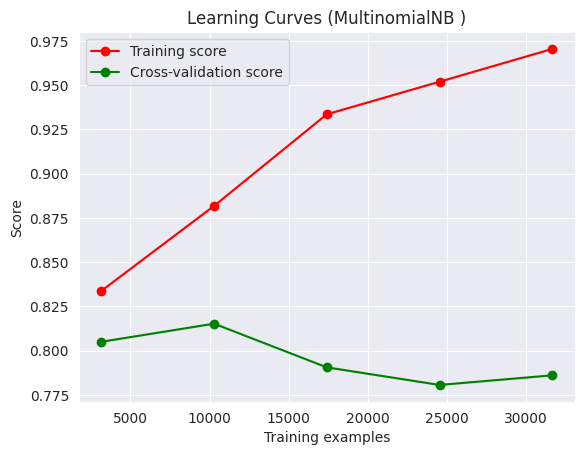


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.93      0.89      0.91      2642
         NOM       0.50      0.57      0.53       247
         OFG       0.11      0.14      0.12        43
         OFP       0.55      0.61      0.58       404

    accuracy                           0.83      3336
   macro avg       0.52      0.55      0.54      3336
weighted avg       0.84      0.83      0.83      3336



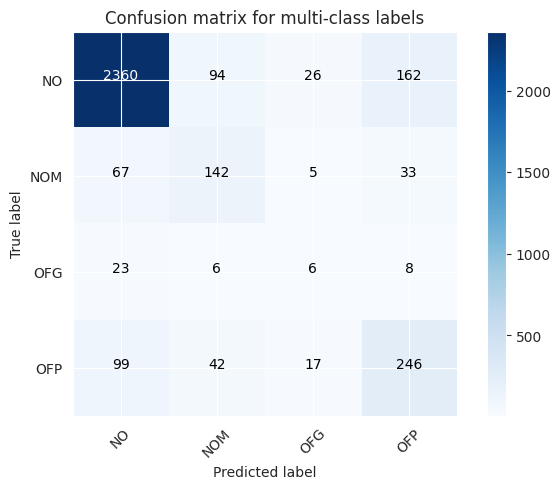

Test Accuracy: 0.8255
Test macro-F1: 0.5362


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.55      0.62      0.58       447
     no_hate       0.94      0.92      0.93      2889

    accuracy                           0.88      3336
   macro avg       0.75      0.77      0.76      3336
weighted avg       0.89      0.88      0.88      3336



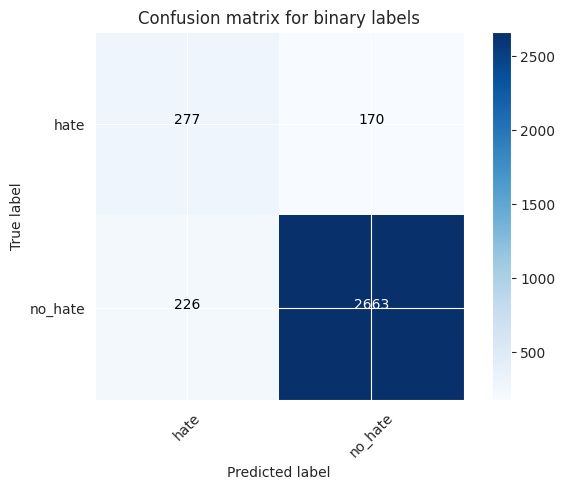

Test Accuracy: 0.8813
Test macro-F1: 0.757




TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v3' ========
Total elements for train: 31648
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validatio

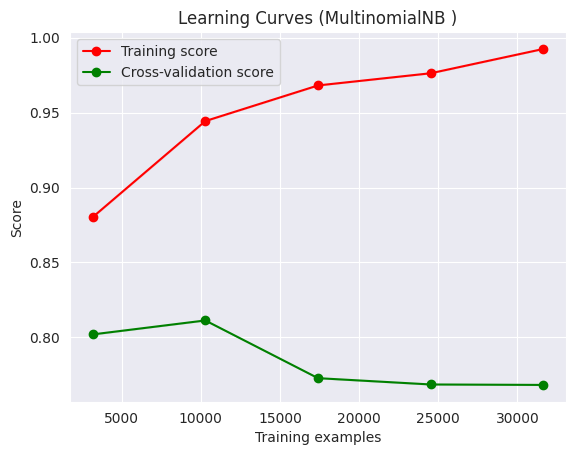


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.91      0.94      0.92      2642
         NOM       0.60      0.52      0.56       247
         OFG       0.13      0.16      0.15        43
         OFP       0.63      0.52      0.57       404

    accuracy                           0.85      3336
   macro avg       0.57      0.54      0.55      3336
weighted avg       0.84      0.85      0.84      3336



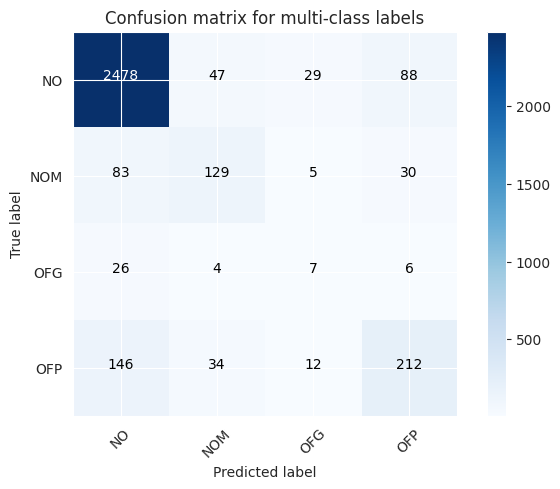

Test Accuracy: 0.8471
Test macro-F1: 0.5501


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.61      0.53      0.57       447
     no_hate       0.93      0.95      0.94      2889

    accuracy                           0.89      3336
   macro avg       0.77      0.74      0.75      3336
weighted avg       0.89      0.89      0.89      3336



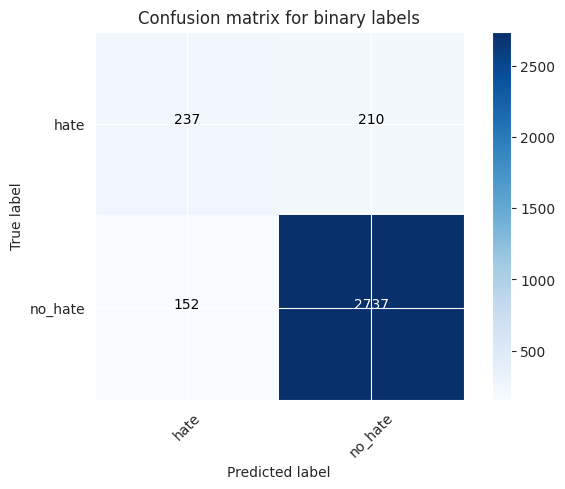

Test Accuracy: 0.8915
Test macro-F1: 0.7525




TRAINING condition: 'tf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v3' ========
Total elements for train: 31648
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validati

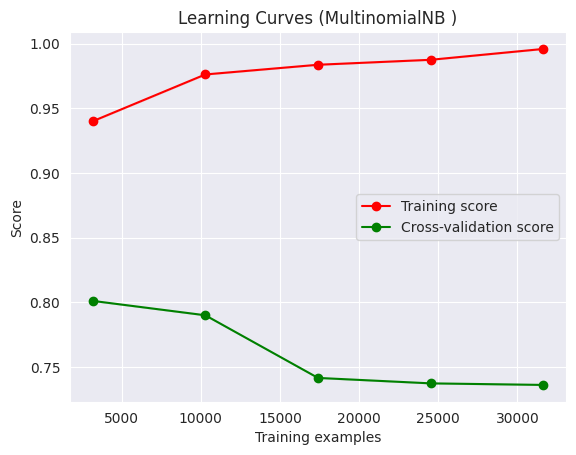


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.90      0.95      0.92      2642
         NOM       0.61      0.48      0.54       247
         OFG       0.12      0.16      0.14        43
         OFP       0.65      0.50      0.57       404

    accuracy                           0.85      3336
   macro avg       0.57      0.52      0.54      3336
weighted avg       0.84      0.85      0.84      3336



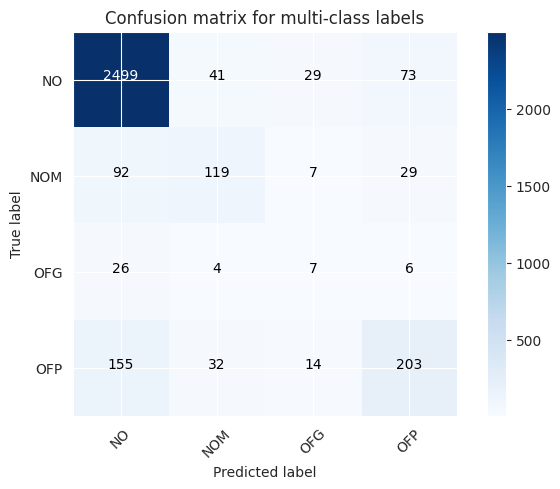

Test Accuracy: 0.8477
Test macro-F1: 0.5421


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.62      0.51      0.56       447
     no_hate       0.93      0.95      0.94      2889

    accuracy                           0.89      3336
   macro avg       0.78      0.73      0.75      3336
weighted avg       0.89      0.89      0.89      3336



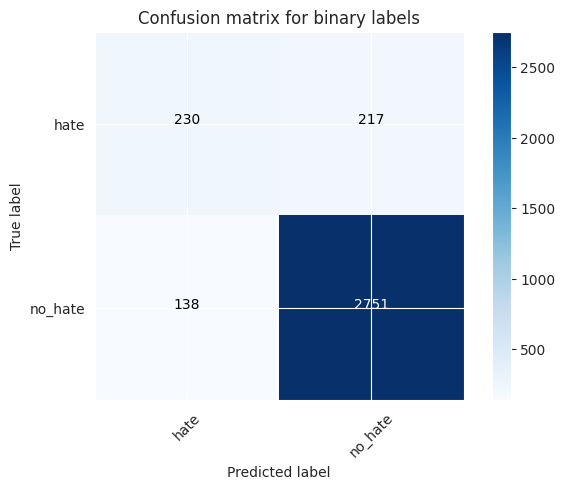

Test Accuracy: 0.8936
Test macro-F1: 0.7519




TRAINING condition: 'tf-idf-1' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v3' ========
Total elements for train: 31648
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 1), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label 

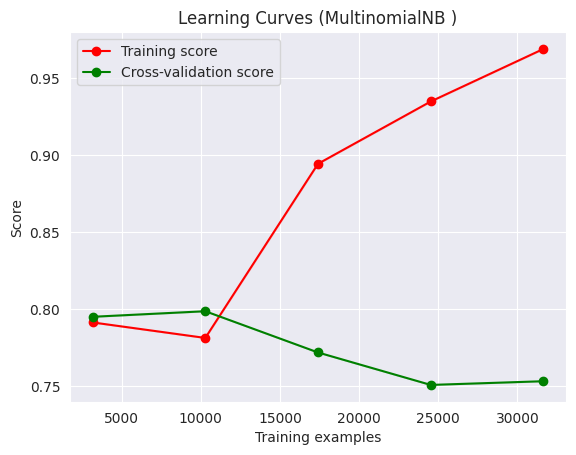


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.91      0.92      0.92      2642
         NOM       0.51      0.48      0.49       247
         OFG       0.14      0.23      0.17        43
         OFP       0.60      0.55      0.58       404

    accuracy                           0.83      3336
   macro avg       0.54      0.55      0.54      3336
weighted avg       0.84      0.83      0.83      3336



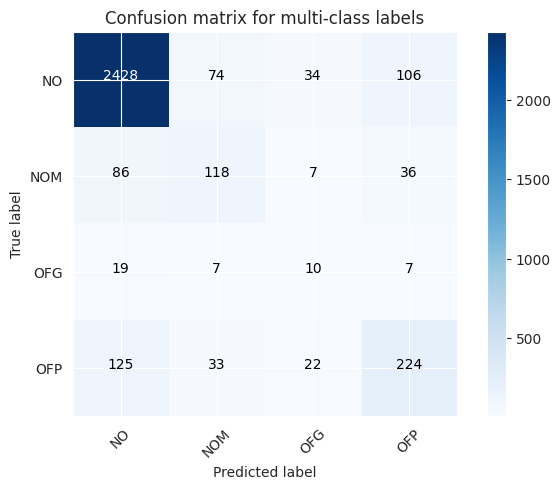

Test Accuracy: 0.8333
Test macro-F1: 0.5395


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.59      0.59      0.59       447
     no_hate       0.94      0.94      0.94      2889

    accuracy                           0.89      3336
   macro avg       0.76      0.76      0.76      3336
weighted avg       0.89      0.89      0.89      3336



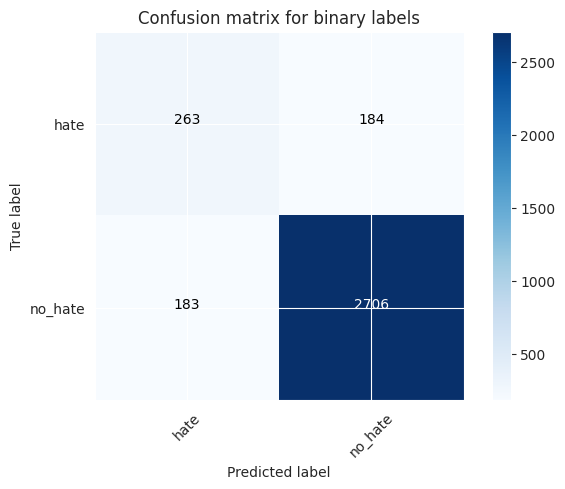

Test Accuracy: 0.89
Test macro-F1: 0.7628




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v3' ========
Total elements for train: 31648
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label en

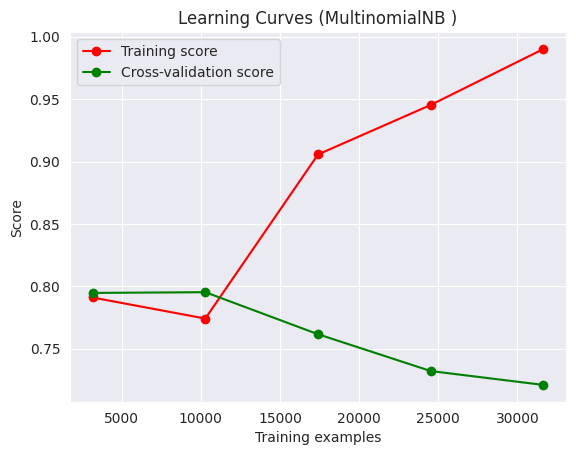


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.90      0.94      0.92      2642
         NOM       0.64      0.46      0.53       247
         OFG       0.13      0.33      0.19        43
         OFP       0.67      0.49      0.56       404

    accuracy                           0.84      3336
   macro avg       0.58      0.55      0.55      3336
weighted avg       0.84      0.84      0.84      3336



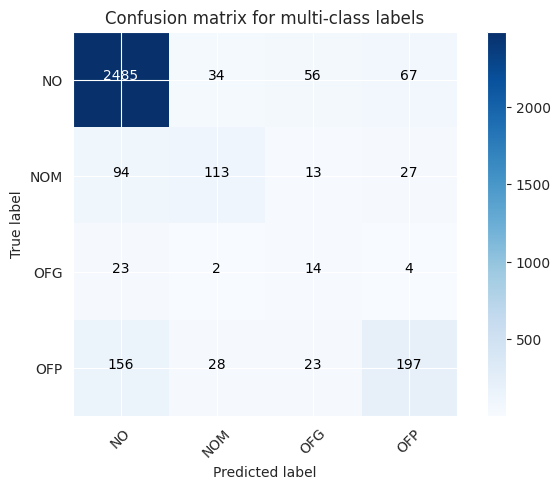

Test Accuracy: 0.842
Test macro-F1: 0.5512


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.59      0.53      0.56       447
     no_hate       0.93      0.94      0.94      2889

    accuracy                           0.89      3336
   macro avg       0.76      0.74      0.75      3336
weighted avg       0.88      0.89      0.89      3336



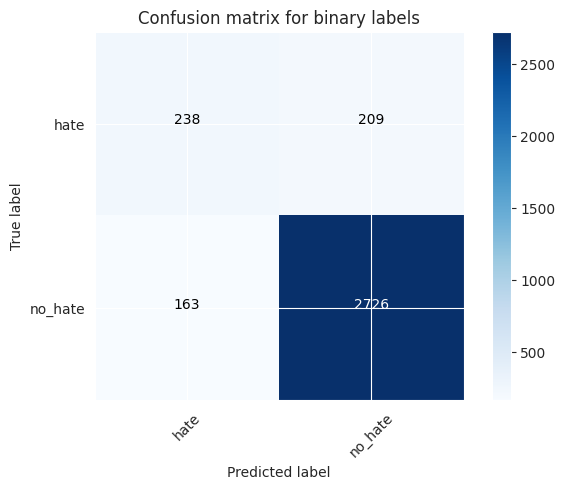

Test Accuracy: 0.8885
Test macro-F1: 0.7487




TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v3' ========
Total elements for train: 31648
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label 

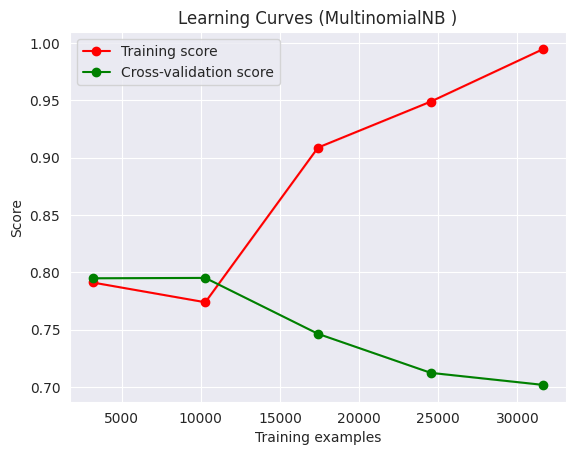


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.90      0.94      0.92      2642
         NOM       0.65      0.46      0.54       247
         OFG       0.12      0.33      0.17        43
         OFP       0.68      0.48      0.56       404

    accuracy                           0.84      3336
   macro avg       0.59      0.55      0.55      3336
weighted avg       0.84      0.84      0.84      3336



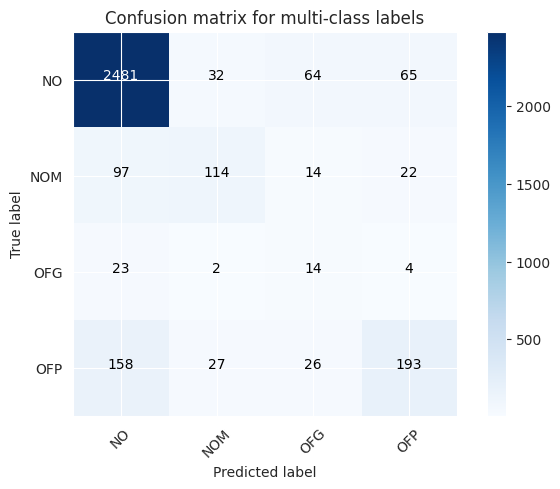

Test Accuracy: 0.8399
Test macro-F1: 0.5485


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.59      0.53      0.56       447
     no_hate       0.93      0.94      0.94      2889

    accuracy                           0.89      3336
   macro avg       0.76      0.74      0.75      3336
weighted avg       0.88      0.89      0.89      3336



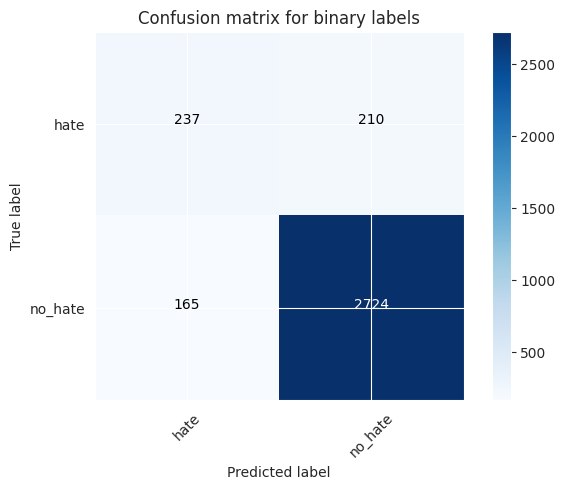

Test Accuracy: 0.8876
Test macro-F1: 0.747






In [15]:
for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")
    for dataset_folder in [dataset_v3_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        model: MLClassifier = MLClassifier(estimator=MultinomialNB(),
                                           vectorizer=vectorizer,
                                           optimization_grid=None,
                                           feat_selector=None)

        x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                          x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

        model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
        # TESTING =================>
        model.predict_with_report(x_test=x_test, y_true=y_test)

Como era de esperarse, aplicando SMOTE no tenemos mejores resultados por las perturbaciones que hacemos al reconstruir los strings de nuevo. Seguimos obteniendo mejores resultados con Random Over-Sampling.

Veamos cómo performan modelos un poco más complejos. Usaremos `v2` del dataset para esto.

## Logistic Regression (MaxEnt)

Vamos a estudiar el comportamiento de los clasificadores probabilísticos de [Máxima Entropía](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html) (MaxEnt), también muy adecuados para clasificación textual.


### Parámetros para explorar
Basándome un poco en lo que pude investigar, los más comunmente explorados son:
- `penalty`: el cuál también lo exploramos en la práctica guiada. Es un parámetro asociado a la regularización, que penalizará los weights para que el modelo tienda a overfittear menos.
- `C`: al igual que en SVC, valores más pequeños de C se corresponden con una regularización más grande.
- `solver`: el algoritmo a usar para el problema de optimización. El default es `lbfgs`. Para datasets que son pequeños (como el nuestro), recomiendan también probar con `liblinear`
- `max_iter`: el máximo número de iteraciones que se les da a los solvers para que converjan. De momento, no hemos tenido que lidear mucho con esto (en NaiveBayes este parámetro no está, y en SVC es -1 por default). Aquí intentaremos tunearlo un poco.

*En los experimentos, fui subiendo max_iter hasta evitar el warning que me decia que para lbfgs no habían sido suficientes iteraciones para que el modelo converja.*

In [9]:
# We can see the parameters and their defaults fairly easily with the following command
LogisticRegression().get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'deprecated',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation set
Fitting 1 folds for each of 22 candidates

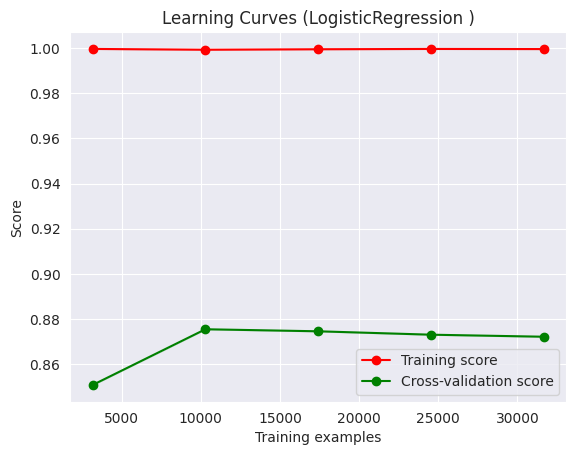


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.92      0.96      0.94      2642
         NOM       0.67      0.68      0.68       247
         OFG       0.36      0.09      0.15        43
         OFP       0.68      0.56      0.62       404

    accuracy                           0.88      3336
   macro avg       0.66      0.57      0.59      3336
weighted avg       0.87      0.88      0.87      3336



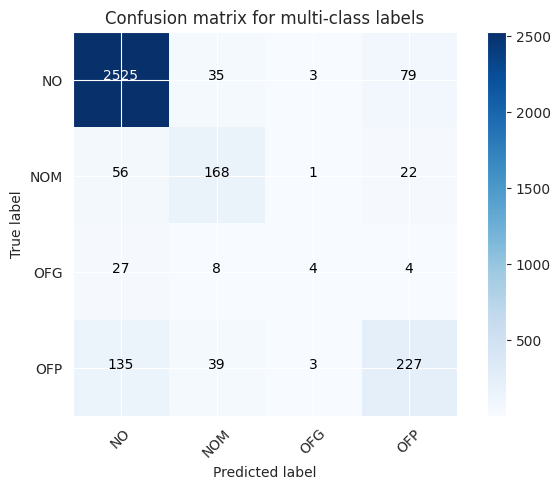

Test Accuracy: 0.8765
Test macro-F1: 0.5947


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.69      0.53      0.60       447
     no_hate       0.93      0.96      0.95      2889

    accuracy                           0.91      3336
   macro avg       0.81      0.75      0.77      3336
weighted avg       0.90      0.91      0.90      3336



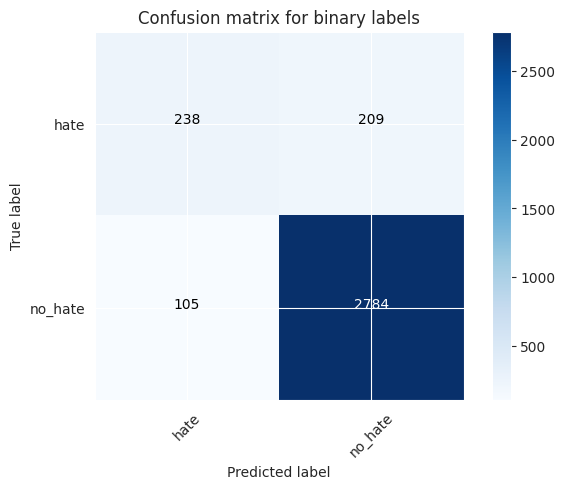

Test Accuracy: 0.9059
Test macro-F1: 0.7746




TRAINING condition: 'tf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validati

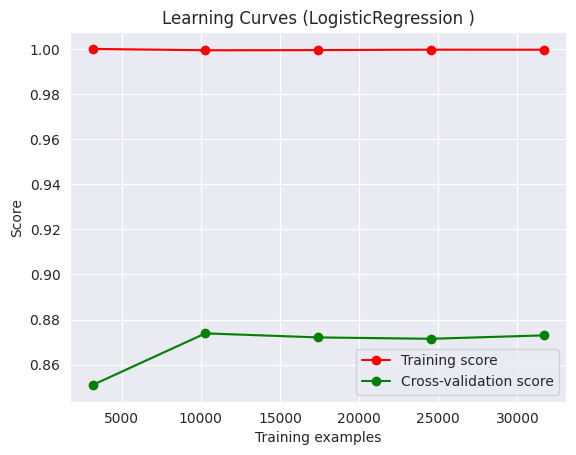


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.92      0.96      0.94      2642
         NOM       0.68      0.65      0.66       247
         OFG       0.38      0.14      0.20        43
         OFP       0.68      0.56      0.62       404

    accuracy                           0.87      3336
   macro avg       0.66      0.58      0.60      3336
weighted avg       0.86      0.87      0.87      3336



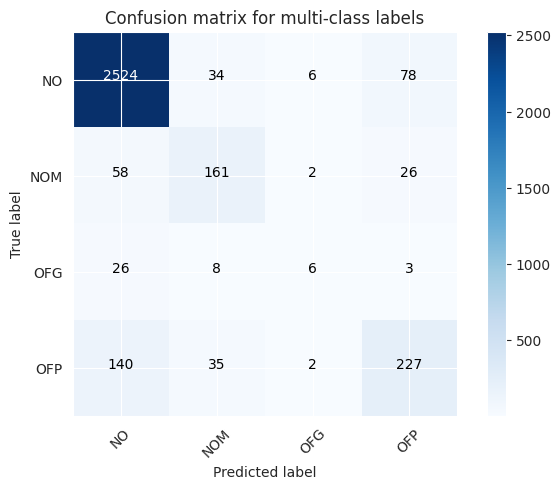

Test Accuracy: 0.8747
Test macro-F1: 0.6048


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.68      0.53      0.60       447
     no_hate       0.93      0.96      0.95      2889

    accuracy                           0.90      3336
   macro avg       0.81      0.75      0.77      3336
weighted avg       0.90      0.90      0.90      3336



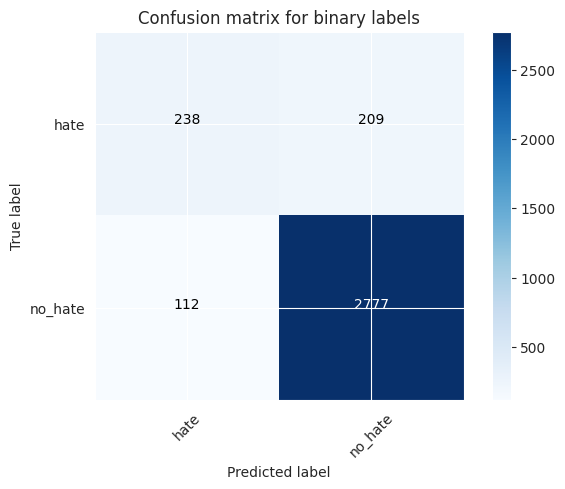

Test Accuracy: 0.9038
Test macro-F1: 0.7713




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label 

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Best estimator is: LogisticRegression(C=100, max_iter=500, penalty='l1', solver='liblinear')
Model trained correctly
Plotting val-scores for each grid configuration
{'mean_fit_time': array([  9.49895406,   0.89760852,   4.37992859,   9.38077521,
        14.79551244,  20.47013831,  16.25354004,  15.64177108,
         1.48198819,   0.89619303,   2.46533895,   2.32676244,
         3.86488891,   2.08711672, 137.75255442,   5.28161907,
        10.01908374,   3.90214086,   9.40833616,   7.64908075,
         7.47293496,   7.16274285]), 'std_fit_time': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]), 'mean_score_time': array([0.01262188, 0.01757312, 0.01849079, 0.0114758 , 0.00551271,
       0.0034523 , 0.00407171, 0.00824475, 0.00695825, 0.00669599,
       0.00814581, 0.00767851, 0.00878   , 0.00630784, 0.00142217,
       0.00802445, 0.00464988, 0.00596738, 0.00585747, 0.00742745,
       0.00593352, 0.00512052]), 'std_score_time': array([

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/1] END C=0.001, max_iter=500, penalty=l1, solver=liblinear;, score=0.758 total time=   3.9s
[CV 1/1] END C=0.1, max_iter=500, penalty=l1, solver=liblinear;, score=0.820 total time=   6.3s
[CV 1/1] END C=10, max_iter=500, penalty=l2, solver=liblinear;, score=0.872 total time=  16.7s
[CV 1/1] END C=100, max_iter=500, penalty=l2, solver=lbfgs;, score=0.869 total time=  25.7s
[CV 1/1] END C=0.1, max_iter=500, penalty=l2, solver=lbfgs;, score=0.862 total time=   9.4s
[CV 1/1] END C=1, max_iter=500, penalty=l2, solver=lbfgs;, score=0.869 total time=  24.8s
[CV 1/1] END C=1, max_iter=500, penalty=l2, solver=lbfgs;, score=0.872 total time=  21.6s
[CV 1/1] END max_iter=500, penalty=None, solver=lbfgs;, score=0.861 total time=   9.5s
[CV 1/1] END C=0.001, max_iter=500, penalty=l2, solver=liblinear;, score=0.700 total time=   5.7s
[CV 1/1] END C=0.1, max_iter=500, penalty=l2, solver=liblinear;, score=0.853 total time=  17.0s
[CV 1/1] END C=0.1, max_iter=500, penalty=l2, solver=lbfgs;, score

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


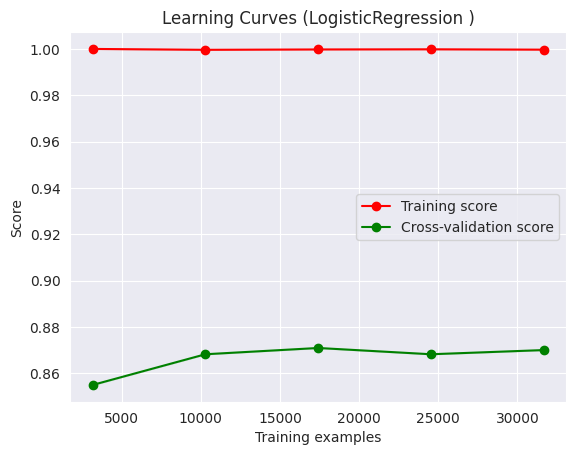


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.93      0.93      0.93      2642
         NOM       0.63      0.63      0.63       247
         OFG       0.14      0.07      0.09        43
         OFP       0.60      0.63      0.61       404

    accuracy                           0.86      3336
   macro avg       0.57      0.57      0.57      3336
weighted avg       0.86      0.86      0.86      3336



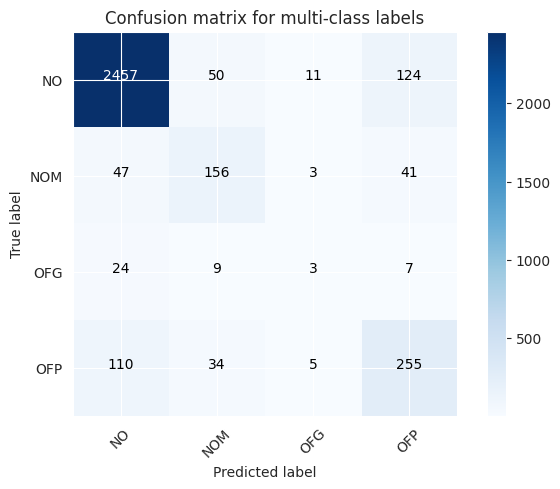

Test Accuracy: 0.8606
Test macro-F1: 0.5664


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.60      0.60      0.60       447
     no_hate       0.94      0.94      0.94      2889

    accuracy                           0.89      3336
   macro avg       0.77      0.77      0.77      3336
weighted avg       0.89      0.89      0.89      3336



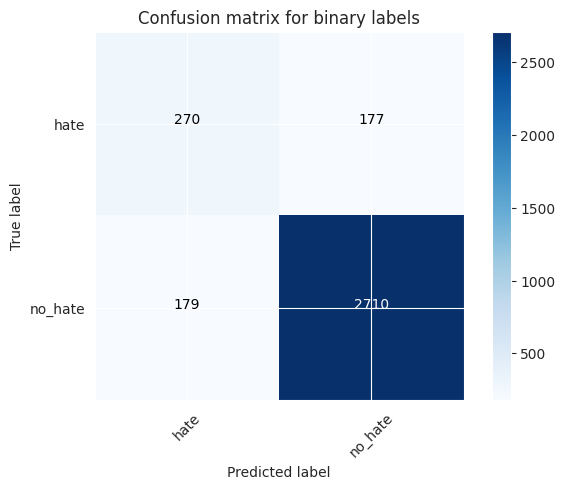

Test Accuracy: 0.8933
Test macro-F1: 0.7705




TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label 

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Best estimator is: LogisticRegression(C=100, max_iter=500, penalty='l1', solver='liblinear')
Model trained correctly
Plotting val-scores for each grid configuration
{'mean_fit_time': array([ 31.11392188,   2.14490795,   5.38249588,  29.07913613,
        39.74156189,  41.34289432,  33.99594069,  24.65793157,
         2.94701552,   1.37338972,   3.82657075,   4.22136736,
         5.77557254,   5.52143002, 160.81532502,   7.91617751,
        68.92857575,   5.72058845,  15.16358018,  10.75566244,
        14.38081789,  11.95521474]), 'std_fit_time': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]), 'mean_score_time': array([0.01412368, 0.03383923, 0.0189755 , 0.02270293, 0.00684738,
       0.00630498, 0.008075  , 0.0268023 , 0.01224089, 0.01093626,
       0.01191688, 0.01095366, 0.00857854, 0.00988388, 0.00183105,
       0.00953889, 0.00219822, 0.0078342 , 0.00757456, 0.0082829 ,
       0.00764155, 0.00584412]), 'std_score_time': array([

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/1] END C=0.001, max_iter=500, penalty=l2, solver=lbfgs;, score=0.849 total time=   2.2s
[CV 1/1] END C=0.1, max_iter=500, penalty=l2, solver=liblinear;, score=0.860 total time=   5.5s
[CV 1/1] END C=100, max_iter=500, penalty=l2, solver=liblinear;, score=0.853 total time=  10.8s
[CV 1/1] END C=0.001, max_iter=500, penalty=l2, solver=liblinear;, score=0.844 total time=   1.4s
[CV 1/1] END C=0.1, max_iter=500, penalty=l1, solver=liblinear;, score=0.791 total time=   5.8s
[CV 1/1] END C=100, max_iter=500, penalty=l1, solver=liblinear;, score=0.869 total time=  15.2s
[CV 1/1] END C=0.01, max_iter=500, penalty=l1, solver=liblinear;, score=0.139 total time=   3.8s
[CV 1/1] END C=1, max_iter=500, penalty=l2, solver=liblinear;, score=0.865 total time=   7.9s
[CV 1/1] END C=1000, max_iter=500, penalty=l2, solver=liblinear;, score=0.852 total time=  12.0s
[CV 1/1] END C=1000, max_iter=500, penalty=l2, solver=lbfgs;, score=0.862 total time=  24.7s
[CV 1/1] END C=0.01, max_iter=500, penalty=

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/1] END C=0.001, max_iter=500, penalty=l1, solver=liblinear;, score=0.795 total time=   3.0s
[CV 1/1] END C=1, max_iter=500, penalty=l1, solver=liblinear;, score=0.851 total time= 2.7min


/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


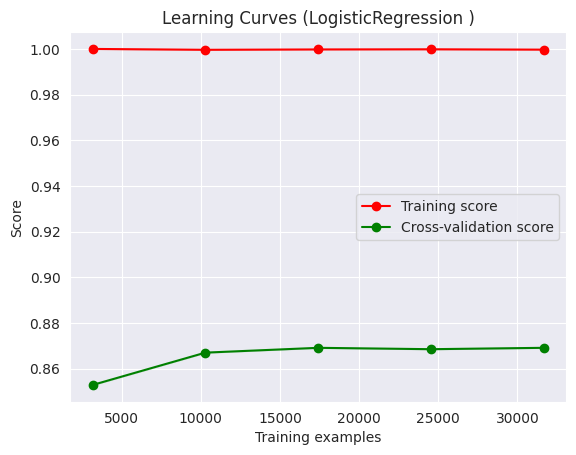


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.94      0.90      0.92      2642
         NOM       0.60      0.64      0.62       247
         OFG       0.17      0.21      0.19        43
         OFP       0.55      0.68      0.61       404

    accuracy                           0.84      3336
   macro avg       0.57      0.61      0.58      3336
weighted avg       0.86      0.84      0.85      3336



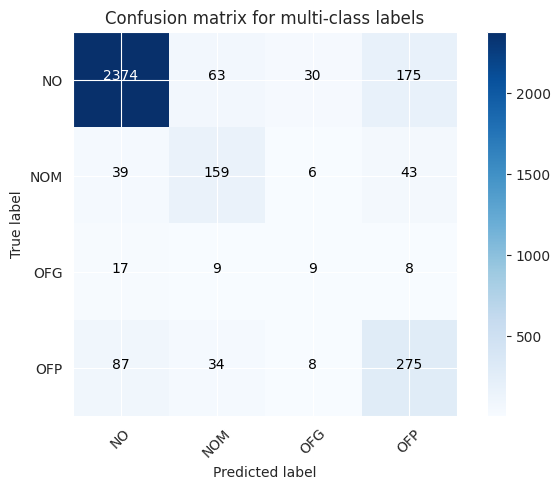

Test Accuracy: 0.8444
Test macro-F1: 0.5842


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.54      0.67      0.60       447
     no_hate       0.95      0.91      0.93      2889

    accuracy                           0.88      3336
   macro avg       0.74      0.79      0.76      3336
weighted avg       0.89      0.88      0.89      3336



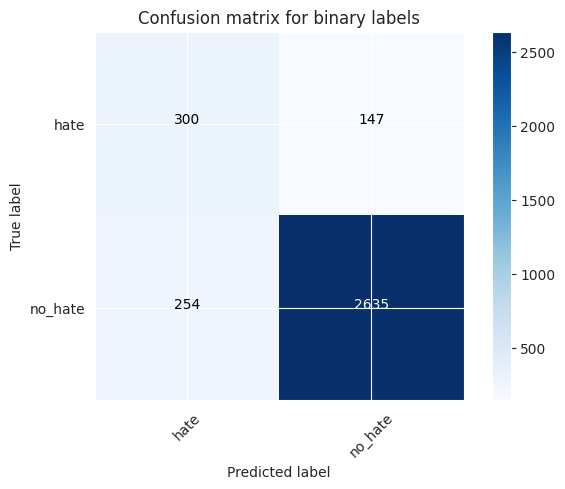

Test Accuracy: 0.8798
Test macro-F1: 0.7643




CPU times: user 29min 44s, sys: 10.2 s, total: 29min 54s
Wall time: 25min 13s


In [10]:
%%time
train_conditions: list[dict] = [
    {
        "name": "tf-2",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 2))
    },
    {
        "name": "tf-3",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 3))
    },
    {
        "name": "tf-idf-2",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 2))
    },
    {
        "name": "tf-idf-3",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

max_ent_grid = [
    {'penalty': [None], "solver": ["lbfgs"], "max_iter": [500]},  # the simplest
    {'penalty': ['l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], "solver": ["lbfgs"], "max_iter": [500]},
    {'penalty': ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], "solver": ["liblinear"], "max_iter": [500]}
]

for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")

    for dataset_folder in [dataset_v2_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        model: MLClassifier = MLClassifier(estimator=LogisticRegression(),
                                           vectorizer=vectorizer,
                                           optimization_grid=max_ent_grid,
                                           feat_selector=None)

        x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                          x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

        model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
        # TESTING =================>
        model.predict_with_report(x_test=x_test, y_true=y_test)

## Support Vector Machines (SVMs)

Las [máquinas de soporte vectorial](https://scikit-learn.org/stable/modules/svm.html) (Support Vector Machines o SVMs) se adaptan bien a problemas de clasificación de texto, y suelen proporcionar modelos más precisos. Utilizando sklearn, vamos a implementar un clasificador SVM para ver si podemos superar los resultados de Naïve Bayes.

De acuerdo a la documentación de scikit learn, hay una gran variedad de parámetros que podríamos explorar y optimizar. En general los más importantes para considerar suelen ser `C` y `gamma`. En las prácticas anteriores también exploramos `kernel`, con el cual en este caso optaré por revisar estos tres.

Como información general encontrada, rescato los siguientes puntos:

- El kernel vendría a ser una especie de función de similaridad:
  - RBF es el kernel de SVM más popularmente usado, y de hecho es el default de sklearn. RBF significa "radial basis function", un tipo de función que es usada para aproximar otras funciones en la literatura. La matemática es compleja, pero básicamente se traslada en un kernel que es capaz de crear las fronteras o delimitaciones más complejas de los disponibles en sklearn. 
  - Computar un kernel de tipo RBF es muy costoso, y se vuelve computacionalmente más complejo a medida que el número de samples excede las pocás decenas de mil.
- `C` y `gamma` son hyperparámetros de regularización, utilizados para evitar overfitting en este tipo de modelos:
  - `gamma` es un multiplicador que se aplica como un parámetro de regularización en el cómputo del kernel. La intuición es que mientras más alto el `gamma`, el fit será más justo (mayor el riesgo de overfitting).
  - `C` es un costo fijo que se agrega cada vez que la similaridad es calculada (básicamente un L1 norm). Mientras más alto el valor de `C` mayor será el fit logrado (al igual que con el `gamma`). 

In [18]:
# We can see the parameters and their defaults fairly easily with the following command
SVC().get_params()

{'C': 1.0,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 'scale',
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': None,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation set
Fitting 1 folds for each of 50 candidates

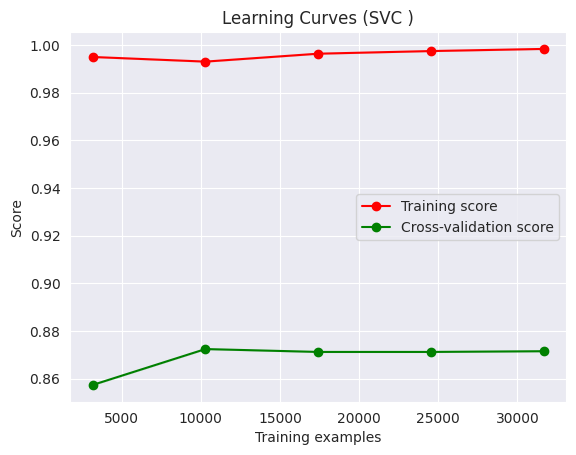


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.92      0.95      0.94      2642
         NOM       0.63      0.68      0.66       247
         OFG       0.29      0.05      0.08        43
         OFP       0.66      0.57      0.61       404

    accuracy                           0.87      3336
   macro avg       0.63      0.56      0.57      3336
weighted avg       0.86      0.87      0.86      3336



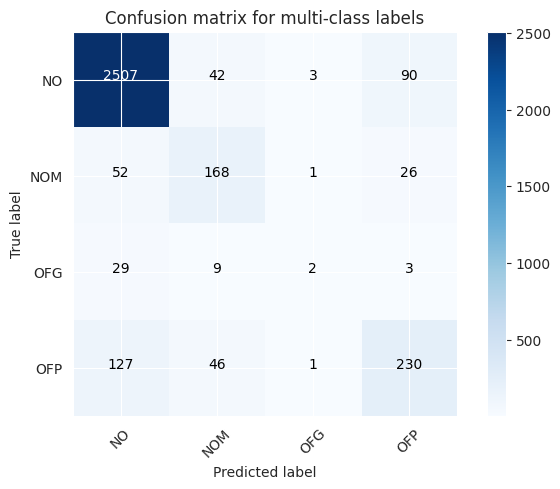

Test Accuracy: 0.8714
Test macro-F1: 0.5708


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.66      0.53      0.59       447
     no_hate       0.93      0.96      0.94      2889

    accuracy                           0.90      3336
   macro avg       0.80      0.74      0.77      3336
weighted avg       0.89      0.90      0.90      3336



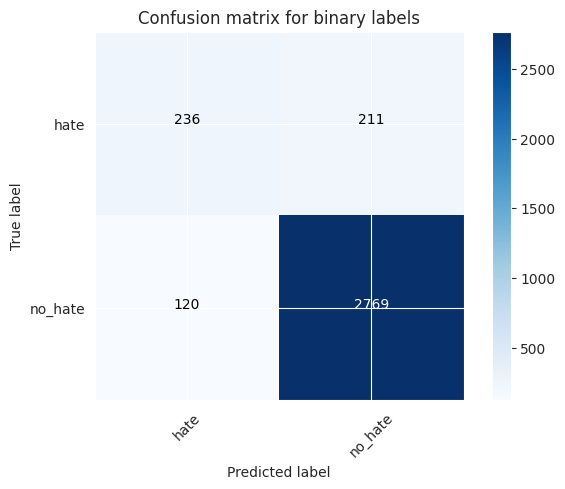

Test Accuracy: 0.9008
Test macro-F1: 0.7657




TRAINING condition: 'tf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validati

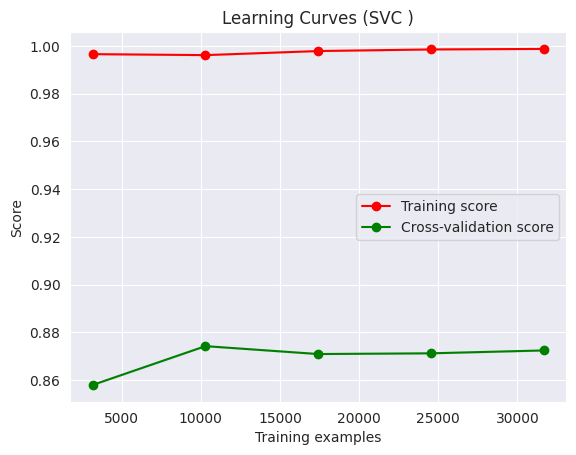


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.93      0.93      0.93      2642
         NOM       0.62      0.69      0.65       247
         OFG       0.33      0.07      0.12        43
         OFP       0.57      0.62      0.59       404

    accuracy                           0.86      3336
   macro avg       0.62      0.57      0.57      3336
weighted avg       0.86      0.86      0.86      3336



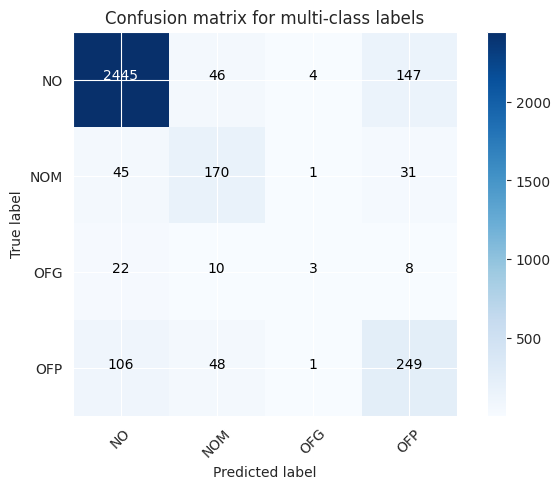

Test Accuracy: 0.8594
Test macro-F1: 0.5728


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.59      0.58      0.59       447
     no_hate       0.94      0.94      0.94      2889

    accuracy                           0.89      3336
   macro avg       0.76      0.76      0.76      3336
weighted avg       0.89      0.89      0.89      3336



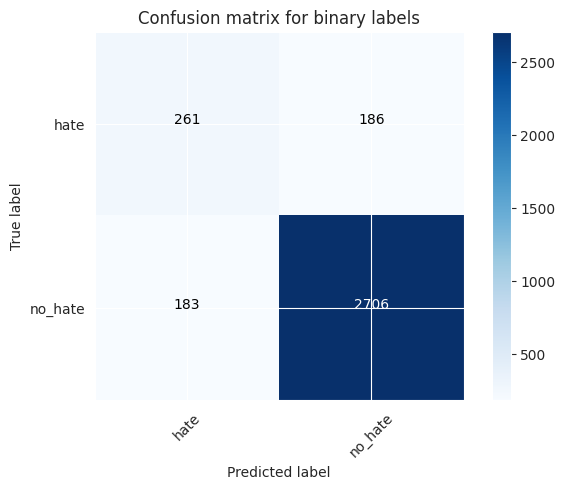

Test Accuracy: 0.8894
Test macro-F1: 0.761




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label e

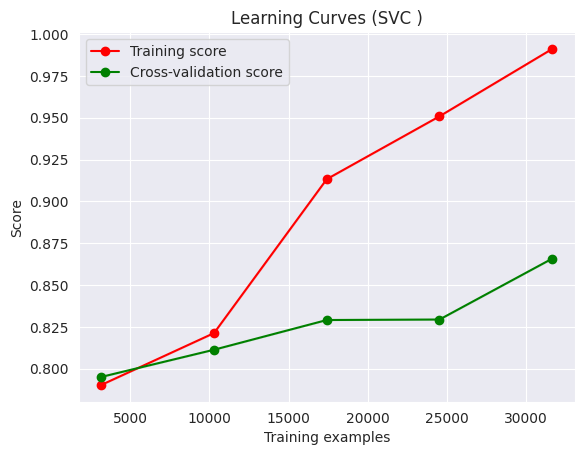


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.91      0.96      0.94      2642
         NOM       0.67      0.67      0.67       247
         OFG       0.20      0.02      0.04        43
         OFP       0.70      0.55      0.61       404

    accuracy                           0.87      3336
   macro avg       0.62      0.55      0.56      3336
weighted avg       0.86      0.87      0.87      3336



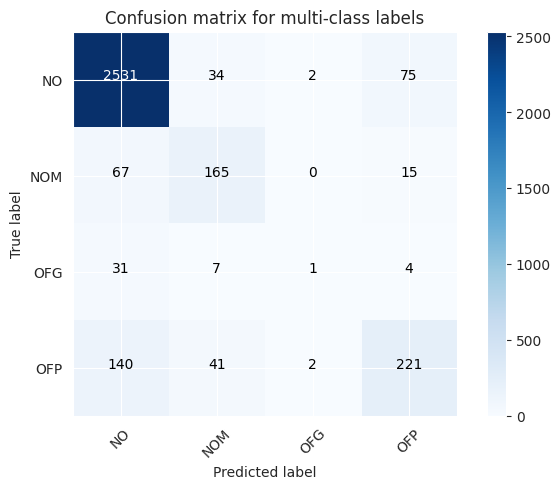

Test Accuracy: 0.8747
Test macro-F1: 0.565


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.71      0.51      0.59       447
     no_hate       0.93      0.97      0.95      2889

    accuracy                           0.91      3336
   macro avg       0.82      0.74      0.77      3336
weighted avg       0.90      0.91      0.90      3336



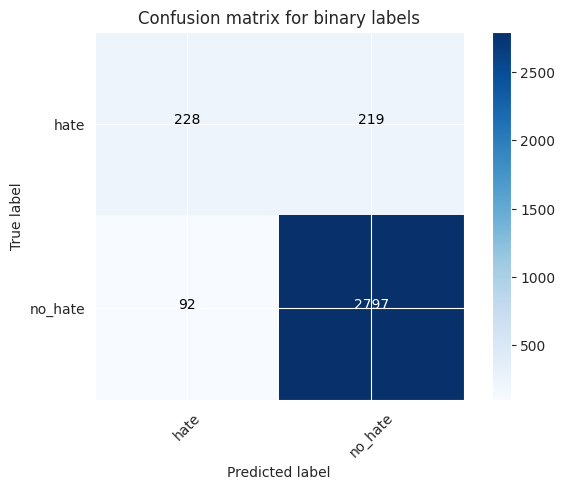

Test Accuracy: 0.9068
Test macro-F1: 0.7709




TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label 

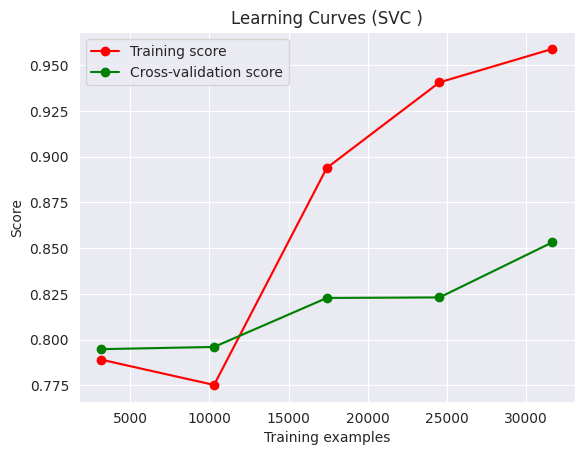


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO       0.90      0.97      0.93      2642
         NOM       0.65      0.68      0.66       247
         OFG       0.25      0.02      0.04        43
         OFP       0.74      0.43      0.54       404

    accuracy                           0.87      3336
   macro avg       0.64      0.52      0.55      3336
weighted avg       0.85      0.87      0.85      3336



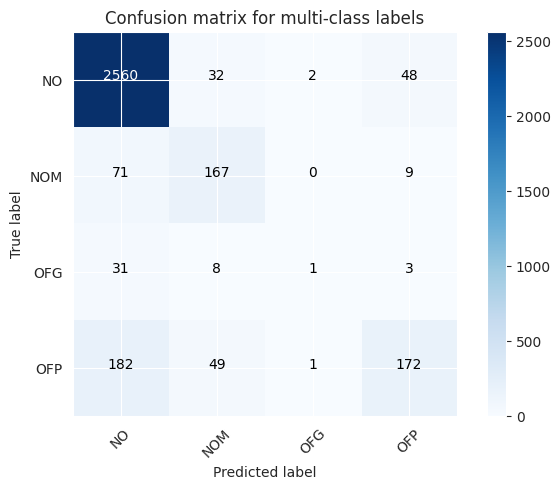

Test Accuracy: 0.8693
Test macro-F1: 0.5452


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate       0.75      0.40      0.52       447
     no_hate       0.91      0.98      0.95      2889

    accuracy                           0.90      3336
   macro avg       0.83      0.69      0.73      3336
weighted avg       0.89      0.90      0.89      3336



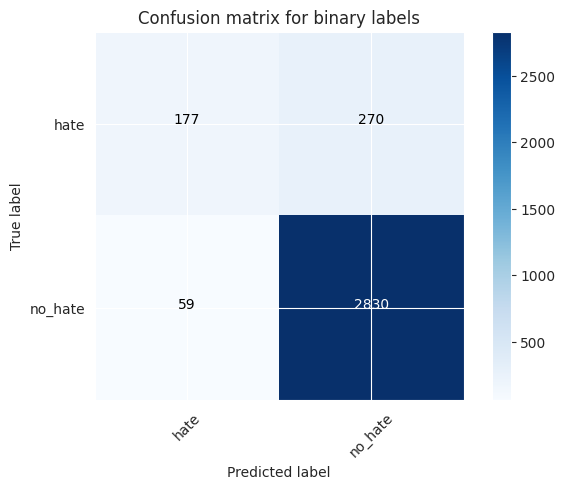

Test Accuracy: 0.9014
Test macro-F1: 0.7317




CPU times: user 32min 39s, sys: 15.4 s, total: 32min 55s
Wall time: 2h 36min 57s


In [19]:
%%time
train_conditions: list[dict] = [
    {
        "name": "tf-2",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 2))
    },
    {
        "name": "tf-3",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 3))
    },
    {
        "name": "tf-idf-2",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 2))
    },
    {
        "name": "tf-idf-3",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

svm_grid = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 'kernel': ['linear', 'rbf']}
for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")

    for dataset_folder in [dataset_v2_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        model: MLClassifier = MLClassifier(estimator=SVC(),
                                           vectorizer=vectorizer,
                                           optimization_grid=svm_grid,
                                           feat_selector=None)

        x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                          x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

        model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
        # TESTING =================>
        model.predict_with_report(x_test=x_test, y_true=y_test)

Tal y como podemos comprobar, seguimos teniendo los mismos problemas que antes. Más allá de haber utilizado SVM con un buen barrido de grid search, detección es muy mala para `OFG` (y `hate` en general). Alcanzamos una performance de **57.28% de macro F1 (multi-class) y 0.761 macro F1 (binary class)**.

Intuitivamente, creo que lo que está pasando es que más allá de que hayamos balanceado los datos de entrenamiento, lo estamos haciendo a través de duplicar los mismos ejemplos una y otra vez. Esto no agrega ninguna riqueza al clasificador. Es posible que hayan ejemplos en el test con una distribución muy distinta a los que tenemos en train. Es decir, con formas alternativas de marcar discurso del odio.

Esta situación podemos mejorarla invirtiendo más tiempo en crear un train set de mejor calidad. Por ejemplo, usando ChatGPT con zero o few-shot learning para aumentar las clases minoritarias y luego podemos combinar esto con Random Over-Sampling para llegar exactamente a los mismos niveles. Probablemente con generar nuevos datos de training para las clases minoritarias (no necesiriamente una cantidad excesiva) logremos mejorar la performance del clasificador. Sin embargo, si miramos las pruebas que hicimos en `4_dl_approaches.ipynb` podemos ver que la performance zero-shot de ChatGPT para esta tarea es inclusive peor que la que obtenemos entrenando estos clasificadores basados en algoritmos de ML. Con lo cual, quizás ChatGPT tampoco pueda generar ejemplos en español de tan buena calidad que nos ayuden.

De momento, optaré por avanzar sin crear otra versión del training set a través de aumentar los datos con ChatGPT. Si logro tener tiempo suficiente, lo haré para una última prueba. Prefiero priorizar por poder probar de entrenar diversos modelos y ver si logro mejorar los resultados a través de eso en vez de con los datos.

## Random Forests

Vamos a estudiar el comportamiento de los clasificadores [Random Forest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html).

*A random forest is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting. The sub-sample size is controlled with the max_samples parameter if bootstrap=True (default), otherwise the whole dataset is used to build each tree.*

### Parámetros explorables

Al igual que en el caso de `SVC` y `MaxEnt`, también hay una lista de potenciales parámetros bastante grande para explorar. Diría que de momento es el que más potenciales parámetros tiene para configurar.

De acuerdo con [este blog](https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74) y con la documentación de sklearn, optaré por explorar los siguientes:

- `n_estimators` = number of trees in the forest.
- `criterion` = The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “log_loss” and “entropy” both for the Shannon information gain
- `max_depth` = the maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.
- `min_samples_split` = the minimum number of samples required to split an internal node.
- `min_samples_leaf` = the minimum number of samples required to be at a leaf node.
- `max_features` = the number of features to consider when looking for the best split.
- `bootstrap` = whether bootstrap samples are used when building trees. If False, the whole dataset is used to build each tree.

*Algo que noté al entrenar este modelo es que es bastante lento para entrenar, al menos en comparación a otros como MaxEnt. Sin embargo, de acuerdo a lo que investigué, la principal limitación de los RandomForest es que si se tiene un gran número de trees, el algoritmo se vuelve demasiado lento y poco efectivo para predicciones en tiempo real. En general dicen que suele ser rápido para entrenar, pero bastante lentos para hacer infererencia. Para contrarestar esto y poder probar más convinaciones, sólo los probaré on top de feature selection y quizás con menos combinaciones de las que hubiese querido para valores de sus parámetros*

In [12]:
# We can see the parameters and their defaults fairly easily with the following command
RandomForestClassifier().get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

Debido a que estos clasificadores llevan más tiempo en entrenar, combinaremos con `ChiSquared` para acotar el tamaño del vocabulario.

TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Feature selector class used: <class 'sklearn.feature_selection._univariate_selection.SelectKBest'> with config: {'k': 10000, 'score_func': <function chi2 at 0x744779de1c60>} ===
Training feature extractor on x_train...
Feature extractor

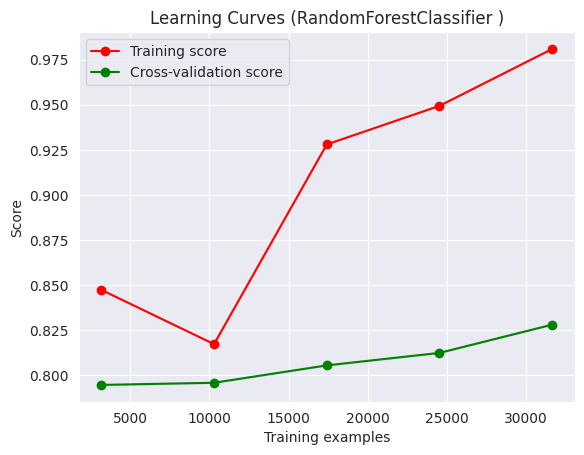


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.8747    0.9830    0.9257      2642
         NOM     0.7593    0.4980    0.6015       247
         OFG     0.0000    0.0000    0.0000        43
         OFP     0.7794    0.3936    0.5230       404

    accuracy                         0.8630      3336
   macro avg     0.6033    0.4686    0.5125      3336
weighted avg     0.8433    0.8630    0.8410      3336



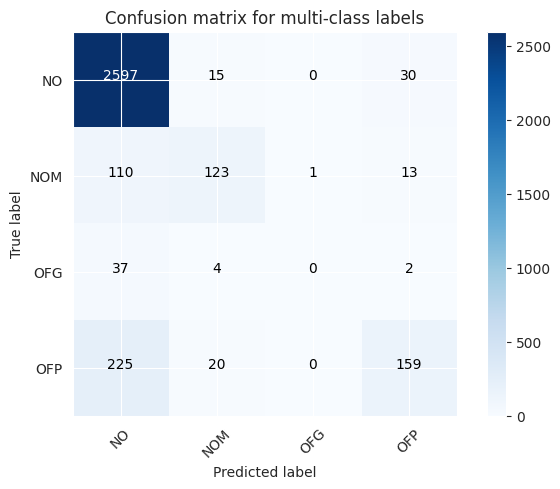

Test Accuracy: 0.863
Test macro-F1: 0.5125


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.7854    0.3602    0.4939       447
     no_hate     0.9087    0.9848    0.9452      2889

    accuracy                         0.9011      3336
   macro avg     0.8470    0.6725    0.7195      3336
weighted avg     0.8921    0.9011    0.8847      3336



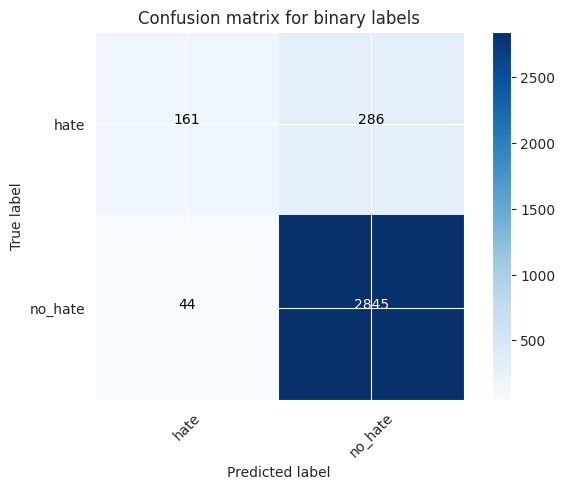

Test Accuracy: 0.9011
Test macro-F1: 0.7195




TRAINING condition: 'tf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Feature selector class used: <class 'sklearn.feature_selection._univariate_selection.SelectKBest'> with config: {'k': 10000, 'score_func': <function chi2 at 0x744779de1c60>} ===
Training f

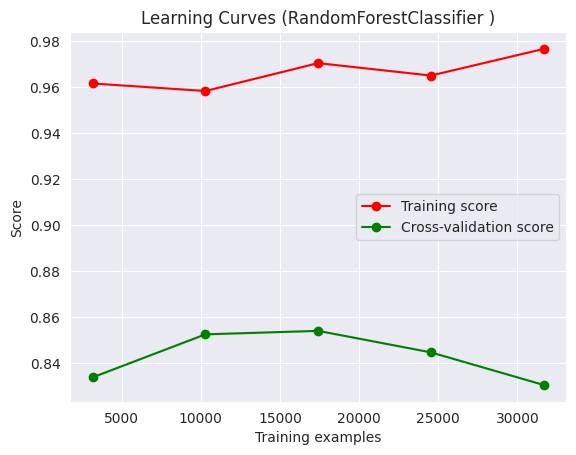


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.8973    0.9587    0.9270      2642
         NOM     0.6463    0.6437    0.6450       247
         OFG     0.3333    0.0233    0.0435        43
         OFP     0.6629    0.4332    0.5240       404

    accuracy                         0.8597      3336
   macro avg     0.6350    0.5147    0.5349      3336
weighted avg     0.8430    0.8597    0.8459      3336



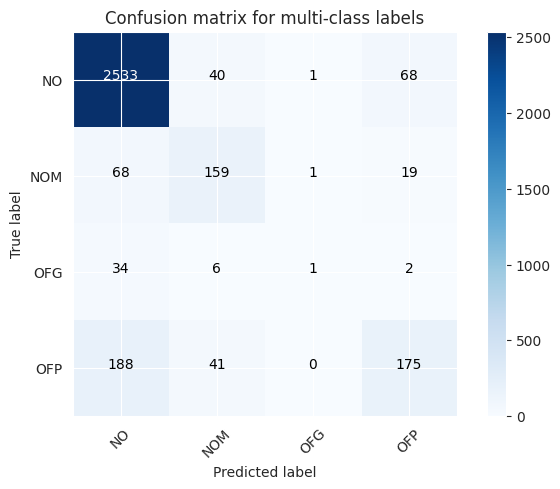

Test Accuracy: 0.8597
Test macro-F1: 0.5349


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6667    0.3982    0.4986       447
     no_hate     0.9123    0.9692    0.9399      2889

    accuracy                         0.8927      3336
   macro avg     0.7895    0.6837    0.7193      3336
weighted avg     0.8794    0.8927    0.8808      3336



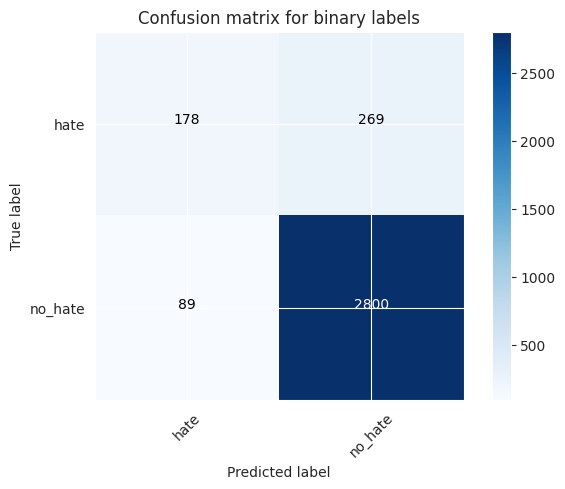

Test Accuracy: 0.8927
Test macro-F1: 0.7193




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Feature selector class used: <class 'sklearn.feature_selection._univariate_selection.SelectKBest'> with conf

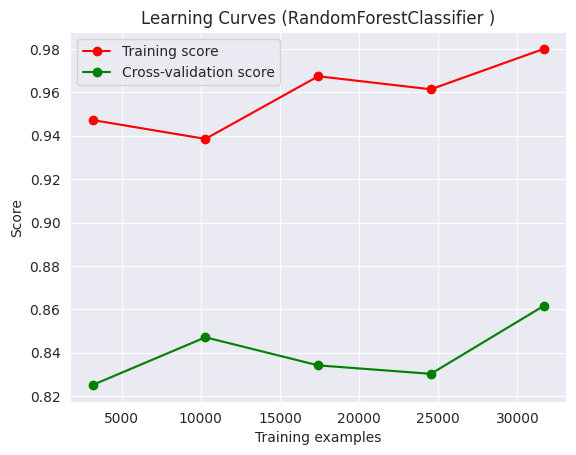


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.8971    0.9637    0.9292      2642
         NOM     0.6330    0.6842    0.6576       247
         OFG     0.0000    0.0000    0.0000        43
         OFP     0.7048    0.3960    0.5071       404

    accuracy                         0.8618      3336
   macro avg     0.5587    0.5110    0.5235      3336
weighted avg     0.8427    0.8618    0.8460      3336



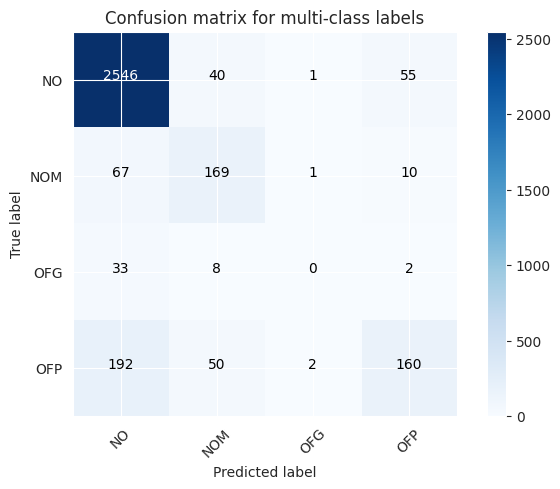

Test Accuracy: 0.8618
Test macro-F1: 0.5235


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.7100    0.3669    0.4838       447
     no_hate     0.9089    0.9768    0.9416      2889

    accuracy                         0.8951      3336
   macro avg     0.8094    0.6718    0.7127      3336
weighted avg     0.8822    0.8951    0.8803      3336



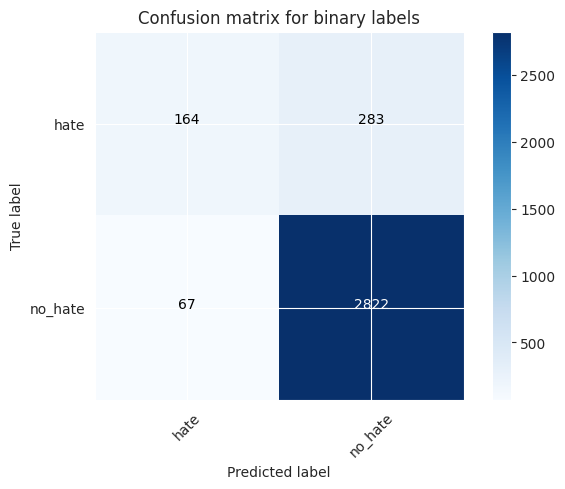

Test Accuracy: 0.8951
Test macro-F1: 0.7127




TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Feature selector class used: <class 'sklearn.feature_selection._univariate_selection.SelectKBest'> with conf

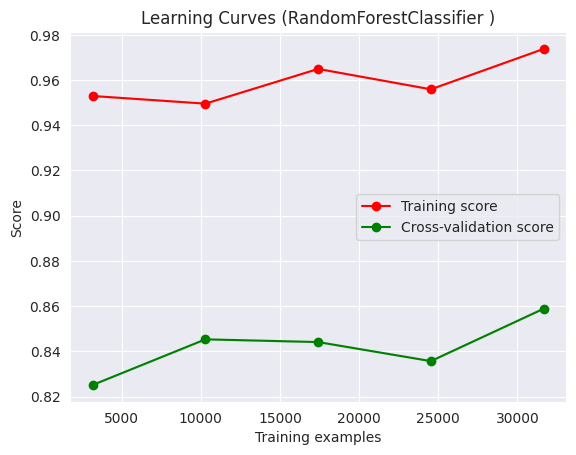


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9042    0.9648    0.9335      2642
         NOM     0.6498    0.6761    0.6627       247
         OFG     0.0000    0.0000    0.0000        43
         OFP     0.7109    0.4505    0.5515       404

    accuracy                         0.8687      3336
   macro avg     0.5662    0.5229    0.5369      3336
weighted avg     0.8503    0.8687    0.8552      3336



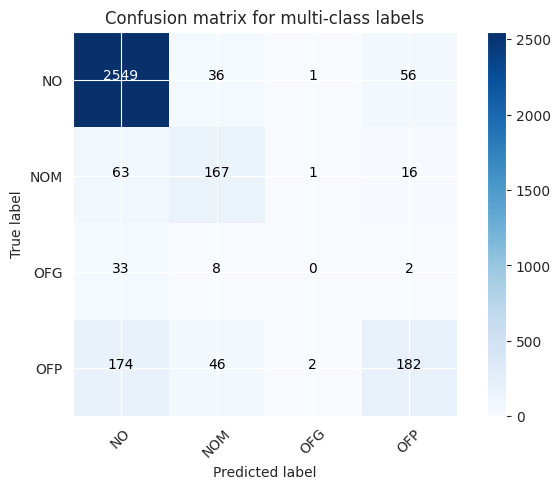

Test Accuracy: 0.8687
Test macro-F1: 0.5369


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.7154    0.4161    0.5262       447
     no_hate     0.9151    0.9744    0.9438      2889

    accuracy                         0.8996      3336
   macro avg     0.8153    0.6952    0.7350      3336
weighted avg     0.8884    0.8996    0.8879      3336



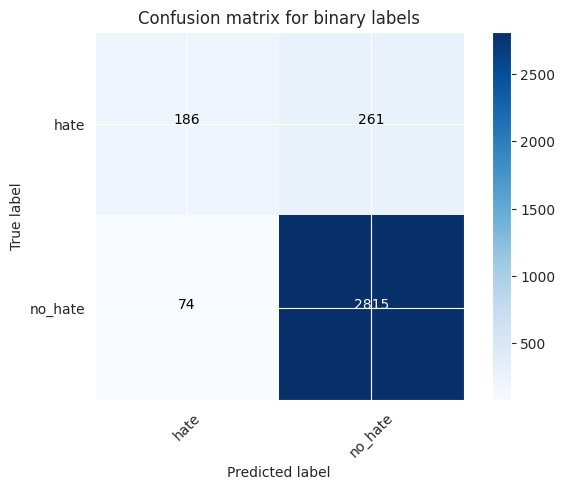

Test Accuracy: 0.8996
Test macro-F1: 0.735




CPU times: user 14min 20s, sys: 19.9 s, total: 14min 40s
Wall time: 1h 5min 47s


In [14]:
%%time
train_conditions: list[dict] = [
    {
        "name": "tf-2",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 2))
    },
    {
        "name": "tf-3",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 3))
    },
    {
        "name": "tf-idf-2",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 2))
    },
    {
        "name": "tf-idf-3",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

random_forest_grid = {
    "n_estimators": [32, 64, 100, 256, 512],
    "criterion": ["gini", "entropy", "log_loss"],
    "max_depth": [3, 16, 32, 64, 128],
    "min_samples_split": [2, 0.05, 0.1, 0.2, 0.3],
    "min_samples_leaf": [1, 0.1, 0.2, 0.3],
    "max_features": ["sqrt", "log2"],
    "bootstrap": [True]
}

for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")

    for dataset_folder in [dataset_v2_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        for feature_selector in [SelectKBest(chi2, k=10000)]:
            feature_selector_params: dict = None if feature_selector is None else feature_selector.get_params()
            print(f"Feature selector class used: {type(feature_selector)} with config: {feature_selector_params} ===")
            model: MLClassifier = MLClassifier(estimator=RandomForestClassifier(n_jobs=-1, random_state=999),
                                               vectorizer=vectorizer,
                                               optimization_grid=random_forest_grid,
                                               feat_selector=feature_selector,
                                               verbosity=0)

            x_train, y_train, x_val, y_val, x_test, y_test = (
                x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

            model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
            # TESTING =================>
            model.predict_with_report(x_test=x_test, y_true=y_test)

En este caso, obtenemos como mejor performance un **53.69% de macro-F1 (multi-class) y un 73.5% de macro F1 (binary-class)**. Estos rendimientos están bastante por debajo a los obtenidos con los modelos anteriores.

Puede deberse a que el modelo utilizado no funciona muy bien para esta tarea o a que utilizamos chi2 para acotar el vocabulario y eso afectó bastante nuestro rendimiento. Para descartar, repetiré la misma prueba pero utilizando todo el vocabulario para la mejor combinación.

TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predef

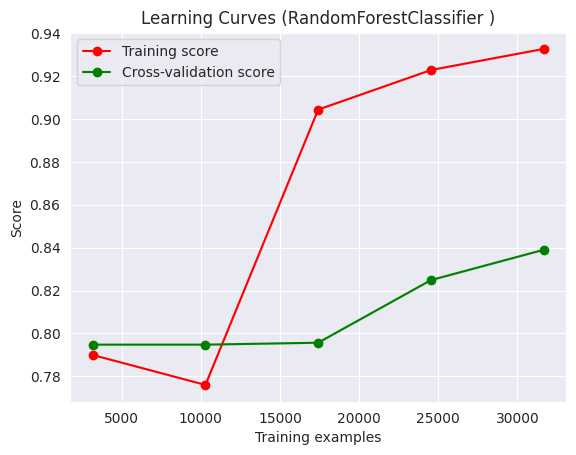


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.8419    0.9773    0.9045      2642
         NOM     0.6222    0.3401    0.4398       247
         OFG     0.0000    0.0000    0.0000        43
         OFP     0.7143    0.2351    0.3538       404

    accuracy                         0.8276      3336
   macro avg     0.5446    0.3881    0.4245      3336
weighted avg     0.7993    0.8276    0.7918      3336



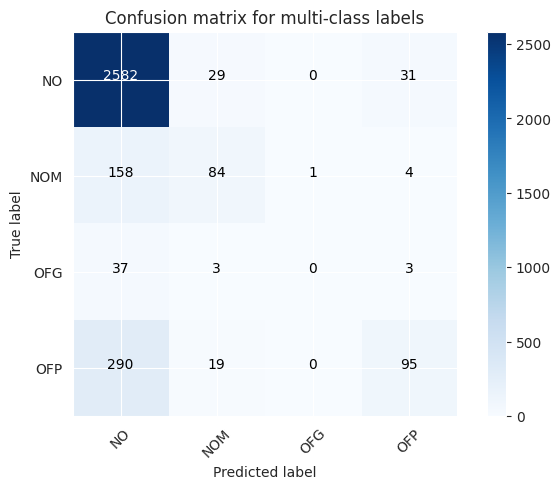

Test Accuracy: 0.8276
Test macro-F1: 0.4245


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.7313    0.2192    0.3373       447
     no_hate     0.8910    0.9875    0.9368      2889

    accuracy                         0.8846      3336
   macro avg     0.8112    0.6034    0.6371      3336
weighted avg     0.8696    0.8846    0.8565      3336



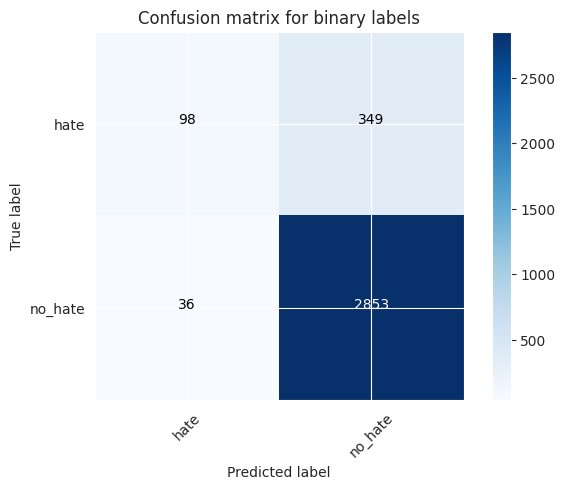

Test Accuracy: 0.8846
Test macro-F1: 0.6371




CPU times: user 15min 35s, sys: 8.92 s, total: 15min 44s
Wall time: 1h 19min 16s


In [17]:
%%time
train_conditions: list[dict] = [
    {
        "name": "tf-idf-3",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

random_forest_grid = {
    "n_estimators": [32, 64, 100, 256, 512],
    "criterion": ["gini", "entropy", "log_loss"],
    "max_depth": [3, 16, 32, 64, 128],
    "min_samples_split": [2, 0.05, 0.1, 0.2, 0.3],
    "min_samples_leaf": [1, 0.1, 0.2, 0.3],
    "max_features": ["sqrt", "log2"],
    "bootstrap": [True]
}

for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")

    for dataset_folder in [dataset_v2_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        # Initially, no feature selection
        model: MLClassifier = MLClassifier(estimator=RandomForestClassifier(n_jobs=-1, random_state=999),
                                           vectorizer=vectorizer,
                                           optimization_grid=random_forest_grid,
                                           feat_selector=None,
                                           verbosity=0)

        x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                          x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

        model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
        # TESTING =================>
        model.predict_with_report(x_test=x_test, y_true=y_test)

En este caso, entrenando con más datos los resultados son peores, lo cual es un tanto curioso.

## XGBoost

Otro algoritmo que performa históricamente muy bien para esta tarea es XGBoost. Como podemos ver en su [página de documentación](https://xgboost.readthedocs.io/en/stable/python/sklearn_estimator.html), el modelo implementa la interfaz de Estimator que usamos de scikit-learn, con lo cual deberíamos poder hacer plug&play de este modelo directamente con el código que tenemos.

### Parámetros explorables

Leyendo [este blog](https://medium.com/@rithpansanga/optimizing-xgboost-a-guide-to-hyperparameter-tuning-77b6e48e289d), saqué el listado de parámetros que comparto a continuación. Como ambos están basados en árboles, muchos de ellos los vimos ya con Random Forests.

In XGBoost, there are two main types of hyperparameters: tree-specific and learning task-specific.

**Tree-specific hyperparameters control the construction and complexity of the decision trees:**
- `max_depth`: maximum depth of a tree. Deeper trees can capture more complex patterns in the data, but may also lead to overfitting.
- `min_child_weight`: minimum sum of instance weight (hessian) needed in a child. This can be used to control the complexity of the decision tree by preventing the creation of too small leaves.
- `subsample`: percentage of rows used for each tree construction. Lowering this value can prevent overfitting by training on a smaller subset of the data.
- `colsample_bytree`: percentage of columns used for each tree construction. Lowering this value can prevent overfitting by training on a subset of the features.

**Learning task-specific hyperparameters control the overall behavior of the model and the learning process:**
- `eta` (also known as learning rate): step size shrinkage used in updates to prevent overfitting. Lower values make the model more robust by taking smaller steps.
- `gamma`: minimum loss reduction required to make a further partition on a leaf node of the tree. Higher values increase the regularization.
- `lambda`: L2 regularization term on weights. Higher values increase the regularization.
- `alpha`: L1 regularization term on weights. Higher values increase the regularization.

Tal y como hicimos en algoritmos anteriores, eligiremos un subset para ver qué resultados obtenemos.


TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Feature selector class used: <class 'sklearn.feature_selection._univariate_selection.SelectKBest'> with config: {'k': 10000, 'score_func': <function chi2 at 0x74eeacadea20>} ===
Training feature extractor on x_train...
Feature extractor

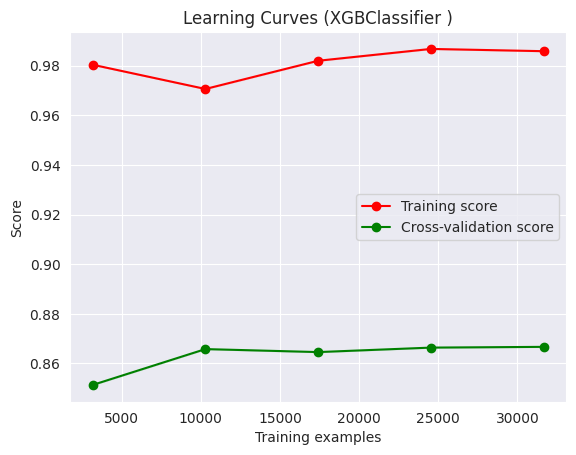


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9208    0.9455    0.9330      2642
         NOM     0.5958    0.6923    0.6404       247
         OFG     0.2000    0.0465    0.0755        43
         OFP     0.6748    0.5446    0.6027       404

    accuracy                         0.8666      3336
   macro avg     0.5979    0.5572    0.5629      3336
weighted avg     0.8576    0.8666    0.8603      3336



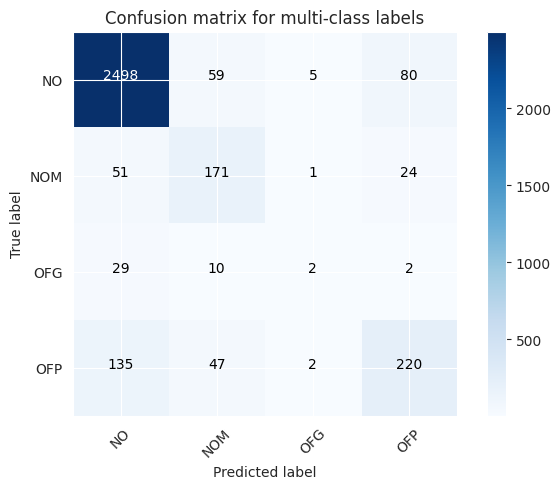

Test Accuracy: 0.8666
Test macro-F1: 0.5629


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6726    0.5056    0.5773       447
     no_hate     0.9263    0.9619    0.9438      2889

    accuracy                         0.9008      3336
   macro avg     0.7995    0.7338    0.7605      3336
weighted avg     0.8923    0.9008    0.8947      3336



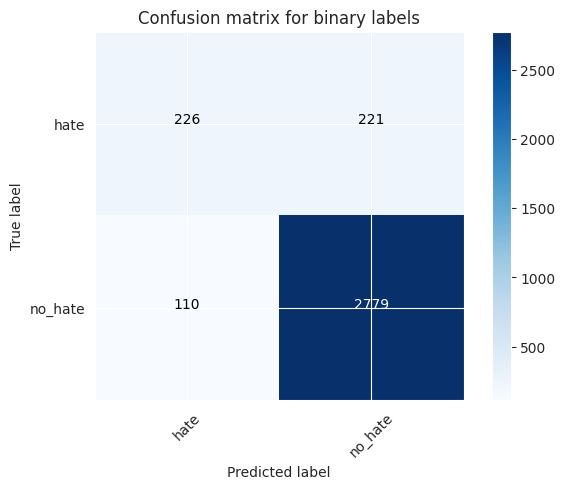

Test Accuracy: 0.9008
Test macro-F1: 0.7605




TRAINING condition: 'tf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Feature selector class used: <class 'sklearn.feature_selection._univariate_selection.SelectKBest'> with config: {'k': 10000, 'score_func': <function chi2 at 0x74eeacadea20>} ===
Training f

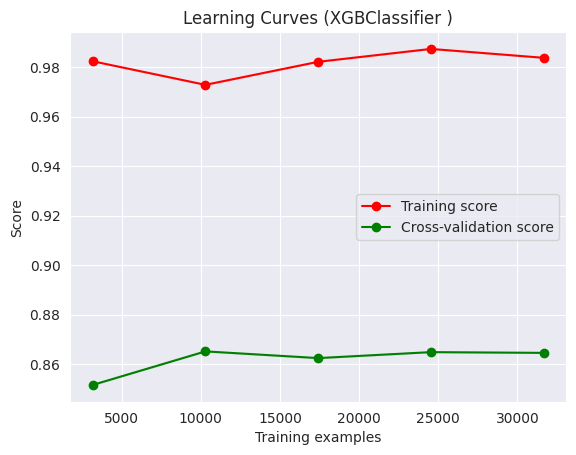


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9211    0.9459    0.9333      2642
         NOM     0.6064    0.6923    0.6465       247
         OFG     0.1667    0.0465    0.0727        43
         OFP     0.6717    0.5470    0.6030       404

    accuracy                         0.8672      3336
   macro avg     0.5915    0.5579    0.5639      3336
weighted avg     0.8579    0.8672    0.8610      3336



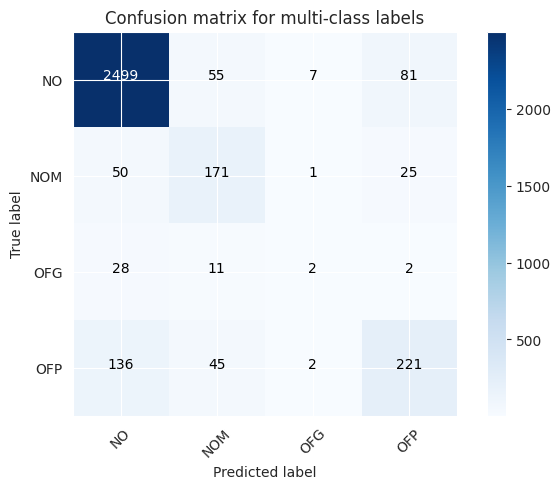

Test Accuracy: 0.8672
Test macro-F1: 0.5639


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6657    0.5078    0.5761       447
     no_hate     0.9265    0.9605    0.9432      2889

    accuracy                         0.8999      3336
   macro avg     0.7961    0.7342    0.7597      3336
weighted avg     0.8916    0.8999    0.8940      3336



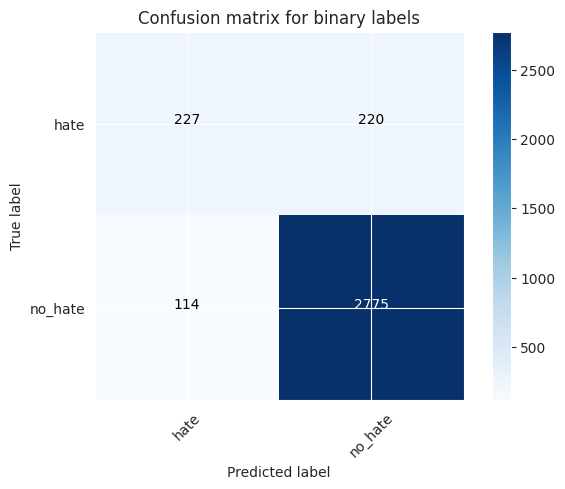

Test Accuracy: 0.8999
Test macro-F1: 0.7597




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Feature selector class used: <class 'sklearn.feature_selection._univariate_selection.SelectKBest'> with conf

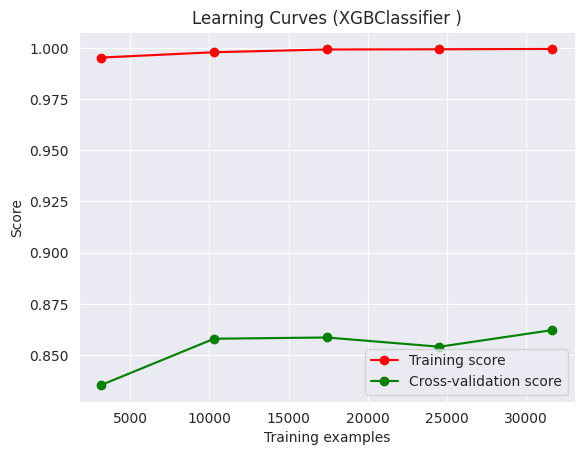


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9225    0.9016    0.9119      2642
         NOM     0.5521    0.6437    0.5944       247
         OFG     0.0833    0.1163    0.0971        43
         OFP     0.5369    0.5396    0.5383       404

    accuracy                         0.8285      3336
   macro avg     0.5237    0.5503    0.5354      3336
weighted avg     0.8376    0.8285    0.8327      3336



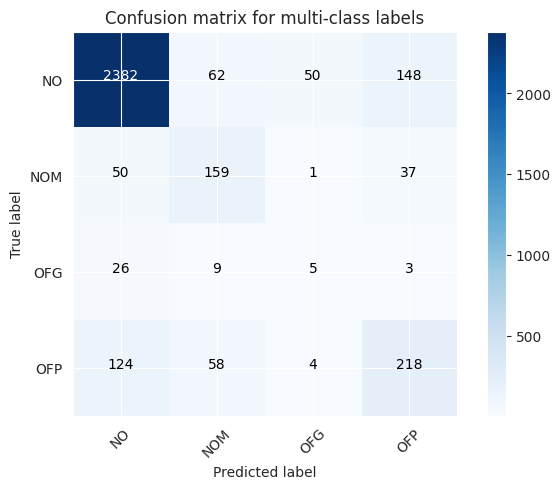

Test Accuracy: 0.8285
Test macro-F1: 0.5354


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.4936    0.5145    0.5038       447
     no_hate     0.9244    0.9183    0.9213      2889

    accuracy                         0.8642      3336
   macro avg     0.7090    0.7164    0.7126      3336
weighted avg     0.8667    0.8642    0.8654      3336



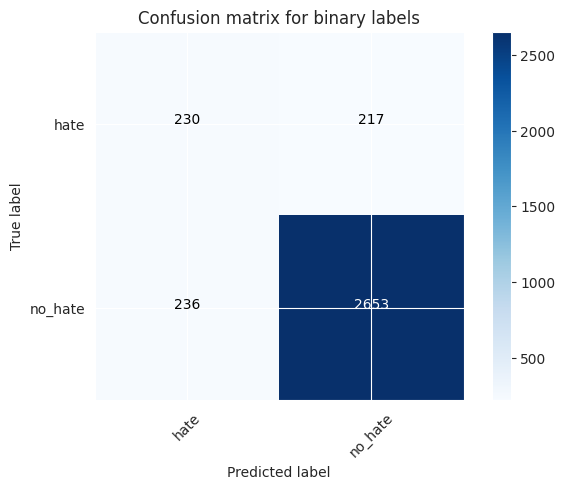

Test Accuracy: 0.8642
Test macro-F1: 0.7126




TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v2' ========
Total elements for train: 31660
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Feature selector class used: <class 'sklearn.feature_selection._univariate_selection.SelectKBest'> with conf

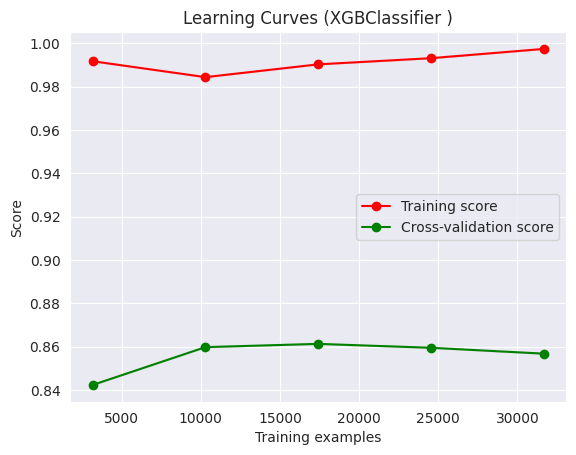


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9376    0.8524    0.8929      2642
         NOM     0.5422    0.6761    0.6018       247
         OFG     0.0602    0.1860    0.0909        43
         OFP     0.5010    0.6114    0.5507       404

    accuracy                         0.8016      3336
   macro avg     0.5102    0.5815    0.5341      3336
weighted avg     0.8441    0.8016    0.8196      3336



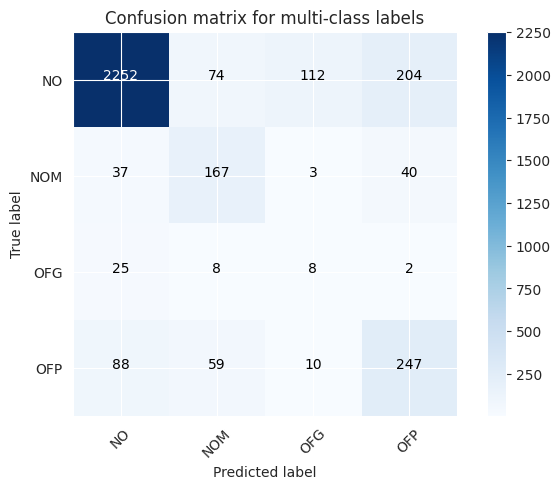

Test Accuracy: 0.8016
Test macro-F1: 0.5341


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.4265    0.5973    0.4977       447
     no_hate     0.9336    0.8757    0.9037      2889

    accuracy                         0.8384      3336
   macro avg     0.6800    0.7365    0.7007      3336
weighted avg     0.8656    0.8384    0.8493      3336



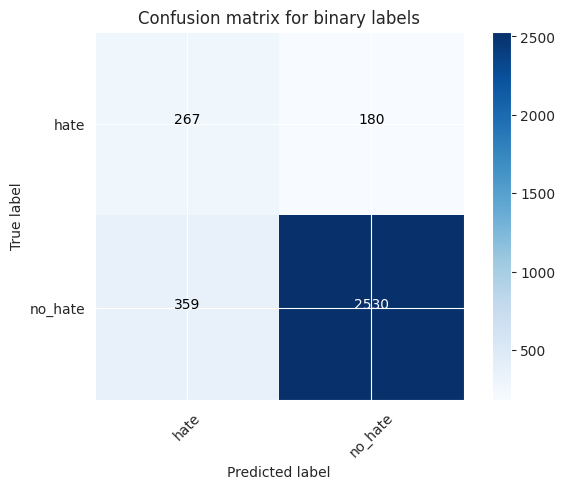

Test Accuracy: 0.8384
Test macro-F1: 0.7007




CPU times: user 10h 35min 18s, sys: 1min 26s, total: 10h 36min 44s
Wall time: 6h 1min 17s


In [16]:
%%time
train_conditions: list[dict] = [
    {
        "name": "tf-2",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 2))
    },
    {
        "name": "tf-3",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 3))
    },
    {
        "name": "tf-idf-2",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 2))
    },
    {
        "name": "tf-idf-3",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

xgboost_grid = {
    "learning_rate": [0.01, 0.05, 0.1, 0.25, 0.5, 1],
    "n_estimators": [32, 64, 100, 256, 512],
    "max_depth": [3, 16, 32, 64, 128]
}

for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")

    for dataset_folder in [dataset_v2_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        # Initially, no feature selection
        for feature_selector in [SelectKBest(chi2, k=10000)]:
            feature_selector_params: dict = None if feature_selector is None else feature_selector.get_params()
            print(f"Feature selector class used: {type(feature_selector)} with config: {feature_selector_params} ===")
            model: MLClassifier = MLClassifier(estimator=xgb.XGBClassifier(tree_method="hist"),
                                               vectorizer=vectorizer,
                                               optimization_grid=xgboost_grid,
                                               feat_selector=feature_selector,
                                               verbosity=0)

            x_train, y_train, x_val, y_val, x_test, y_test = (
                x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

            model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
            # TESTING =================>
            model.predict_with_report(x_test=x_test, y_true=y_test)

En este caso, podemos notar que el entrenamiento de este tipo de modelos lleva mucho más tiempo. **Obtenemos una performance de 56.39% de macro-f1 (multi-class) y 75.97% de macro-f1 (binary)**. La performance no es mejor que la que obtuvimos hasta el momento con modelos como Logistic Regression.

## Uso de class_weights or sample_weights

Otra estrategia que podemos usar si no queremos balancear el dataset a través de técnicas de aumentación son los sample weights. Para los modelos de scikit learn como SVC y Logistic Regression, tenemos un parámetro llamado `class_weight` (también está `sample_weight`) que nos permite pasarle los pesos que queremos que se apliquen a los samples de cada una de las clases. Para el caso de `sample_weight`, la idea es la misma, sólo que brinda un mayor nivel de granularidad, porque podríamos dar pesos distintos a samples de una misma clase.

De esa forma, podemos pensar que samples para clases minoritarias van a tener un peso mayor en el cálculo de la función de pérdida del entrenamiento que samples que pertenecen a la clase mayoritaria. Típicamente suele usarse el inverso de la class frequency como el peso de cada sample (de hecho es lo que hace scikit learn cuando le pasamos `class_weight="balanced"`.

Suponiendo que tenemos la clase A con 1000 elementos y la clase B con 100 elementos en el dataset de training, podemos calcular:

weight_A = (1000+100)/1000 = 1.1
weight_B = (1000+100)/100 = 11

De esta forma, los ejemplos pertenecientes a la clase B van a pesar mucho más en el cálculo de la función de pérdida y entonces tener mayor influencia sobre cómo el modelo ajuste sus pesos.

Realizaremos alguna prueba a continuación para ver qué tal nos va. Naturalmente, usaremos la versión `v1` que es la que no tiene el Random Over Sampling aplicado (es simplemente la versión original con un ligero cleanup).

### Logistic Regression

Probaremos re-entrenar este modelo con esta técnica, puesto que fue el que mejores resultados nos ha dado.

TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation set
Fitting 1 folds for each of 22 candidates,

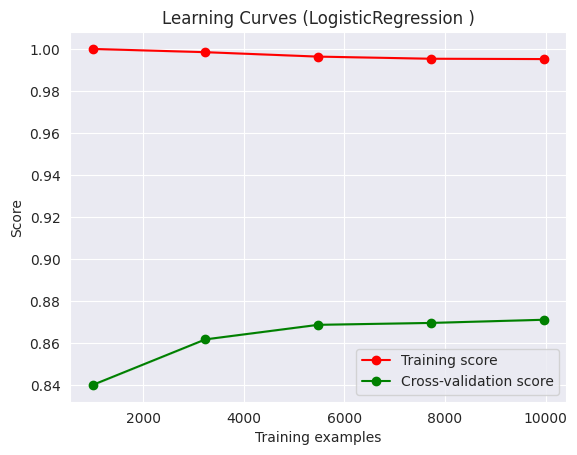


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9189    0.9610    0.9395      2642
         NOM     0.6693    0.6883    0.6786       247
         OFG     0.4444    0.0930    0.1538        43
         OFP     0.7258    0.5569    0.6303       404

    accuracy                         0.8807      3336
   macro avg     0.6896    0.5748    0.6006      3336
weighted avg     0.8709    0.8807    0.8726      3336



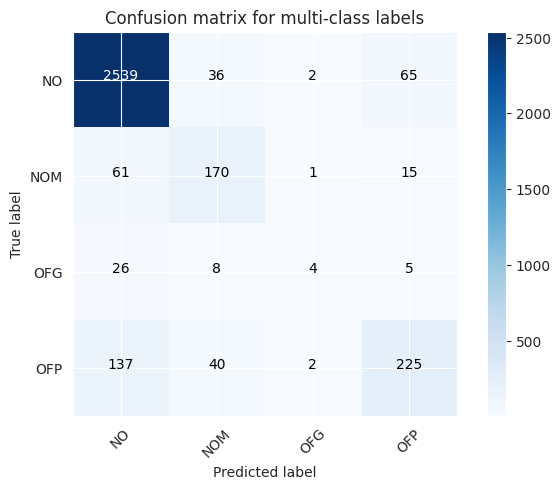

Test Accuracy: 0.8807
Test macro-F1: 0.6006


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.7398    0.5280    0.6162       447
     no_hate     0.9301    0.9713    0.9502      2889

    accuracy                         0.9119      3336
   macro avg     0.8349    0.7496    0.7832      3336
weighted avg     0.9046    0.9119    0.9055      3336



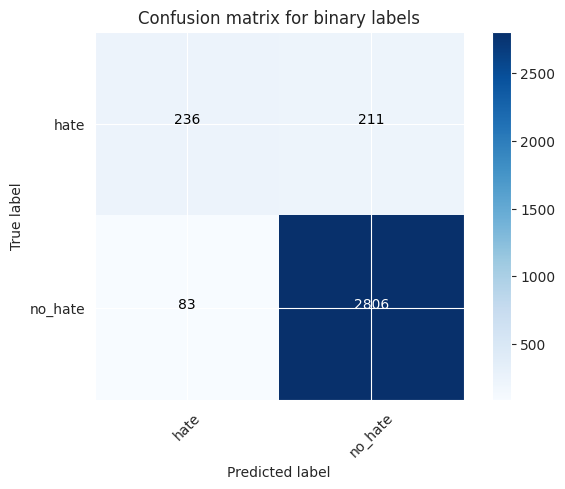

Test Accuracy: 0.9119
Test macro-F1: 0.7832




TRAINING condition: 'tf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validatio

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Best estimator is: LogisticRegression(C=1, class_weight='balanced', max_iter=500,
                   solver='liblinear')
Model trained correctly
Plotting val-scores for each grid configuration
{'mean_fit_time': array([ 23.56595516,   8.25658488,  20.43410301,  28.1385448 ,
        35.94802618,  33.85699773,  33.22320199,  19.45130968,
         1.96483731,   6.139431  ,   7.30872488,   6.59262967,
         9.79105067,  11.07486773, 283.76990676,  22.26628876,
         9.73414803,  22.07825541,  13.67979264,  17.94497108,
        11.17187953,  16.15838003]), 'std_fit_time': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]), 'mean_score_time': array([0.04717016, 0.02707338, 0.05294847, 0.03075838, 0.01580834,
       0.02720189, 0.02260089, 0.02576852, 0.00958586, 0.01677442,
       0.0123682 , 0.01163578, 0.01059127, 0.01109719, 0.00274515,
       0.00512981, 0.00935984, 0.00815296, 0.01096678, 0.0030272 ,
       0.00930858, 0.00248814]

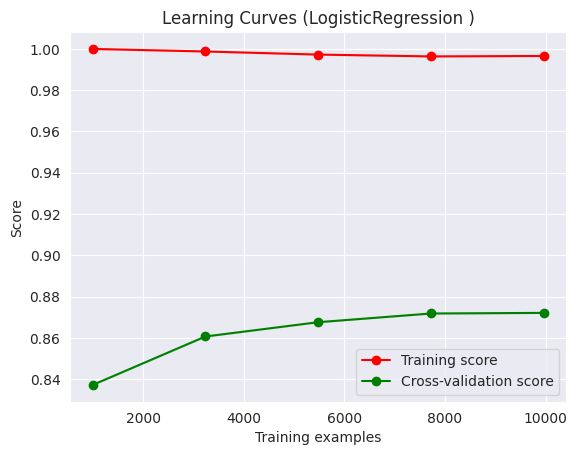


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9155    0.9640    0.9392      2642
         NOM     0.6641    0.6883    0.6759       247
         OFG     0.5000    0.0930    0.1569        43
         OFP     0.7345    0.5272    0.6138       404

    accuracy                         0.8795      3336
   macro avg     0.7035    0.5681    0.5964      3336
weighted avg     0.8696    0.8795    0.8702      3336



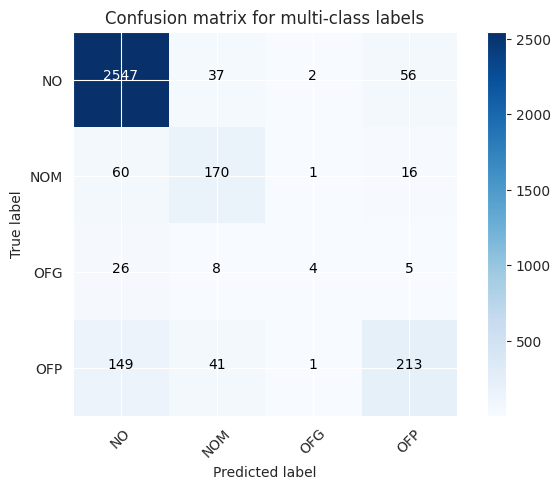

Test Accuracy: 0.8795
Test macro-F1: 0.5964


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.7483    0.4989    0.5987       447
     no_hate     0.9263    0.9740    0.9496      2889

    accuracy                         0.9104      3336
   macro avg     0.8373    0.7365    0.7741      3336
weighted avg     0.9024    0.9104    0.9025      3336



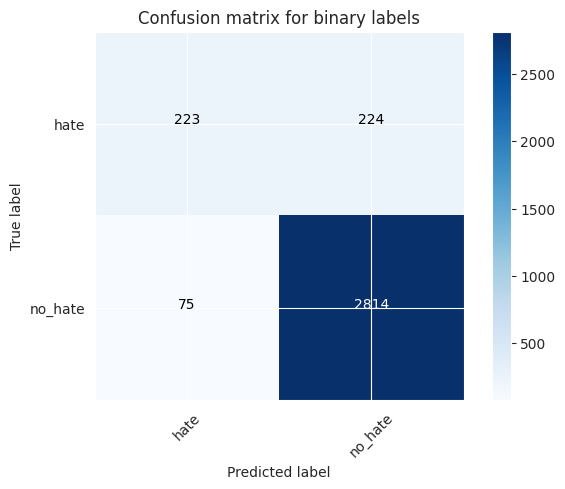

Test Accuracy: 0.9104
Test macro-F1: 0.7741




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label e

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Best estimator is: LogisticRegression(C=10, class_weight='balanced', max_iter=500, penalty='l1',
                   solver='liblinear')
Model trained correctly
Plotting val-scores for each grid configuration
{'mean_fit_time': array([14.63459635,  1.37974119,  4.65520954, 11.11963844, 26.45833421,
       25.27980161, 35.98802948, 23.63240027,  0.92031193,  0.59473848,
        1.6015842 ,  0.8049233 ,  3.23721075,  1.56372738, 31.7652669 ,
        3.20216322, 58.86247396,  3.9246037 , 49.30092454,  5.56442785,
        8.63790751,  5.05209231]), 'std_fit_time': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]), 'mean_score_time': array([0.01409578, 0.01939774, 0.02184248, 0.01962256, 0.00557423,
       0.00623298, 0.0082531 , 0.00710082, 0.00788999, 0.00376844,
       0.00703049, 0.00873733, 0.02618241, 0.00744009, 0.00476503,
       0.0085969 , 0.00448608, 0.00763321, 0.00196052, 0.0091362 ,
       0.00481176, 0.00698352]), 'std_score_

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/1] END C=0.01, max_iter=500, penalty=l2, solver=lbfgs;, score=0.850 total time=   4.7s
[CV 1/1] END C=100, max_iter=500, penalty=l2, solver=liblinear;, score=0.869 total time=   5.6s
[CV 1/1] END C=0.1, max_iter=500, penalty=l2, solver=lbfgs;, score=0.862 total time=  11.1s
[CV 1/1] END C=0.001, max_iter=500, penalty=l2, solver=lbfgs;, score=0.847 total time=   1.4s
[CV 1/1] END C=0.1, max_iter=500, penalty=l2, solver=liblinear;, score=0.808 total time=   1.6s
[CV 1/1] END C=10, max_iter=500, penalty=l2, solver=liblinear;, score=0.870 total time=   3.9s
[CV 1/1] END C=1000, max_iter=500, penalty=l2, solver=liblinear;, score=0.867 total time=   5.1s
[CV 1/1] END C=1000, max_iter=500, penalty=l2, solver=lbfgs;, score=0.865 total time=  11.9s
[CV 1/1] END C=1000, max_iter=500, penalty=l2, solver=liblinear;, score=0.862 total time=   9.3s
[CV 1/1] END C=0.01, max_iter=500, penalty=l2, solver=liblinear;, score=0.836 total time=   6.6s
[CV 1/1] END C=1, max_iter=500, penalty=l1, solver

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


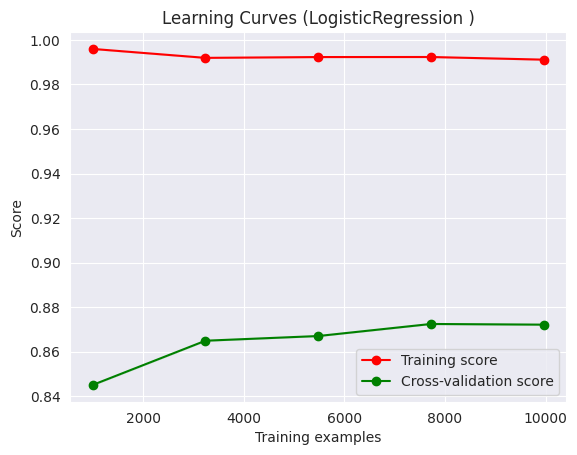


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9393    0.9251    0.9321      2642
         NOM     0.6502    0.7449    0.6943       247
         OFG     0.1852    0.1163    0.1429        43
         OFP     0.6108    0.6411    0.6256       404

    accuracy                         0.8669      3336
   macro avg     0.5964    0.6068    0.5987      3336
weighted avg     0.8684    0.8669    0.8672      3336



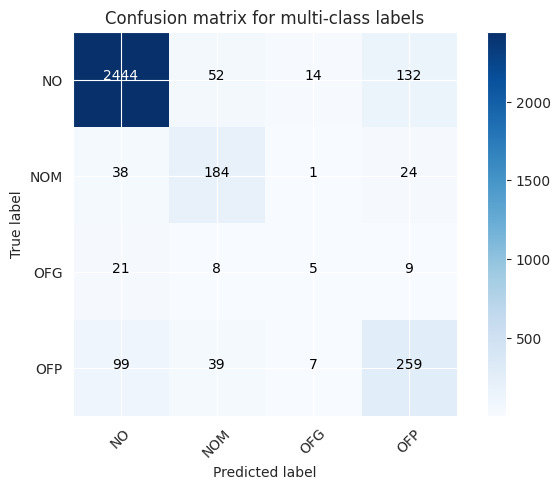

Test Accuracy: 0.8669
Test macro-F1: 0.5987


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6208    0.6264    0.6236       447
     no_hate     0.9421    0.9408    0.9415      2889

    accuracy                         0.8987      3336
   macro avg     0.7815    0.7836    0.7825      3336
weighted avg     0.8991    0.8987    0.8989      3336



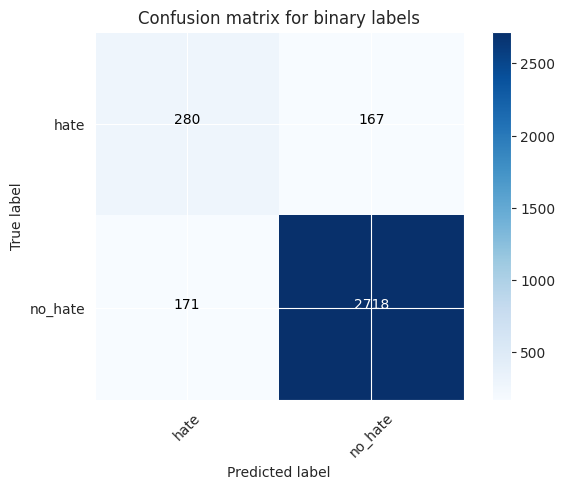

Test Accuracy: 0.8987
Test macro-F1: 0.7825




TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label e

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/1] END C=0.001, max_iter=500, penalty=l1, solver=liblinear;, score=0.795 total time=   2.1s
[CV 1/1] END C=1, max_iter=500, penalty=l1, solver=liblinear;, score=0.870 total time=   8.9s
[CV 1/1] END C=0.001, max_iter=500, penalty=l2, solver=liblinear;, score=0.795 total time=   1.2s
[CV 1/1] END C=0.1, max_iter=500, penalty=l1, solver=liblinear;, score=0.830 total time=   5.6s
[CV 1/1] END C=100, max_iter=500, penalty=l2, solver=liblinear;, score=0.861 total time=   8.0s
[CV 1/1] END C=0.1, max_iter=500, penalty=l2, solver=lbfgs;, score=0.866 total time=  18.9s
[CV 1/1] END C=0.01, max_iter=500, penalty=l1, solver=liblinear;, score=0.795 total time=   2.2s
[CV 1/1] END C=0.1, max_iter=500, penalty=l2, solver=liblinear;, score=0.801 total time=   2.4s
[CV 1/1] END C=10, max_iter=500, penalty=l2, solver=liblinear;, score=0.862 total time=   6.0s
[CV 1/1] END C=1000, max_iter=500, penalty=l2, solver=liblinear;, score=0.861 total time=  10.6s
[CV 1/1] END C=0.01, max_iter=500, penalt

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Best estimator is: LogisticRegression(C=1, class_weight='balanced', max_iter=500)
Model trained correctly
Plotting val-scores for each grid configuration
{'mean_fit_time': array([ 33.16868091,   2.74705982,   6.81432462,  18.8380425 ,
        36.52002764,  44.93349266,  42.74458814,  43.12156773,
         2.11739731,   1.18844795,   2.21586704,   2.8632164 ,
         5.56318951,   2.42430973,   8.92867637,   4.28702807,
       181.56812429,   6.00176978, 571.26334643,   7.96556473,
        57.27445531,  10.62508035]), 'std_fit_time': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]), 'mean_score_time': array([0.03115726, 0.02954149, 0.01994252, 0.01581287, 0.01229405,
       0.01213408, 0.0235312 , 0.03223085, 0.01599455, 0.00873303,
       0.00933385, 0.01150346, 0.01274419, 0.00693107, 0.01431203,
       0.00793982, 0.00268912, 0.00961232, 0.00303721, 0.00872302,
       0.00294542, 0.01254106]), 'std_score_time': array([0., 0., 0.,

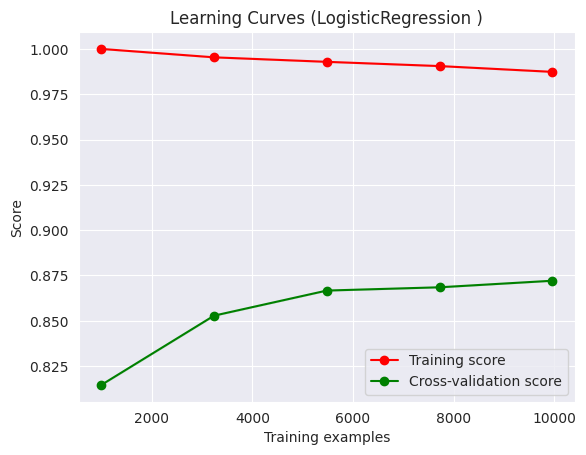


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9310    0.9451    0.9380      2642
         NOM     0.6544    0.7206    0.6859       247
         OFG     0.2500    0.1395    0.1791        43
         OFP     0.6760    0.5990    0.6352       404

    accuracy                         0.8762      3336
   macro avg     0.6279    0.6011    0.6096      3336
weighted avg     0.8709    0.8762    0.8729      3336



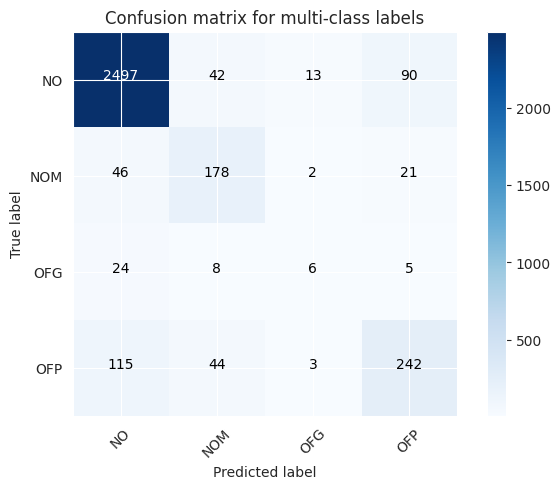

Test Accuracy: 0.8762
Test macro-F1: 0.6096


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6702    0.5727    0.6176       447
     no_hate     0.9353    0.9564    0.9457      2889

    accuracy                         0.9050      3336
   macro avg     0.8027    0.7645    0.7817      3336
weighted avg     0.8998    0.9050    0.9018      3336



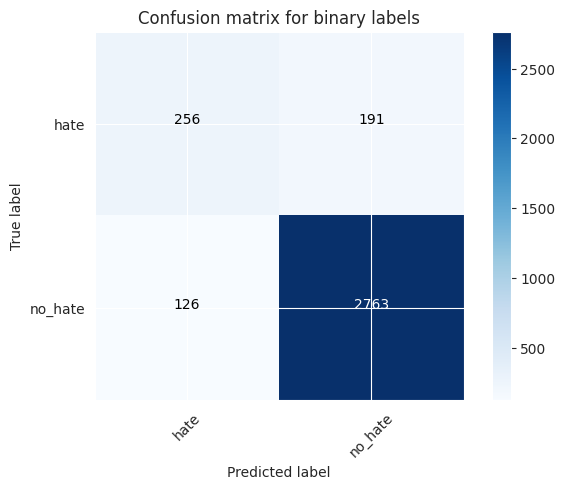

Test Accuracy: 0.905
Test macro-F1: 0.7817




CPU times: user 1h 1min 15s, sys: 19.2 s, total: 1h 1min 34s
Wall time: 27min


In [13]:
%%time
train_conditions: list[dict] = [
    {
        "name": "tf-2",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 2))
    },
    {
        "name": "tf-3",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 3))
    },
    {
        "name": "tf-idf-2",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 2))
    },
    {
        "name": "tf-idf-3",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

max_ent_grid = [
    {'penalty': [None], "solver": ["lbfgs"], "max_iter": [500]},  # the simplest
    {'penalty': ['l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], "solver": ["lbfgs"], "max_iter": [500]},
    {'penalty': ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], "solver": ["liblinear"], "max_iter": [500]}
]

for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")

    for dataset_folder in [dataset_v1_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        model: MLClassifier = MLClassifier(estimator=LogisticRegression(class_weight="balanced"),
                                           vectorizer=vectorizer,
                                           optimization_grid=max_ent_grid,
                                           feat_selector=None)

        x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                          x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

        model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
        # TESTING =================>
        model.predict_with_report(x_test=x_test, y_true=y_test)

Como podemos observar, alcanzamos una **performance de 60.96% de macro-f1 (multi-class) y 78.17% de macro-f1 (binary class)**. Estos resultados son ligeramente mejores que los que obtuvimos cuando no usamos esta estrategia y balanceamos el training set a mano con Random Over Sampling. Esto es bastante positivo, porque nos permite un entrenamiento más veloz, ya que el modelo ve menos samples, sólo que los pesa de forma diferente según a la clase a la que pertenece.

Repetiremoe esta misma prueba pero usando `v6` ahora, de forma de ver si logramos mejorar los resultados sobre `OFG`.

TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v6' ========
Total elements for train: 11059
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation set
Fitting 1 folds for each of 22 candidates

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Best estimator is: LogisticRegression(C=1, class_weight='balanced', max_iter=5000,
                   solver='liblinear')
Model trained correctly
Plotting val-scores for each grid configuration
{'mean_fit_time': array([  11.22535801,    4.1308341 ,   12.73176575,   18.97979736,
         27.14151764,   28.49757004,   15.3244195 ,   21.22506428,
          1.77288771,    3.46277666,    4.57074714,    4.79433322,
          3.51880908,   11.87344098, 1226.38675809,   12.11466575,
          9.95038748,   13.66551876,    7.44008803,   12.97223711,
          8.97516727,   12.32198119]), 'std_fit_time': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]), 'mean_score_time': array([0.01710606, 0.0205555 , 0.02846694, 0.01780725, 0.01130557,
       0.01211381, 0.02529025, 0.01400065, 0.01178241, 0.02552962,
       0.0379703 , 0.00680804, 0.00597572, 0.0306797 , 0.00389957,
       0.00666118, 0.00667071, 0.00612807, 0.02162576, 0.00430751,
       

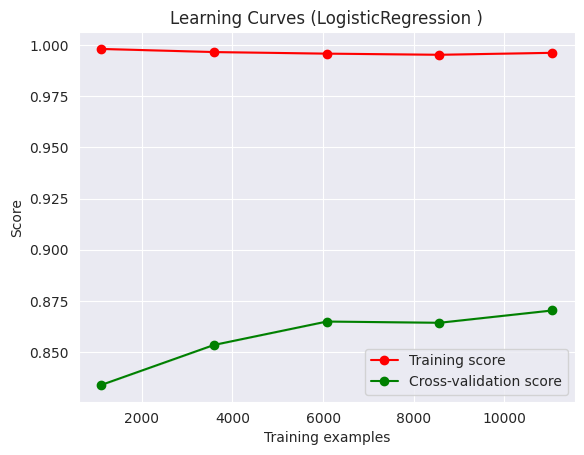


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9196    0.9531    0.9361      2642
         NOM     0.6693    0.6964    0.6825       247
         OFG     0.1600    0.0930    0.1176        43
         OFP     0.7120    0.5569    0.6250       404

    accuracy                         0.8750      3336
   macro avg     0.6152    0.5748    0.5903      3336
weighted avg     0.8662    0.8750    0.8691      3336



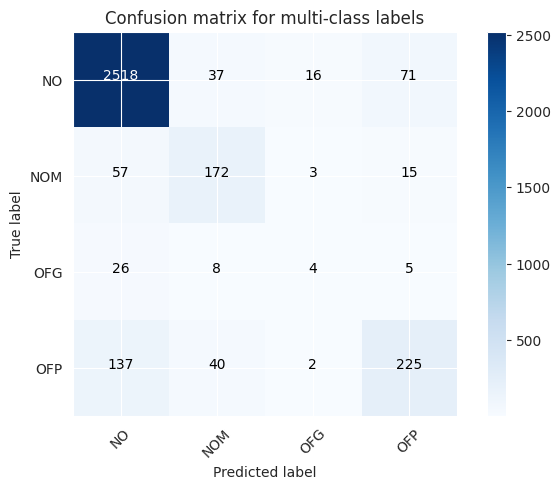

Test Accuracy: 0.875
Test macro-F1: 0.5903


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6921    0.5280    0.5990       447
     no_hate     0.9295    0.9637    0.9463      2889

    accuracy                         0.9053      3336
   macro avg     0.8108    0.7458    0.7726      3336
weighted avg     0.8977    0.9053    0.8998      3336



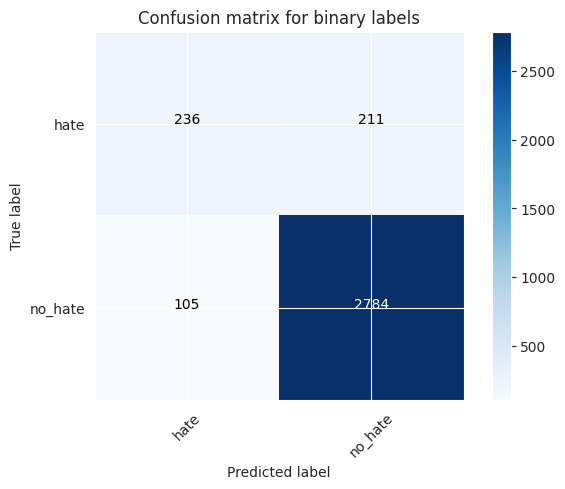

Test Accuracy: 0.9053
Test macro-F1: 0.7726




TRAINING condition: 'tf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v6' ========
Total elements for train: 11059
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validati

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Best estimator is: LogisticRegression(C=1, class_weight='balanced', max_iter=5000,
                   solver='liblinear')
Model trained correctly
Plotting val-scores for each grid configuration
{'mean_fit_time': array([2.00679266e+01, 6.28164887e+00, 1.65604017e+01, 2.82559323e+01,
       3.65803864e+01, 3.30500720e+01, 3.69481061e+01, 2.15311043e+01,
       1.68673778e+00, 4.89863038e+00, 4.42605495e+00, 8.89022994e+00,
       7.45180488e+00, 1.29964483e+01, 2.92098007e+03, 2.21639204e+01,
       1.35845232e+01, 2.77787199e+01, 1.50030971e+01, 2.18051071e+01,
       1.38074691e+01, 1.98431494e+01]), 'std_fit_time': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]), 'mean_score_time': array([0.0810051 , 0.0314517 , 0.04888082, 0.03341246, 0.013623  ,
       0.0145278 , 0.02161598, 0.03417611, 0.00789762, 0.00975847,
       0.01318264, 0.01007533, 0.02667403, 0.0093863 , 0.00259662,
       0.00517774, 0.00988364, 0.00327468, 0.0099563

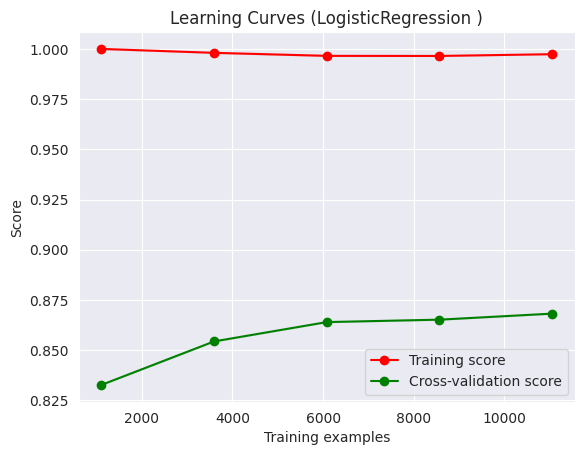


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9167    0.9580    0.9369      2642
         NOM     0.6602    0.6842    0.6720       247
         OFG     0.1818    0.0930    0.1231        43
         OFP     0.7340    0.5396    0.6220       404

    accuracy                         0.8759      3336
   macro avg     0.6232    0.5687    0.5885      3336
weighted avg     0.8661    0.8759    0.8686      3336



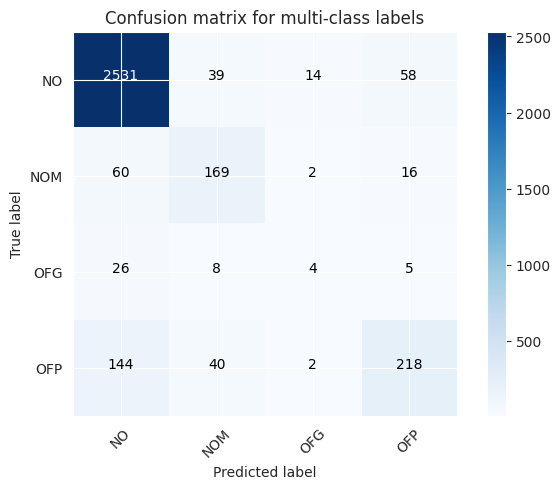

Test Accuracy: 0.8759
Test macro-F1: 0.5885


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.7179    0.5123    0.5979       447
     no_hate     0.9277    0.9688    0.9478      2889

    accuracy                         0.9077      3336
   macro avg     0.8228    0.7406    0.7729      3336
weighted avg     0.8996    0.9077    0.9010      3336



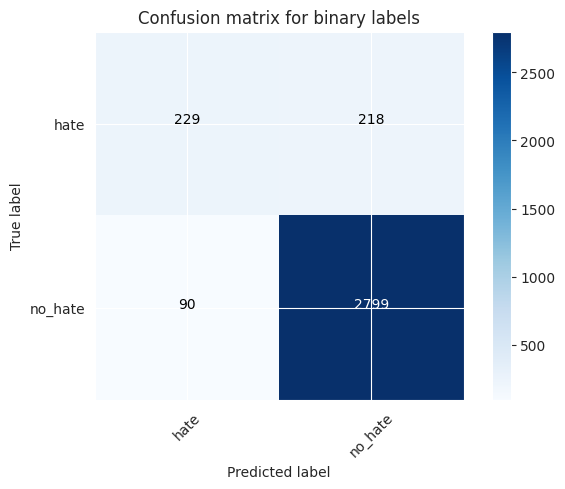

Test Accuracy: 0.9077
Test macro-F1: 0.7729




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v6' ========
Total elements for train: 11059
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label 

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/1] END C=100, max_iter=500, penalty=l2, solver=lbfgs;, score=0.863 total time=  29.6s
[CV 1/1] END C=1, max_iter=500, penalty=l2, solver=lbfgs;, score=0.868 total time=  29.7s
[CV 1/1] END C=10, max_iter=500, penalty=l2, solver=lbfgs;, score=0.872 total time=  35.3s


/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Best estimator is: LogisticRegression(C=10, class_weight='balanced', max_iter=500)
Model trained correctly
Plotting val-scores for each grid configuration
{'mean_fit_time': array([ 18.61441135,   0.73930955,   5.08400941,  11.59553289,
        29.70050788,  35.31753778,  29.5458293 ,  23.78107524,
         1.78915358,   1.5812819 ,   1.19871449,   1.4601934 ,
         3.09000492,   1.50153613,   6.92695093,   3.68809819,
       324.03051019,   5.63919973, 486.75298762,   7.00923753,
        10.35186934,   6.18302941]), 'std_fit_time': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]), 'mean_score_time': array([0.01838112, 0.01712012, 0.01187825, 0.01331329, 0.00819612,
       0.01184106, 0.0062871 , 0.01656485, 0.04133582, 0.0180316 ,
       0.01587009, 0.02966619, 0.00527334, 0.00662327, 0.00583434,
       0.00746012, 0.00201082, 0.01329494, 0.00161076, 0.01624084,
       0.00665331, 0.00748062]), 'std_score_time': array([0., 0., 0.

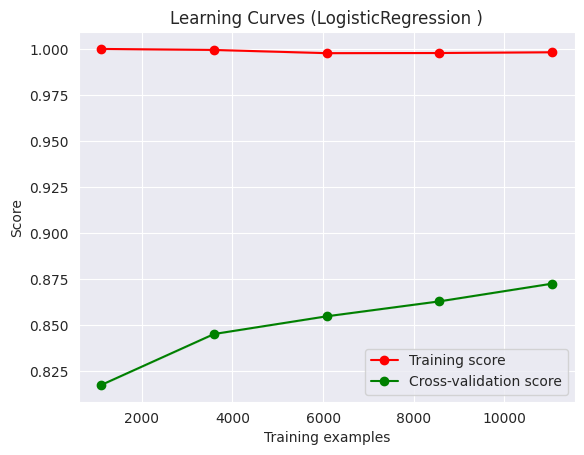


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9278    0.9481    0.9379      2642
         NOM     0.6846    0.6680    0.6762       247
         OFG     0.1795    0.1628    0.1707        43
         OFP     0.7051    0.6213    0.6605       404

    accuracy                         0.8777      3336
   macro avg     0.6242    0.6001    0.6113      3336
weighted avg     0.8732    0.8777    0.8750      3336



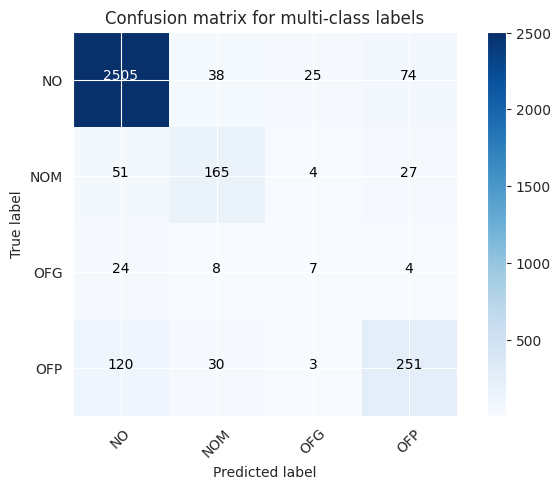

Test Accuracy: 0.8777
Test macro-F1: 0.6113


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6709    0.5928    0.6295       447
     no_hate     0.9381    0.9550    0.9465      2889

    accuracy                         0.9065      3336
   macro avg     0.8045    0.7739    0.7880      3336
weighted avg     0.9023    0.9065    0.9040      3336



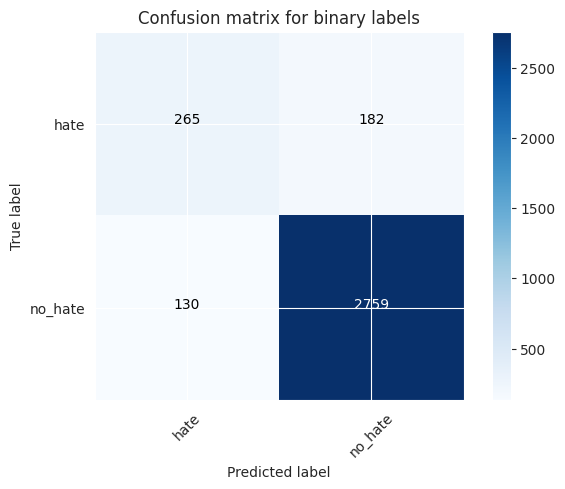

Test Accuracy: 0.9065
Test macro-F1: 0.788




TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v6' ========
Total elements for train: 11059
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label e

/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


[CV 1/1] END C=0.01, max_iter=500, penalty=l2, solver=lbfgs;, score=0.833 total time=   4.2s
[CV 1/1] END C=100, max_iter=5000, penalty=l1, solver=liblinear;, score=0.856 total time=20.1min


/home/lucas/anaconda3/envs/master_nlp/lib/python3.11/site-packages/sklearn/svm/_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Best estimator is: LogisticRegression(C=1, class_weight='balanced', max_iter=500)
Model trained correctly
Plotting val-scores for each grid configuration
{'mean_fit_time': array([4.29791899e+01, 1.34169984e+00, 4.19987583e+00, 2.53288374e+01,
       4.61300621e+01, 4.02087946e+01, 4.36611512e+01, 3.98398266e+01,
       1.35119128e+00, 1.41785073e+00, 2.40695214e+00, 2.63920355e+00,
       3.16545081e+00, 2.74885607e+00, 6.52239060e+00, 2.52749133e+00,
       3.33540366e+03, 6.35436583e+00, 1.20358527e+03, 9.49905419e+00,
       1.34436786e+01, 1.03943589e+01]), 'std_fit_time': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]), 'mean_score_time': array([0.02183056, 0.01651406, 0.01663899, 0.0310185 , 0.00930262,
       0.01288199, 0.00743484, 0.01814842, 0.00863409, 0.01020217,
       0.01249003, 0.0151298 , 0.00761199, 0.01051307, 0.0094924 ,
       0.01432991, 0.00186849, 0.01154852, 0.00233173, 0.00962901,
       0.0061934 , 0.0082

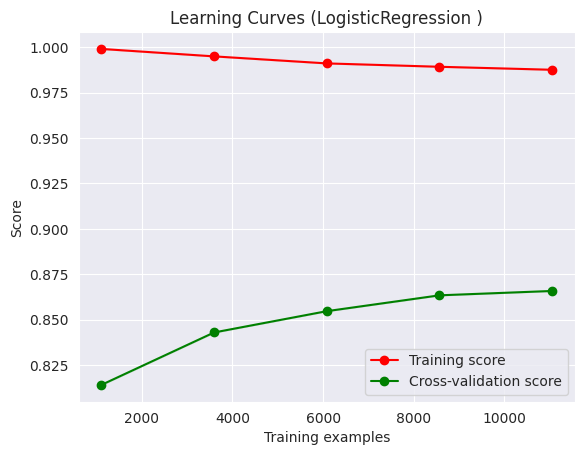


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9329    0.9307    0.9318      2642
         NOM     0.6581    0.7247    0.6898       247
         OFG     0.0923    0.1395    0.1111        43
         OFP     0.6804    0.6114    0.6441       404

    accuracy                         0.8666      3336
   macro avg     0.5909    0.6016    0.5942      3336
weighted avg     0.8711    0.8666    0.8685      3336



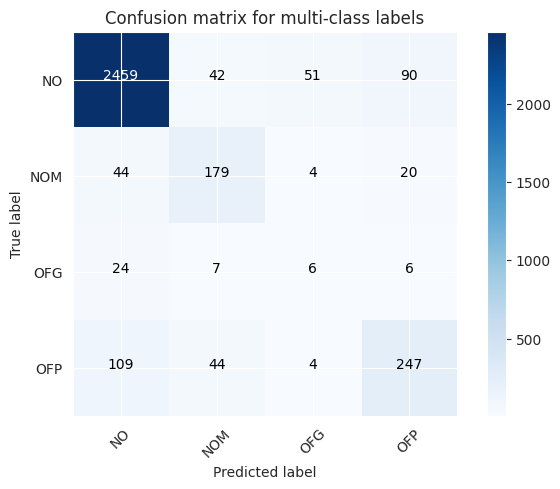

Test Accuracy: 0.8666
Test macro-F1: 0.5942


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6145    0.5884    0.6011       447
     no_hate     0.9367    0.9429    0.9398      2889

    accuracy                         0.8954      3336
   macro avg     0.7756    0.7656    0.7705      3336
weighted avg     0.8935    0.8954    0.8944      3336



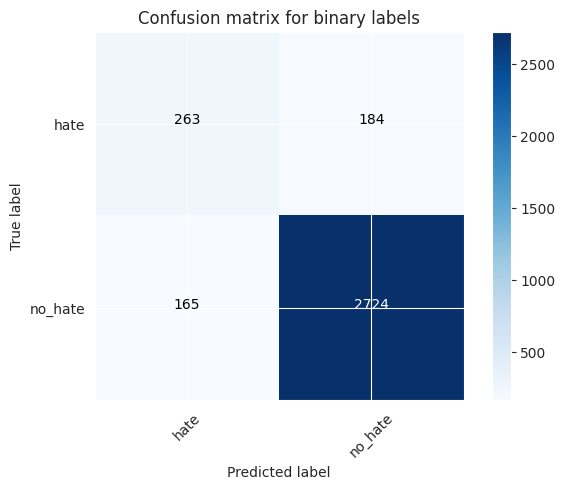

Test Accuracy: 0.8954
Test macro-F1: 0.7705




CPU times: user 44min 36s, sys: 23.5 s, total: 45min
Wall time: 2h 18min 22s


In [9]:
%%time
train_conditions: list[dict] = [
    {
        "name": "tf-2",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 2))
    },
    {
        "name": "tf-3",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 3))
    },
    {
        "name": "tf-idf-2",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 2))
    },
    {
        "name": "tf-idf-3",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

max_ent_grid = [
    {'penalty': [None], "solver": ["lbfgs"], "max_iter": [500]},  # the simplest
    {'penalty': ['l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], "solver": ["lbfgs"], "max_iter": [500]},
    {'penalty': ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], "solver": ["liblinear"], "max_iter": [5000]}
]

for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")

    for dataset_folder in [dataset_v6_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        model: MLClassifier = MLClassifier(LogisticRegression(class_weight="balanced"),
                                           vectorizer=vectorizer,
                                           optimization_grid=max_ent_grid,
                                           feat_selector=None)

        x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                          x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

        model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
        # TESTING =================>
        model.predict_with_report(x_test=x_test, y_true=y_test)

A pesar de los esfuerzos tomados para lograr una mejor performance a través de los datos, apenas mejoramos la performance anterior. En este caso, **obtenemos una performance de 61.13% de macro-f1 (multi-class) y 78.80% de macro-f1 (binary)**.

Los problemas que seguimos viendo sobre el test set, siguen siendo los mismos de antes, y están enfocados sobre la clase `OFG` principalmente.

### SVM

Repetiremos ahora la misma prueba de estreategia balanceada para el cómputo de la loss pero usando SVM, ya que era el otro modelo que nos había dado los mejores resultados.

TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation set
Fitting 1 folds for each of 50 candidates,

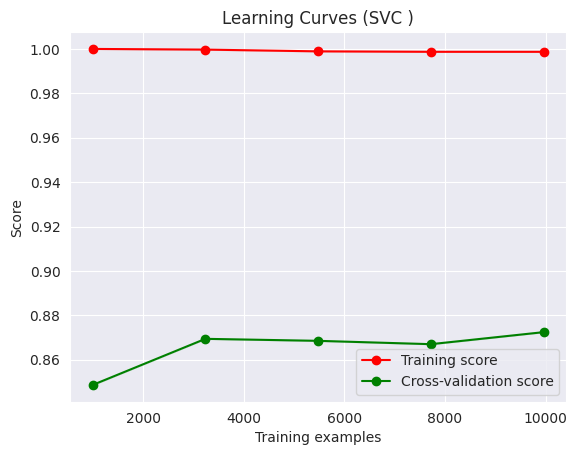


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9224    0.9444    0.9332      2642
         NOM     0.6444    0.6235    0.6337       247
         OFG     0.2857    0.0465    0.0800        43
         OFP     0.6104    0.5817    0.5957       404

    accuracy                         0.8651      3336
   macro avg     0.6157    0.5490    0.5607      3336
weighted avg     0.8558    0.8651    0.8592      3336



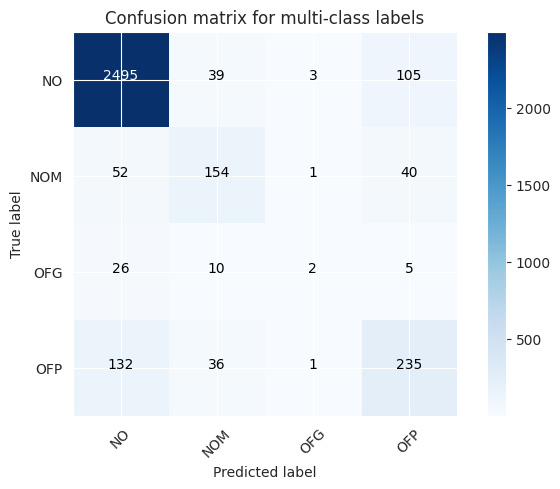

Test Accuracy: 0.8651
Test macro-F1: 0.5607


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6199    0.5436    0.5793       447
     no_hate     0.9307    0.9484    0.9395      2889

    accuracy                         0.8942      3336
   macro avg     0.7753    0.7460    0.7594      3336
weighted avg     0.8891    0.8942    0.8912      3336



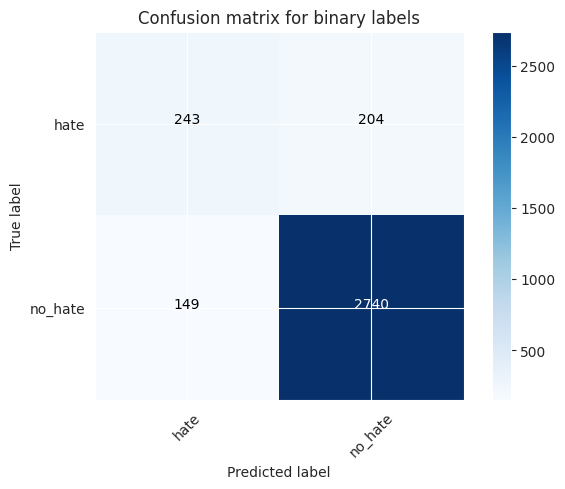

Test Accuracy: 0.8942
Test macro-F1: 0.7594




TRAINING condition: 'tf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validatio

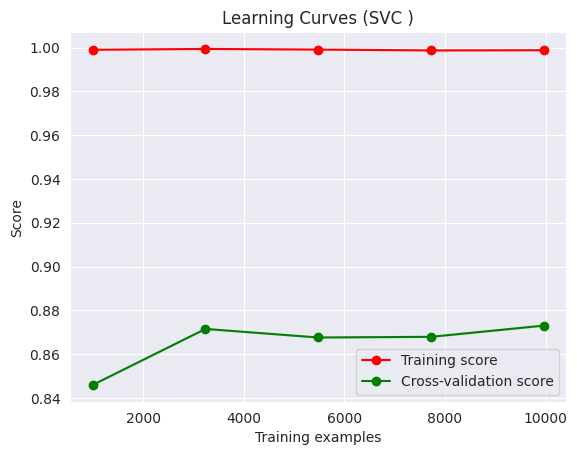


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9249    0.9368    0.9308      2642
         NOM     0.6393    0.6316    0.6354       247
         OFG     0.2500    0.0465    0.0784        43
         OFP     0.5809    0.5866    0.5837       404

    accuracy                         0.8603      3336
   macro avg     0.5988    0.5504    0.5571      3336
weighted avg     0.8534    0.8603    0.8559      3336



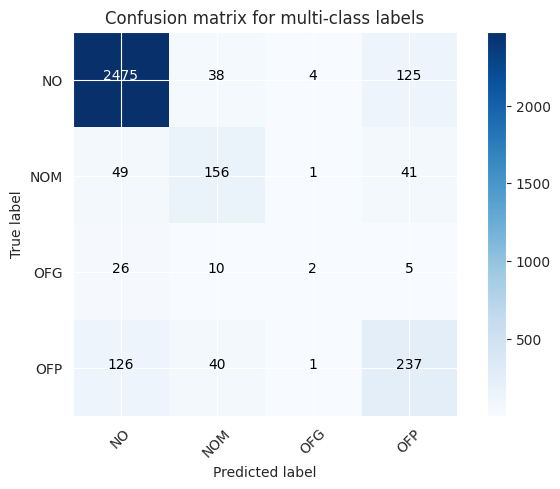

Test Accuracy: 0.8603
Test macro-F1: 0.5571


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.5889    0.5481    0.5678       447
     no_hate     0.9308    0.9408    0.9358      2889

    accuracy                         0.8882      3336
   macro avg     0.7599    0.7445    0.7518      3336
weighted avg     0.8850    0.8882    0.8865      3336



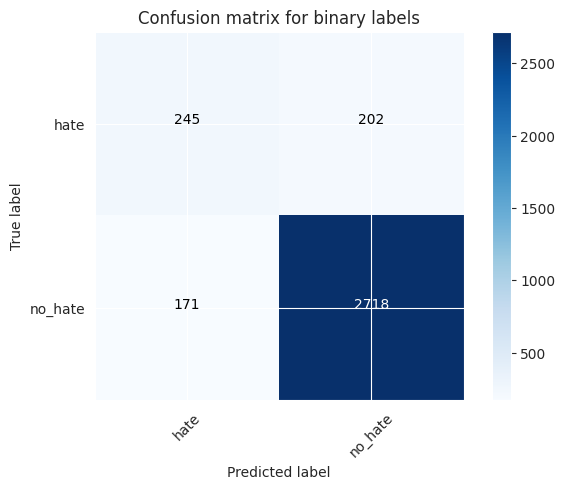

Test Accuracy: 0.8882
Test macro-F1: 0.7518




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label e

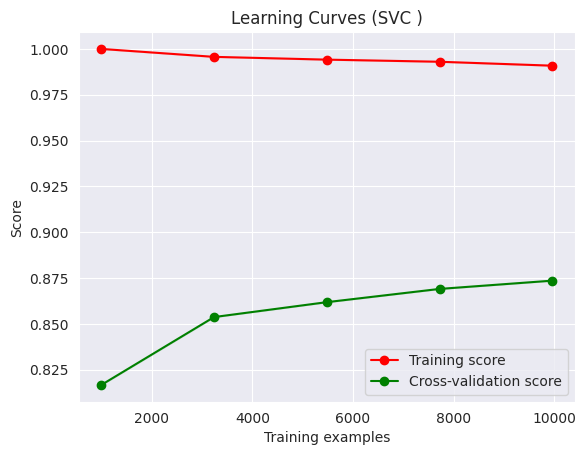


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9290    0.9508    0.9398      2642
         NOM     0.6578    0.7004    0.6784       247
         OFG     0.2500    0.0465    0.0784        43
         OFP     0.6925    0.6188    0.6536       404

    accuracy                         0.8804      3336
   macro avg     0.6323    0.5791    0.5876      3336
weighted avg     0.8715    0.8804    0.8747      3336



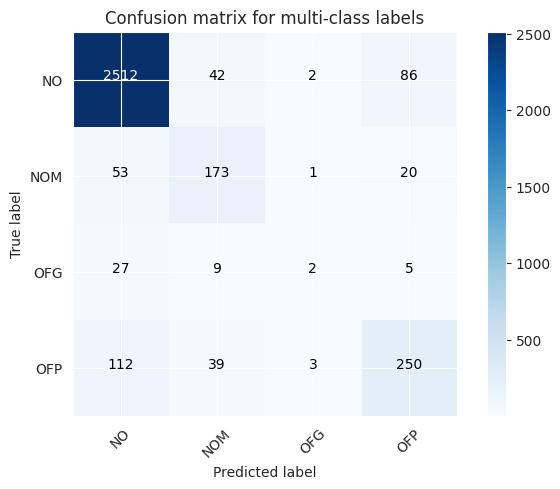

Test Accuracy: 0.8804
Test macro-F1: 0.5876


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.7046    0.5817    0.6373       447
     no_hate     0.9370    0.9623    0.9495      2889

    accuracy                         0.9113      3336
   macro avg     0.8208    0.7720    0.7934      3336
weighted avg     0.9058    0.9113    0.9076      3336



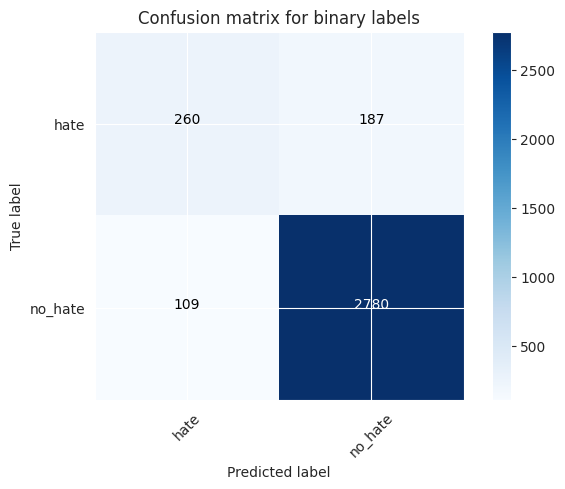

Test Accuracy: 0.9113
Test macro-F1: 0.7934




TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v1' ========
Total elements for train: 9960
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label e

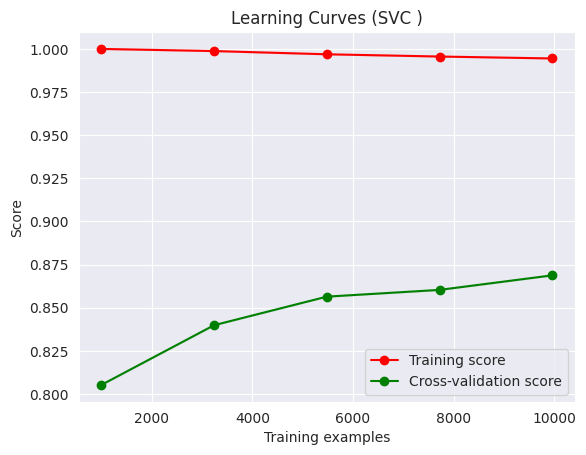


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9267    0.9527    0.9395      2642
         NOM     0.6566    0.7045    0.6797       247
         OFG     0.2222    0.0465    0.0769        43
         OFP     0.7081    0.6064    0.6533       404

    accuracy                         0.8807      3336
   macro avg     0.6284    0.5775    0.5874      3336
weighted avg     0.8712    0.8807    0.8745      3336



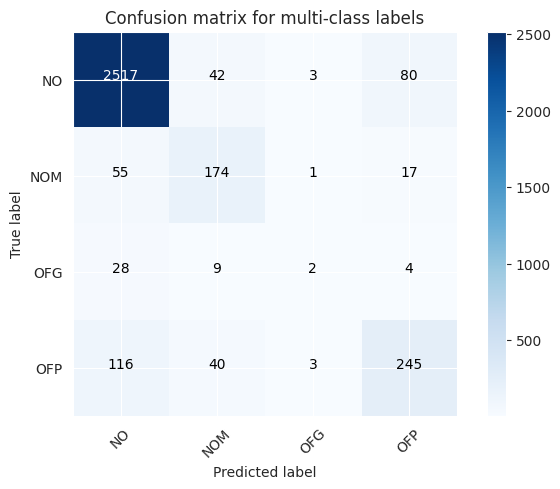

Test Accuracy: 0.8807
Test macro-F1: 0.5874


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.7155    0.5682    0.6334       447
     no_hate     0.9353    0.9650    0.9499      2889

    accuracy                         0.9119      3336
   macro avg     0.8254    0.7666    0.7917      3336
weighted avg     0.9058    0.9119    0.9075      3336



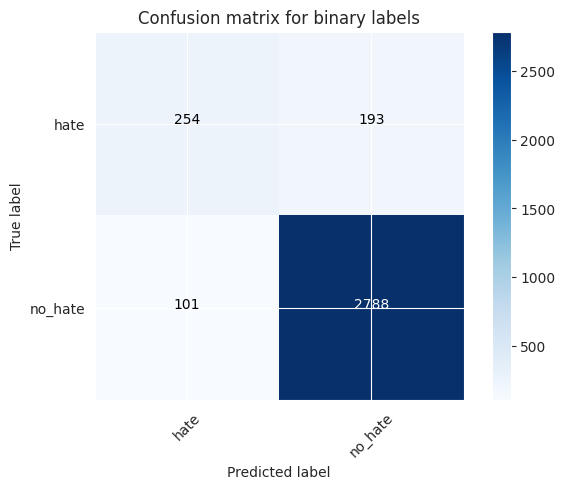

Test Accuracy: 0.9119
Test macro-F1: 0.7917




CPU times: user 9min 30s, sys: 6.9 s, total: 9min 37s
Wall time: 51min 19s


In [18]:
%%time
train_conditions: list[dict] = [
    {
        "name": "tf-2",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 2))
    },
    {
        "name": "tf-3",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 3))
    },
    {
        "name": "tf-idf-2",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 2))
    },
    {
        "name": "tf-idf-3",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

svm_grid = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 'kernel': ['linear', 'rbf']}
for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")

    for dataset_folder in [dataset_v1_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        model: MLClassifier = MLClassifier(estimator=SVC(class_weight="balanced"),
                                           vectorizer=vectorizer,
                                           optimization_grid=svm_grid,
                                           feat_selector=None)

        x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                          x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

        model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
        # TESTING =================>
        model.predict_with_report(x_test=x_test, y_true=y_test)

En este caso, obtenemos una **performance de 58.76% de macro-f1 (multi-class) y 79.34% de macro-f1 (binary)**. Esta performance es ligeramente superior que la obtenida antes cuando duplicamos los datos con Random Over Sampling. Nuevamente esta técnica nos da mejores resultados inclusive para otro modelo diferente.

Repetiremos ahora esta prueba pero contra `v6`, como para ver si obtenemos una ganancia o no al haber incrementado los datos de la clase `OFG`.

TRAINING condition: 'tf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v6' ========
Total elements for train: 11059
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validation set
Fitting 1 folds for each of 50 candidates

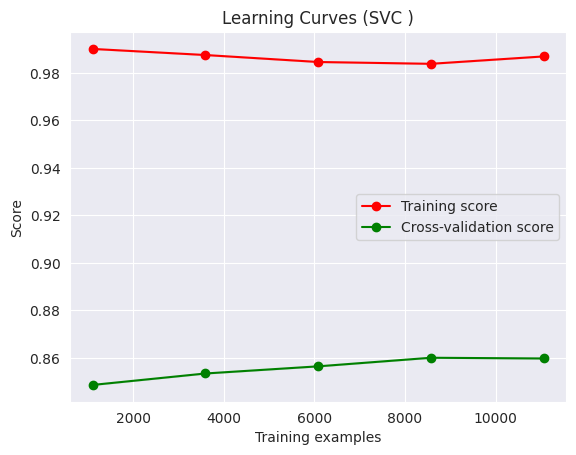


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9319    0.9322    0.9321      2642
         NOM     0.6287    0.6923    0.6590       247
         OFG     0.1905    0.0930    0.1250        43
         OFP     0.6150    0.6089    0.6119       404

    accuracy                         0.8645      3336
   macro avg     0.5915    0.5816    0.5820      3336
weighted avg     0.8615    0.8645    0.8627      3336



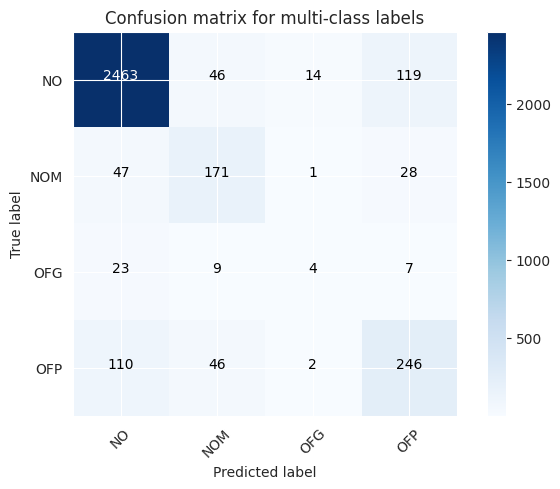

Test Accuracy: 0.8645
Test macro-F1: 0.582


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6152    0.5794    0.5968       447
     no_hate     0.9355    0.9439    0.9397      2889

    accuracy                         0.8951      3336
   macro avg     0.7754    0.7617    0.7682      3336
weighted avg     0.8926    0.8951    0.8937      3336



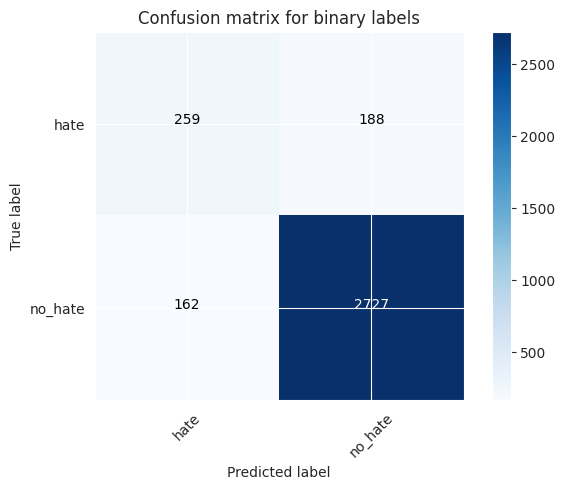

Test Accuracy: 0.8951
Test macro-F1: 0.7682




TRAINING condition: 'tf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v6' ========
Total elements for train: 11059
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.CountVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.int64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'preprocessor': None, 'stop_words': None, 'strip_accents': None, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'vocabulary': None}
Training feature extractor on x_train...
Feature extractor trained!
Training label encoder on y_train
Label encoder trained!
Training classifier with predefined split given by the validati

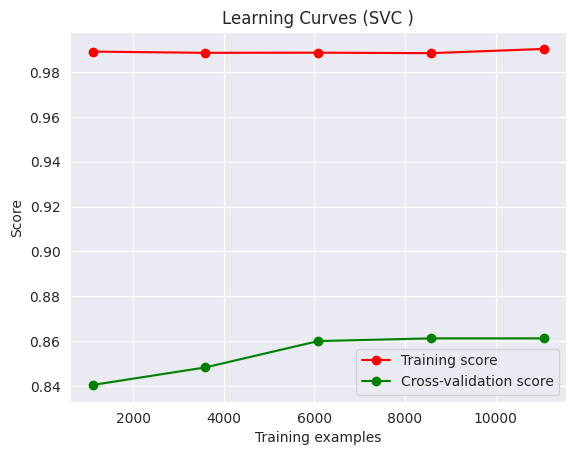


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9352    0.9171    0.9260      2642
         NOM     0.6282    0.7045    0.6641       247
         OFG     0.1538    0.0930    0.1159        43
         OFP     0.5724    0.6262    0.5981       404

    accuracy                         0.8555      3336
   macro avg     0.5724    0.5852    0.5761      3336
weighted avg     0.8584    0.8555    0.8565      3336



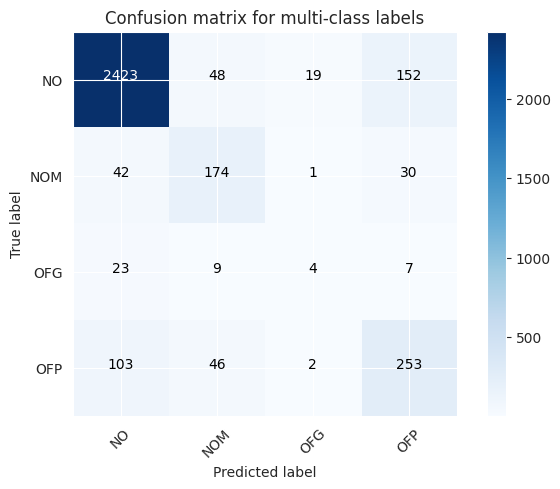

Test Accuracy: 0.8555
Test macro-F1: 0.5761


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.5684    0.5951    0.5814       447
     no_hate     0.9369    0.9301    0.9335      2889

    accuracy                         0.8852      3336
   macro avg     0.7526    0.7626    0.7574      3336
weighted avg     0.8875    0.8852    0.8863      3336



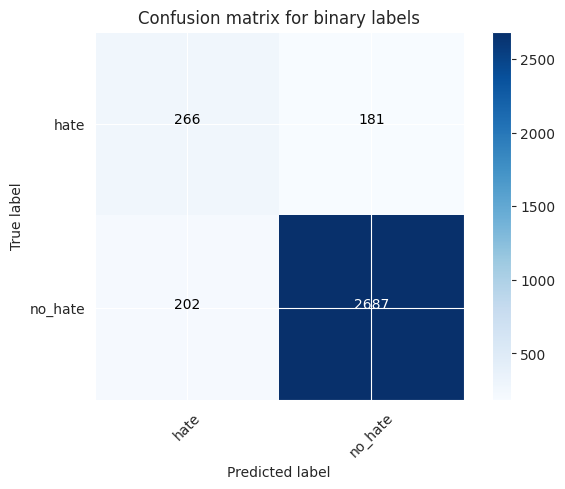

Test Accuracy: 0.8852
Test macro-F1: 0.7574




TRAINING condition: 'tf-idf-2' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v6' ========
Total elements for train: 11059
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 2), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
[CV 1/1] END .....C=0.1, gamma=0.01, kernel=rbf;, score=0.636 total

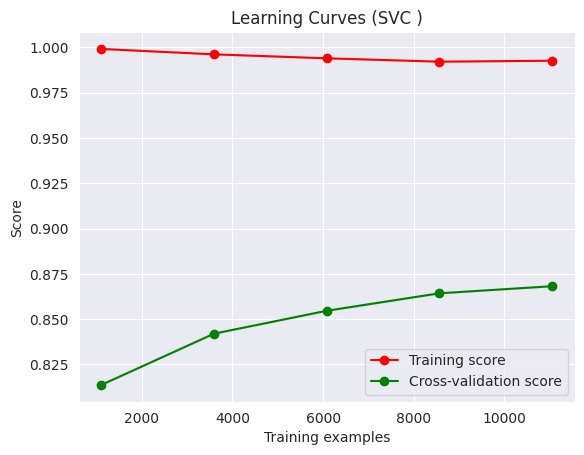


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9296    0.9489    0.9391      2642
         NOM     0.6641    0.6964    0.6798       247
         OFG     0.2083    0.1163    0.1493        43
         OFP     0.7022    0.6188    0.6579       404

    accuracy                         0.8795      3336
   macro avg     0.6261    0.5951    0.6065      3336
weighted avg     0.8731    0.8795    0.8757      3336



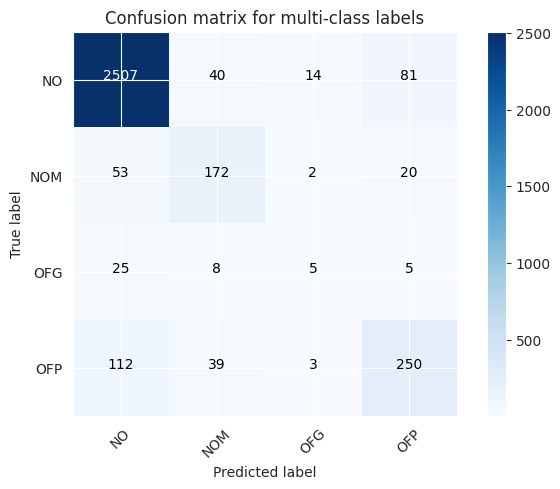

Test Accuracy: 0.8795
Test macro-F1: 0.6065


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6921    0.5884    0.6360       447
     no_hate     0.9378    0.9595    0.9485      2889

    accuracy                         0.9098      3336
   macro avg     0.8149    0.7739    0.7923      3336
weighted avg     0.9048    0.9098    0.9066      3336



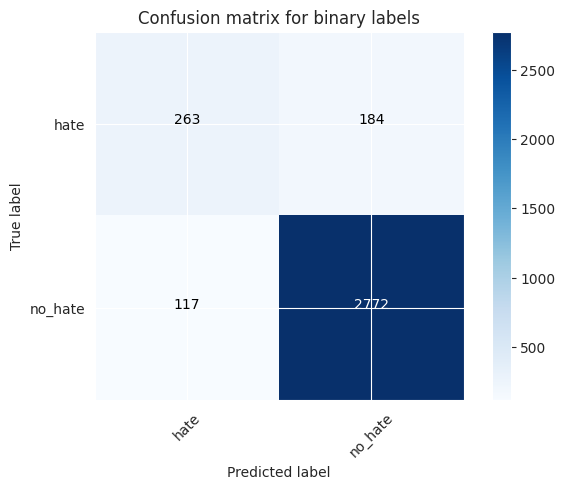

Test Accuracy: 0.9098
Test macro-F1: 0.7923




TRAINING condition: 'tf-idf-3' ==================
Dataset: '/home/lucas/Desktop/Personal/master_nlp/RedesNeuronalesNLP/Practica_Final/challenge/experiment_output/PracticaFinal_AlvarezLacasaLucas_1/v6' ========
Total elements for train: 11059
Total elements for val: 3323
Total elements for test: 3336
Vectorizer class used: '<class 'sklearn.feature_extraction.text.TfidfVectorizer'>' with config: {'analyzer': 'word', 'binary': False, 'decode_error': 'strict', 'dtype': <class 'numpy.float64'>, 'encoding': 'utf-8', 'input': 'content', 'lowercase': True, 'max_df': 1.0, 'max_features': None, 'min_df': 1, 'ngram_range': (1, 3), 'norm': 'l2', 'preprocessor': None, 'smooth_idf': True, 'stop_words': None, 'strip_accents': None, 'sublinear_tf': False, 'token_pattern': '(?u)\\b\\w\\w+\\b', 'tokenizer': None, 'use_idf': True, 'vocabulary': None}
Training feature extractor on x_train...
[CV 1/1] END ..........C=1, gamma=1, kernel=rbf;, score=0.845 total

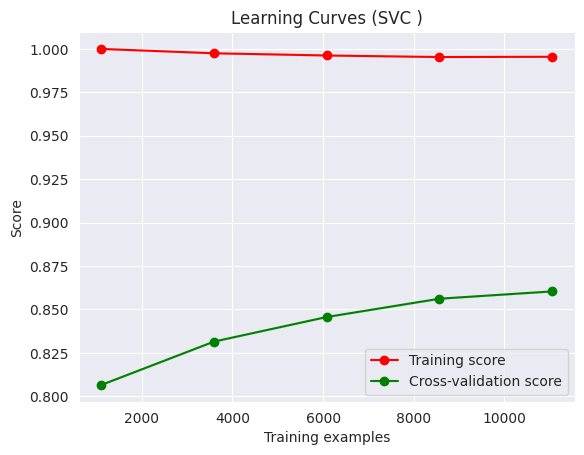


 TEST SET REPORT (MULTI-CLASS) =================================
              precision    recall  f1-score   support

          NO     0.9279    0.9497    0.9386      2642
         NOM     0.6615    0.6964    0.6785       247
         OFG     0.1852    0.1163    0.1429        43
         OFP     0.7159    0.6114    0.6595       404

    accuracy                         0.8792      3336
   macro avg     0.6226    0.5934    0.6049      3336
weighted avg     0.8729    0.8792    0.8753      3336



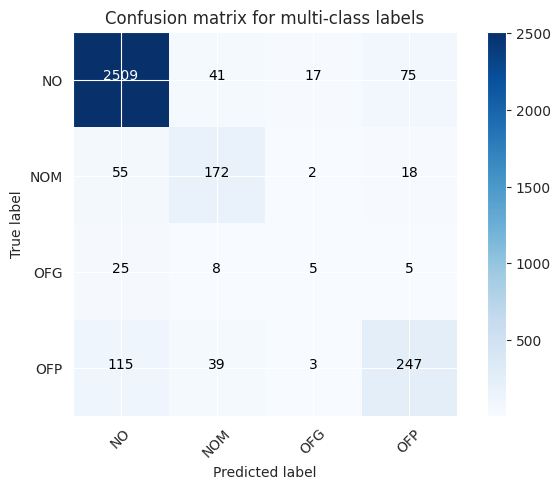

Test Accuracy: 0.8792
Test macro-F1: 0.6049


 TEST SET REPORT (BINARY-CLASS) =================================
              precision    recall  f1-score   support

        hate     0.6989    0.5817    0.6349       447
     no_hate     0.9369    0.9612    0.9489      2889

    accuracy                         0.9104      3336
   macro avg     0.8179    0.7714    0.7919      3336
weighted avg     0.9050    0.9104    0.9068      3336



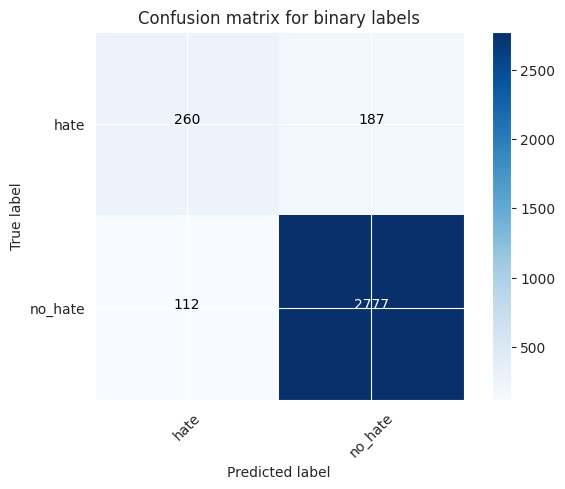

Test Accuracy: 0.9104
Test macro-F1: 0.7919




CPU times: user 13min 55s, sys: 10.3 s, total: 14min 5s
Wall time: 1h 9min 41s


In [10]:
%%time
train_conditions: list[dict] = [
    {
        "name": "tf-2",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 2))
    },
    {
        "name": "tf-3",
        "vectorizer": CountVectorizer(analyzer="word", ngram_range=(1, 3))
    },
    {
        "name": "tf-idf-2",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 2))
    },
    {
        "name": "tf-idf-3",
        "vectorizer": TfidfVectorizer(analyzer="word", norm="l2", ngram_range=(1, 3))
    }
]

svm_grid = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 'kernel': ['linear', 'rbf']}
for train_condition in train_conditions:
    condition_name: str = train_condition["name"]
    vectorizer = train_condition["vectorizer"]
    print(f"TRAINING condition: '{condition_name}' ==================")

    for dataset_folder in [dataset_v6_folder]:
        # TRAINING & VALIDATION ===============>
        print(f"Dataset: '{dataset_folder}' ========")
        x_y_data: dict = prepare_data_for_training(dataset_folder=dataset_folder)

        print(f"Vectorizer class used: '{type(vectorizer)}' with config: {vectorizer.get_params()}")

        model: MLClassifier = MLClassifier(estimator=SVC(class_weight="balanced"),
                                           vectorizer=vectorizer,
                                           optimization_grid=svm_grid,
                                           feat_selector=None)

        x_train, y_train, x_val, y_val, x_test, y_test = (x_y_data["x_train"], x_y_data["y_train"], x_y_data["x_val"],
                                                          x_y_data["y_val"], x_y_data["x_test"], x_y_data["y_test"],)

        model.train(x_train=x_train, y_train=y_train, x_val=x_val, y_val=y_val)
        # TESTING =================>
        model.predict_with_report(x_test=x_test, y_true=y_test)

En este caso, **obtenemos una performance de 60.65% de macro-f1 (multi-class) y 79.23% de macro-f1 (binary)**. No está mal pensar que estamos ganando casi dos puntos de incremento sobre multi-class sólo por el hecho de haber mejorado el training set. Sin embargo, este incremento lejos está de lo que esperábamos obtener al mejorar los datos para `OFG`.

# Conclusiones y Resultados

Realizamos varias pruebas con distintos modelos basados en algoritmos de Machine Learning. 
Nos enfocamos principalmente en algoritmos que históricamente han demostrado tener muy buena performance para hate-speech detection, como `SVMs`, `Logistic Regression` y `XGBoost`.

Partiendo del dataset con un ligero cleanup, comenzamos teniendo rendimientos realmente muy malos. Logramos mejorar esta situación notablemente al aplicar Random Over Sampling, y construir un dataset más balanceado o al aplicar `class_weight="balanced"` a nuestros algoritmos para balancear el peso que cada sample aporta a la función de pérdida en función de qué tan representativa es su clase. Esto nos dió un boost de casi 20 puntos de performance. 
Por otro lado, pusimos esfuerzo por mejorar aún más el train set, aumentando a través de generación de ejemplos sintéticos con ChatGPT la clase minoritaria `OFG` (que fue la que más problemas nos traia). Esto nos dio un incremento de performance pero bastante bajo (entre 1 y 2 puntos de macro-f1 multi-class).

Como conclusiones adicionales:
- En general, utilizar `tf-idf` con ngrams=(1,2) o (1,3) nos da la mejor performance para todos los modelos. `tf` suele darnos mejor performance que `tf-idf`.
- 🏅 **LogisticRegression**, con un 61.13% de macro-f1 es el mejor modelo para MULTI-CLASS. 
- 🏅 **SVM**, con 79.23% de macro-f1 es el mejor modelo para BINARY-CLASSIFICATION.
- Naive Bayes es menos efectivo en comparación con otros algoritmos. Random Forests y XGBoost se benefician de la selección de características chi2, pero pueden necesitar un ajuste adicional para tareas de clasificación MULTI-CLASS. Notar que en estos dos últimos casos no entrenamos sin selección de features debido al extenso tiempo que lleva su entrenamiento.
- Si la velocidad de inferencia en producción fuese un factor crítico, podríamos ir con `LogisticRegression` como el mejor modelo. Si podemos tolerar un pelín más de lentitud, `SVM` desde mi punto de vista es el ganador para esta primera práctica.

El resumen de los mejores resultados se presenta en la siguiente tabla. _Notar que `MC` significa `MULTI-CLASS` y `BC` hace referencia a la performance para `BINARY-CLASS`_.

<br>

| Model              | Model Size | Dataset | Representation                                                     | macro-precision (MC) | macro-recall (MC) | macro-F1 (MC) | macro-precision (BC) | macro-recall (BC) | macro-F1 (BC) | Config highlights                                        |
| ------------------ | ---------- | ------- | ------------------------------------------------------------------ |----------------------|---------------|---------------|----------------------|---------------|---------------| -------------------------------------------------------- |
| Naive Bayes        |            | v2      | BOW: tf-idf<br>Level: word<br>N-grams: (1.3)                       | 0.6000               | 0.5700        | 0.5706        | 0.7900               | 0.7500        | 0.7693        | \-                                                       |
| LogisticRegression |            | v2      | BOW: tf-idf<br>Level: word<br>N-grams: (1.2)                       | 0.6242               | 0.6001        | **0.6113**    | 0.8045               | 0.7739        | 0.7880        | (C=10, class_weight='balanced', max_iter=500)            |
| SVM                |            | v2      | BOW: tf-idf<br>Level: word<br>N-grams: (1.2)                       | 0.6261               | 0.5951        | 0.6065        | 0.8149               | 0.7739        | **0.7923**    | (C=1, class_weight='balanced', gamma=1, kernel='linear') |
| RandomForests      |            | v2      | BOW: tf-idf<br>Level: word<br>N-grams: (1.3)<br>Method: chi2 - 10k | 0.5662               | 0.5229        | 0.5369        | 0.8153               | 0.6952        | 0.7350        | \-                                                       |
| XGBoost            |            | v2      | BOW: tf-idf<br>Level: word<br>N-grams: (1.3)<br>Method: chi2 - 10k | 0.5915               | 0.5579        | 0.5639        | 0.7961               | 0.7342        | 0.7597        | (learning_rate=0.1, max_depth=16, n_estimators=512)      |

<br>


_Los resultados de este notebook y del resto, pueden visualizarse en el siguiente [Google Spreadsheet](https://docs.google.com/spreadsheets/d/1mzY6YMFSP3kXgH3qgbJnX1w0f463ZQ06n32tLGgqOos/edit?usp=sharing). Para más información, dirigirse a `5_results_and_conclusions.ipynb`, la cual también los muestra y concluye nuestra práctica._
